# July 1 marked-dipper optical + WISE + SED atlas

This standalone workbench reads the July 1 review database in read-only mode and builds one vertically stacked, standard one-column figure for every candidate currently marked `dipper`:

1. one shared, median-centered light-curve panel containing ASAS-SN `V`/`g` plus contemporaneous NEOWISE W1/W2 on the common `JD - 2458000` time axis;
2. the stored stellar-photosphere SED and photometric points, using the same geometry and styling as the SED-only atlas.

A normal **Run All** displays the complete live cohort inline. PDF export is separate and disabled by default.


## Setup


In [1]:
from __future__ import annotations

from io import BytesIO
from pathlib import Path
import json
import math
import re
import sqlite3
import sys
import warnings

import numpy as np
import pandas as pd
import astropy.units as u
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord
from IPython.display import display
from matplotlib.backends.backend_pdf import PdfPages


def find_repo_root(start: Path | None = None) -> Path:
    start = (start or Path.cwd()).resolve()
    for path in (start, *start.parents):
        if (path / 'pyproject.toml').exists() and (path / 'malca').is_dir():
            return path
    raise FileNotFoundError('Could not locate the MALCA repository root.')


REPO_ROOT = find_repo_root()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from malca.plotting import lightcurve_publication as lc_pub
from malca.plotting.lightcurve_publication import (
    FIG_SINGLE_COL_WIDTH,
    PUBLICATION_STYLE,
    filter_lightcurve,
    load_lightcurve,
    plot_lightcurve_panel,
)
from malca.review.lightcurve_sources import discover_external_lcs, load_external_lc_frame
from malca.review.sed import build_sed_dataframe

plt.rcParams.update(PUBLICATION_STYLE)

warnings.filterwarnings(
    'ignore',
    message='The behavior of DataFrame concatenation with empty or all-NA entries is deprecated.*',
    category=FutureWarning,
)
pd.set_option('display.max_columns', 120)
pd.set_option('display.width', 220)

# Keep MALCA's optical colors and use the review UI's canonical WISE colors.
lc_pub.BAND_COLORS.update({'W1': '#4fa3ff', 'W2': '#ff8c42'})


## Configuration and read-only preflight


In [2]:
RUN_DIR = REPO_ROOT / 'output' / 'runs' / 'dat3-full-extended_2026-07-01-v4'
DB_PATH = RUN_DIR / 'review' / 'review.db'
EXTERNAL_LC_DIR = RUN_DIR / 'results' / 'external_lcs'
OUTPUT_DIR = RUN_DIR / 'results' / 'marked_dipper_optical_wise_sed_atlas'
PDF_DIR = OUTPUT_DIR / 'pdf'

DIPPER_WHERE = "lower(trim(r.event_class)) = 'dipper'"
DISPLAY_ALL = True
DISPLAY_LIMIT = None        # integer limit for a quick development check
EXPORT_ALL = True
EXPORT_LIMIT = None         # integer limit for an export smoke test
MERGE_PDF_ATLAS = True

if not DB_PATH.exists():
    raise FileNotFoundError(DB_PATH)
if not EXTERNAL_LC_DIR.exists():
    raise FileNotFoundError(EXTERNAL_LC_DIR)


def connect_readonly(db_path: Path = DB_PATH) -> sqlite3.Connection:
    return sqlite3.connect(f'file:{db_path.resolve()}?mode=ro', uri=True)


with connect_readonly() as conn:
    integrity = conn.execute('PRAGMA quick_check').fetchone()[0]

print(f'RUN_DIR         = {RUN_DIR}')
print(f'DB_PATH         = {DB_PATH}')
print(f'EXTERNAL_LC_DIR = {EXTERNAL_LC_DIR}')
print(f'OUTPUT_DIR      = {OUTPUT_DIR}')
print(f'DB mode         = read-only; quick_check={integrity}')


RUN_DIR         = /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4
DB_PATH         = /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/review/review.db
EXTERNAL_LC_DIR = /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/results/external_lcs
OUTPUT_DIR      = /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/results/marked_dipper_optical_wise_sed_atlas
DB mode         = read-only; quick_check=ok


## Load the live marked-dipper cohort and stored SED products


In [3]:
with connect_readonly() as conn:
    dippers = pd.read_sql_query(
        f'''
        SELECT c.*, r.event_class, r.status AS review_status,
               r.workflow_status, r.disposition, NULL AS interest_score,
               r.morphology_primary, r.morphology_secondary,
               r.physical_primary, r.physical_secondary,
               r.classification_confidence, r.notes AS review_notes,
               r.updated_at AS review_updated_at
        FROM reviews AS r
        JOIN candidates AS c USING(candidate_id)
        WHERE {DIPPER_WHERE}
        ORDER BY r.updated_at DESC, r.candidate_id
        ''',
        conn,
    )

    candidate_ids = dippers['candidate_id'].astype(str).tolist()
    if not candidate_ids:
        raise RuntimeError('No candidates currently satisfy the marked-dipper selector.')
    placeholders = ','.join(['?'] * len(candidate_ids))

    sed_photometry = pd.read_sql_query(
        f'SELECT * FROM sed_photometry WHERE candidate_id IN ({placeholders})',
        conn, params=candidate_ids,
    )
    sed_model_fits = pd.read_sql_query(
        f'SELECT * FROM sed_model_fits WHERE candidate_id IN ({placeholders})',
        conn, params=candidate_ids,
    )
    sed_model_curves = pd.read_sql_query(
        f'SELECT * FROM sed_model_curves WHERE candidate_id IN ({placeholders})',
        conn, params=candidate_ids,
    )

for frame in (dippers, sed_photometry, sed_model_fits, sed_model_curves):
    frame['candidate_id'] = frame['candidate_id'].astype(str)

dippers_by_id = dippers.set_index('candidate_id', drop=False)
photometry_by_id = {cid: grp.copy() for cid, grp in sed_photometry.groupby('candidate_id', sort=False)}
fits_by_id = {cid: grp.copy() for cid, grp in sed_model_fits.groupby('candidate_id', sort=False)}
curves_by_id = {cid: grp.copy() for cid, grp in sed_model_curves.groupby('candidate_id', sort=False)}

print(f'Marked dippers:      {len(dippers):,}')
print(f'SED photometry rows: {len(sed_photometry):,}')
print(f'SED fit rows:        {len(sed_model_fits):,}')
print(f'SED curve rows:      {len(sed_model_curves):,}')


Marked dippers:      164
SED photometry rows: 1,914
SED fit rows:        164
SED curve rows:      65,056


## Shared data and plotting helpers


In [4]:
def clean_value(value):
    try:
        missing = pd.isna(value)
        if isinstance(missing, (bool, np.bool_)) and missing:
            return None
    except Exception:
        pass
    if isinstance(value, np.integer):
        return int(value)
    if isinstance(value, np.floating):
        return float(value)
    return value


def payload_for(candidate_id: str) -> dict[str, object]:
    row = dippers_by_id.loc[str(candidate_id)]
    payload: dict[str, object] = {}
    raw = row.get('payload_json')
    if isinstance(raw, str) and raw.strip():
        try:
            parsed = json.loads(raw)
            if isinstance(parsed, dict):
                payload.update(parsed)
        except json.JSONDecodeError:
            pass
    for key, value in row.items():
        cleaned = clean_value(value)
        if cleaned is not None:
            payload[key] = cleaned
    payload['candidate_id'] = str(candidate_id)
    return payload


def _finite_text(value, fmt: str) -> str | None:
    try:
        number = float(value)
    except (TypeError, ValueError):
        return None
    return format(number, fmt) if math.isfinite(number) else None


def coordinate_name(candidate_id: str) -> str:
    row = dippers_by_id.loc[str(candidate_id)]
    ra = pd.to_numeric(row.get('ra'), errors='coerce')
    dec = pd.to_numeric(row.get('dec'), errors='coerce')
    if not (np.isfinite(ra) and np.isfinite(dec)):
        return str(candidate_id)
    coord = SkyCoord(float(ra) * u.deg, float(dec) * u.deg, frame='icrs')
    ra_text = coord.ra.to_string(unit=u.hourangle, sep='', precision=0, pad=True)
    dec_text = coord.dec.to_string(unit=u.deg, sep='', precision=0, pad=True, alwayssign=True)
    return f'J{ra_text}{dec_text}'


def fit_summary(candidate_id: str) -> dict[str, object]:
    rows = fits_by_id.get(str(candidate_id), pd.DataFrame())
    return {} if rows.empty else rows.iloc[0].to_dict()


def sed_points_for(candidate_id: str) -> pd.DataFrame:
    candidate_id = str(candidate_id)
    return build_sed_dataframe(
        payload_for(candidate_id),
        candidate_id=candidate_id,
        external_rows=photometry_by_id.get(candidate_id, pd.DataFrame()),
        extinction_mode='corrected',
    ).copy()


def resolved_neowise_path(candidate_id: str) -> Path | None:
    candidate_id = str(candidate_id)
    resolved = discover_external_lcs(
        candidate_id,
        payload_for(candidate_id),
        RUN_DIR,
        ['neowise'],
        default_results_root=RUN_DIR / 'results',
    )
    return resolved.get('neowise')


def wise_lightcurve_for(candidate_id: str) -> tuple[pd.DataFrame, list[str]]:
    parts: list[pd.DataFrame] = []
    sources: list[str] = []
    # Match the review overlay's contemporaneous WISE product. Historical
    # 2010 AllWISE multiepoch photometry is intentionally excluded.
    source, source_label = 'neowise', 'NEOWISE'
    path = resolved_neowise_path(str(candidate_id))
    if path is not None and path.exists():
        frame = load_external_lc_frame(source, path)
        if frame.empty or 'mjd' not in frame.columns:
            frame = pd.DataFrame()
        if not frame.empty:
            added = False
            for band in ('W1', 'W2'):
                key = band.lower()
                mag_col = f'{key}mpro'
                err_col = f'{key}sigmpro'
                if mag_col not in frame.columns:
                    continue
                part = pd.DataFrame({
                    'mjd': pd.to_numeric(frame['mjd'], errors='coerce'),
                    'mag': pd.to_numeric(frame[mag_col], errors='coerce'),
                    'mag_err': pd.to_numeric(frame.get(err_col), errors='coerce'),
                    'band': band,
                    'source': source_label,
                })
                part = part[np.isfinite(part['mjd']) & np.isfinite(part['mag'])].copy()
                if not part.empty:
                    parts.append(part)
                    added = True
            if added:
                sources.append(source_label)
    if not parts:
        return pd.DataFrame(columns=['mjd', 'mag', 'mag_err', 'band', 'source']), []
    combined = pd.concat(parts, ignore_index=True)
    combined = combined.drop_duplicates(subset=['mjd', 'mag', 'band']).sort_values(['mjd', 'band'])
    return combined.reset_index(drop=True), sources


In [5]:
COMBINED_STYLE = dict(PUBLICATION_STYLE)
COMBINED_STYLE.update({
    'axes.unicode_minus': False,
    'axes.labelsize': 8.0,
    'xtick.labelsize': 6.8,
    'ytick.labelsize': 6.8,
    'legend.fontsize': 6.2,
    'axes.titlesize': 8.0,
})


def _empty_panel(ax, message: str) -> None:
    ax.text(0.5, 0.5, message, transform=ax.transAxes, ha='center', va='center', fontsize=7.0)
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(0.75)


def _asassn_jd_minus_2458000(lc, plot_df: pd.DataFrame) -> pd.Series:
    time = pd.to_numeric(plot_df['time'], errors='coerce')
    finite = time[np.isfinite(time)]
    median = float(finite.median()) if not finite.empty else np.nan
    if np.isfinite(median) and median > 2_000_000:
        return time - 2_458_000.0
    if np.isfinite(median) and median > 40_000:
        return time - 57_999.5
    if np.isfinite(median) and median > 5_000:
        return time - 8_000.0
    return time


def _median_center(frame: pd.DataFrame) -> pd.DataFrame:
    out = frame.copy()
    centers = out.groupby('band', observed=True)['mag'].transform('median')
    out['centered_mag'] = out['mag'] - centers
    return out


def plot_centered_lightcurve_panel(ax, candidate_id: str) -> dict[str, dict[str, object]]:
    row = dippers_by_id.loc[str(candidate_id)]
    lc_path = Path(str(row.get('lc_path') or ''))
    optical_parts: list[pd.DataFrame] = []
    optical_status = {'status': 'missing', 'n_points': 0, 'path': str(lc_path)}
    if lc_path.exists():
        lc = load_lightcurve(lc_path)
        plot_df = filter_lightcurve(lc, max_error=1.0)
        if not plot_df.empty:
            optical = pd.DataFrame({
                'jd_minus_2458000': _asassn_jd_minus_2458000(lc, plot_df),
                'mag': pd.to_numeric(plot_df['value'], errors='coerce'),
                'mag_err': pd.to_numeric(plot_df['value_error'], errors='coerce'),
                'band': plot_df['band'].astype(str),
                'survey': 'ASAS-SN',
            })
            optical = optical[np.isfinite(optical['jd_minus_2458000']) & np.isfinite(optical['mag'])]
            if not optical.empty:
                optical_parts.append(_median_center(optical))
                optical_status = {'status': 'ok', 'n_points': len(optical), 'path': str(lc_path)}
            else:
                optical_status['status'] = 'empty'

    wise, sources = wise_lightcurve_for(candidate_id)
    wise_status = {'status': 'missing', 'n_points': 0, 'sources': ''}
    if not wise.empty:
        wise_plot = wise.copy()
        wise_plot['jd_minus_2458000'] = pd.to_numeric(wise_plot['mjd'], errors='coerce') - 57_999.5
        wise_plot = wise_plot[np.isfinite(wise_plot['jd_minus_2458000']) & np.isfinite(wise_plot['mag'])]
        if not wise_plot.empty:
            optical_parts.append(_median_center(wise_plot))
            wise_status = {
                'status': 'ok',
                'n_points': len(wise_plot),
                'sources': ' + '.join(sources),
            }

    if not optical_parts:
        _empty_panel(ax, 'No ASAS-SN or NEOWISE light curves available')
        return {'optical': optical_status, 'wise': wise_status}

    combined = pd.concat(optical_parts, ignore_index=True)
    plot_lightcurve_panel(
        ax, combined,
        group_by='band', show_errorbars=True, time_offset='none', legend='none',
        marker_size=2.2, time_col='jd_minus_2458000', value_col='centered_mag',
        error_col='mag_err', band_col='band', y_label='Relative magnitude [mag]',
        default_invert_y=True, xlabel='JD - 2458000 [d]',
        ylabel='Relative magnitude [mag]',
    )

    handles, labels = ax.get_legend_handles_labels()
    label_order = {'V': 0, 'g': 1, 'W1': 2, 'W2': 3}
    ordered = sorted(zip(handles, labels), key=lambda pair: label_order.get(pair[1], 99))
    if ordered:
        legend = ax.legend(
            [item[0] for item in ordered], [item[1] for item in ordered],
            loc='best', ncol=2,
            frameon=True, fancybox=False,
            facecolor='white', edgecolor='black', framealpha=1.0,
            borderpad=0.35, handletextpad=0.45, columnspacing=0.9,
        )
        legend.get_frame().set_linewidth(0.75)
    return {'optical': optical_status, 'wise': wise_status}


def plot_sed_panel(ax, candidate_id: str) -> dict[str, object]:
    candidate_id = str(candidate_id)
    points = sed_points_for(candidate_id)
    curve = curves_by_id.get(candidate_id, pd.DataFrame()).copy()
    fit = fit_summary(candidate_id)
    lsun_erg_s = 3.828e33

    curve_plotted = False
    if not curve.empty:
        curve_x = pd.to_numeric(curve['wavelength_angstrom'], errors='coerce').to_numpy(dtype=float)
        curve_y = pd.to_numeric(curve['lambda_l_lambda'], errors='coerce').to_numpy(dtype=float) / lsun_erg_s
        good = np.isfinite(curve_x) & np.isfinite(curve_y) & (curve_x > 0) & (curve_y > 0)
        if np.any(good):
            ax.plot(curve_x[good], curve_y[good], color='black', lw=1.0, zorder=2)
            curve_plotted = True

    x = pd.to_numeric(points.get('lambda_eff_angstrom'), errors='coerce').to_numpy(dtype=float)
    y = pd.to_numeric(points.get('lambda_l_lambda'), errors='coerce').to_numpy(dtype=float) / lsun_erg_s
    yerr = pd.to_numeric(points.get('lambda_l_lambda_err'), errors='coerce').to_numpy(dtype=float) / lsun_erg_s
    phot_good = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)

    groups = (
        (phot_good & (x < 1.0e4), '#7c89d0'),
        (phot_good & (x >= 1.0e4) & (x < 3.0e4), '#d85c70'),
        (phot_good & (x >= 3.0e4), '#e68613'),
    )
    for mask, color in groups:
        if not np.any(mask):
            continue
        with_error = mask & np.isfinite(yerr) & (yerr > 0)
        if np.any(with_error):
            ax.errorbar(
                x[with_error], y[with_error], yerr=yerr[with_error],
                fmt='none', ecolor=color, elinewidth=0.55, capsize=1.4, alpha=0.82, zorder=3,
            )
        ax.scatter(
            x[mask], y[mask], s=20, marker='o', color=color,
            edgecolor='black', linewidth=0.40, zorder=4,
        )

    ax.set_xscale('log')
    ax.set_yscale('log')
    if np.any(phot_good):
        ax.set_xlim(float(np.nanmin(x[phot_good])) * 0.76, float(np.nanmax(x[phot_good])) * 1.18)
        ax.set_ylim(float(np.nanmin(y[phot_good])) * 0.55, float(np.nanmax(y[phot_good])) * 1.65)

    bs = chr(92)
    ax.set_xlabel(f'${bs}lambda{bs},[{bs}mathrm{{{bs}AA}}]$', labelpad=2.0)
    ax.set_ylabel(f'${bs}lambda L_{{{bs}lambda}}$ [$L_{{{bs}odot}}$]', labelpad=2.5)
    ax.grid(False, which='both')
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(0.75)
    ax.tick_params(which='major', direction='in', top=True, right=True, length=3.8, width=0.75)
    ax.tick_params(which='minor', direction='in', top=True, right=True, length=2.0, width=0.6)

    row = dippers_by_id.loc[candidate_id]
    alpha = _finite_text(row.get('sed_alpha'), '+.2f')
    teff = _finite_text(fit.get('teff_k'), '.0f')
    radius = _finite_text(fit.get('radius_rsun'), '.2f')
    fit_parts = []
    fit_parts.append(f'${bs}alpha = {alpha}$' if alpha is not None else f'${bs}alpha = {bs}mathrm{{NA}}$')
    if teff is not None:
        fit_parts.append(f'$T_{{{bs}mathrm{{eff}}}} = {teff}{bs},{bs}mathrm{{K}}$')
    if radius is not None:
        fit_parts.append(f'$R = {radius}{bs},R_{{{bs}odot}}$')
    if fit_parts:
        ax.text(0.98, 0.84, '\n'.join(fit_parts), transform=ax.transAxes,
                ha='right', va='top', fontsize=7.2, color='black', zorder=7)
    sed_available = bool(curve_plotted or np.any(phot_good))
    return {'status': 'ok' if sed_available else 'missing', 'n_points': int(phot_good.sum())}


def candidate_combined_figure(candidate_id: str):
    candidate_id = str(candidate_id)
    if candidate_id not in dippers_by_id.index:
        raise KeyError(f'{candidate_id} is not in the current marked-dipper cohort.')

    with plt.rc_context(COMBINED_STYLE):
        fig, axes = plt.subplots(
            2, 1,
            figsize=(FIG_SINGLE_COL_WIDTH, 5.25),
            gridspec_kw={'height_ratios': [1.0, 1.22]},
            constrained_layout=True,
        )
        fig.patch.set_facecolor('white')
        for ax in axes:
            ax.set_facecolor('white')

        lightcurve_status = plot_centered_lightcurve_panel(axes[0], candidate_id)
        sed_status = plot_sed_panel(axes[1], candidate_id)

        axes[0].text(
            0.88, 1.0, coordinate_name(candidate_id),
            transform=axes[0].transAxes, ha='right', va='center',
            fontsize=8.8, fontweight='normal', clip_on=False, zorder=20,
            bbox={
                'boxstyle': 'square,pad=0.12',
                'facecolor': 'white',
                'edgecolor': 'black',
                'linewidth': 0.75,
            },
        )
        return fig, {
            'optical': lightcurve_status['optical'],
            'wise': lightcurve_status['wise'],
            'sed': sed_status,
        }


def display_candidate_combined(candidate_id: str):
    fig, status = candidate_combined_figure(candidate_id)
    display(fig)
    plt.close(fig)
    return status


## Live cohort coverage


In [6]:
coverage_records = []
for candidate_id in candidate_ids:
    row = dippers_by_id.loc[candidate_id]
    neowise_exists = resolved_neowise_path(candidate_id) is not None
    coverage_records.append({
        'candidate_id': candidate_id,
        'coordinate_name': coordinate_name(candidate_id),
        'optical_available': Path(str(row.get('lc_path') or '')).exists(),
        'neowise_available': neowise_exists,
        'wise_available': neowise_exists,
        'sed_photometry_available': candidate_id in photometry_by_id,
        'sed_curve_available': candidate_id in curves_by_id,
    })

coverage = pd.DataFrame(coverage_records)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
coverage_path = OUTPUT_DIR / 'marked_dipper_optical_wise_sed_coverage.csv'
coverage.to_csv(coverage_path, index=False)

summary = pd.DataFrame({
    'available': coverage.drop(columns=['candidate_id', 'coordinate_name']).sum().astype(int),
    'total': len(coverage),
})
display(summary)
missing_wise = coverage.loc[~coverage['wise_available'], ['candidate_id', 'coordinate_name']]
if not missing_wise.empty:
    print('Candidates without cached contemporaneous NEOWISE W1/W2 time series:')
    display(missing_wise)
print(f'Wrote {coverage_path}')


,available,total
optical_available,164,164
neowise_available,46,164
wise_available,46,164
sed_photometry_available,164,164
sed_curve_available,164,164


Candidates without cached contemporaneous NEOWISE W1/W2 time series:


,candidate_id,coordinate_name
4,stv_42950978749,J053304+384301
5,stv_395137147332,J072525-033530
6,stv_352187778169,J192536-131107
8,stv_188979142258,J211656+280302
9,stv_111670444883,J035431+345506
...,...,...
143,stv_481036839646,J074314-282913
149,stv_549755992463,J165223-394128
151,stv_523986354332,J182804-265615
154,stv_532576054353,J173933-701021


Wrote /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/results/marked_dipper_optical_wise_sed_atlas/marked_dipper_optical_wise_sed_coverage.csv


## One-candidate preview


Preview candidate: stv_549756696622 (J070516-223804)


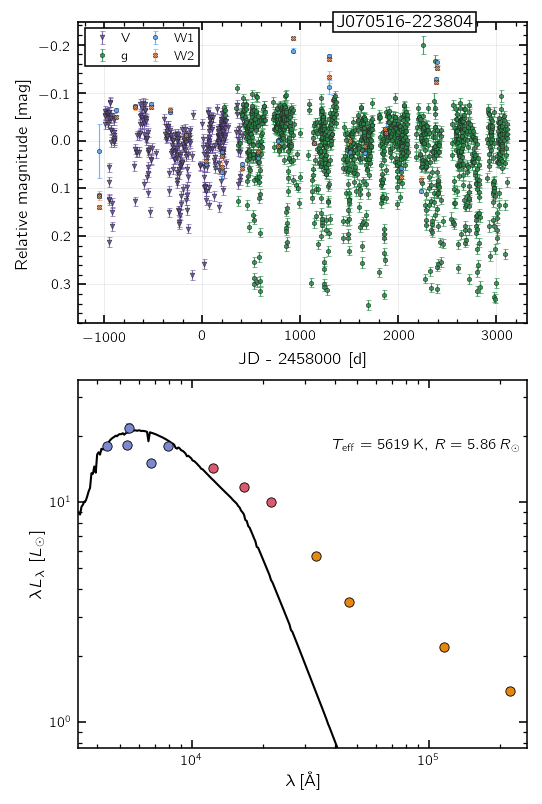

,status,n_points,path,sources
optical,ok,1432,/Users/calder/code/malca/output/runs/dat3-full...,NaN
wise,ok,50,NaN,NEOWISE
sed,ok,12,NaN,NaN


In [7]:
preview_pool = coverage.loc[coverage['neowise_available'], 'candidate_id']
if preview_pool.empty:
    preview_pool = coverage.loc[coverage['wise_available'], 'candidate_id']
preview_id = preview_pool.iloc[0]
print(f'Preview candidate: {preview_id} ({coordinate_name(preview_id)})')
preview_status = display_candidate_combined(preview_id)
display(pd.DataFrame(preview_status).T)


## Every marked-dipper combined figure

A normal Run All renders the complete live cohort at the standard 3.5-inch one-column width. Set `DISPLAY_LIMIT` only for development checks.


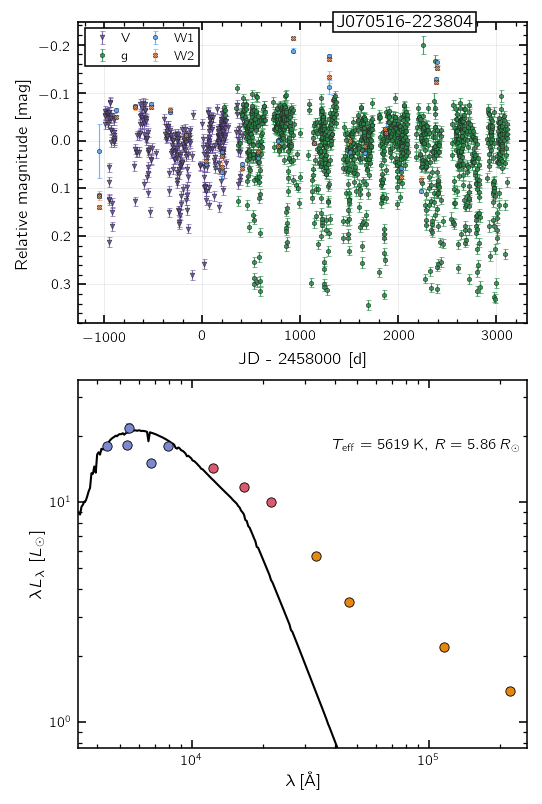

1/164  stv_549756696622  J070516-223804


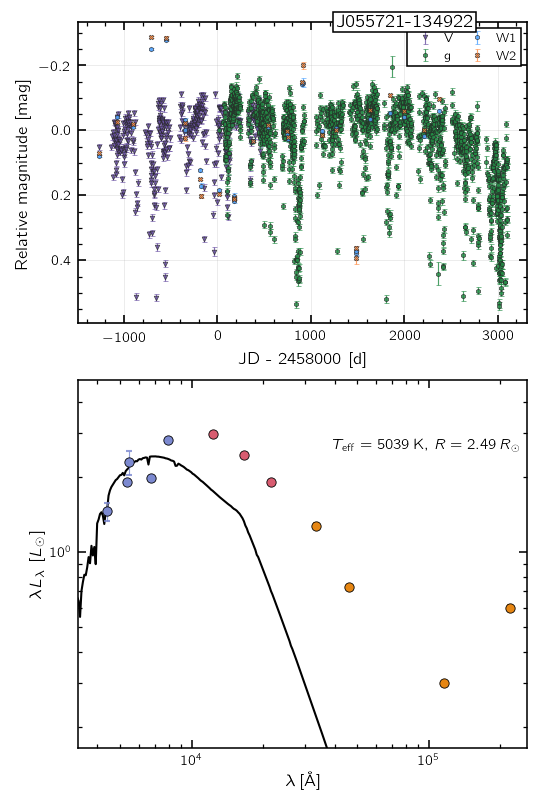

2/164  stv_292057989013  J055721-134922


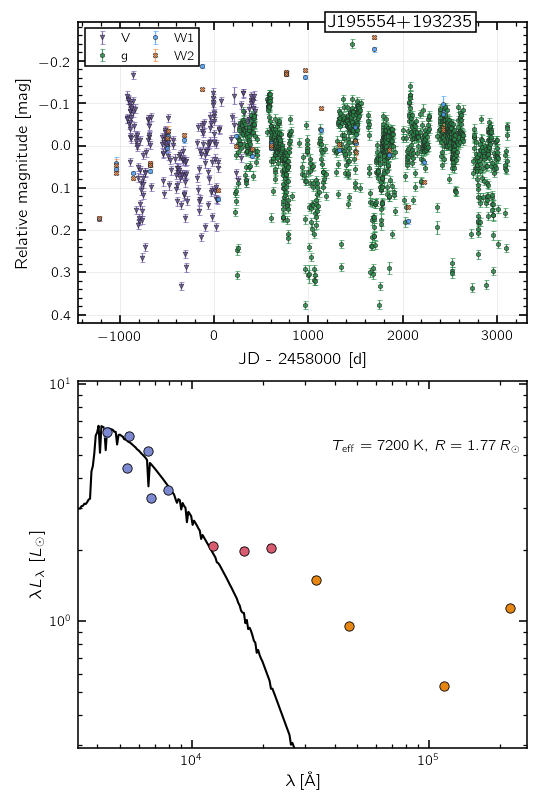

3/164  stv_206158504352  J195554+193235


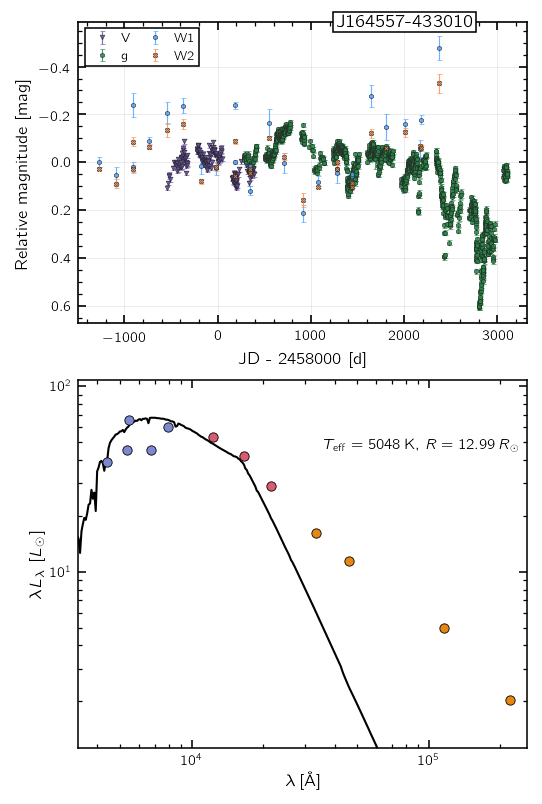

4/164  stv_352188453021  J164557-433010


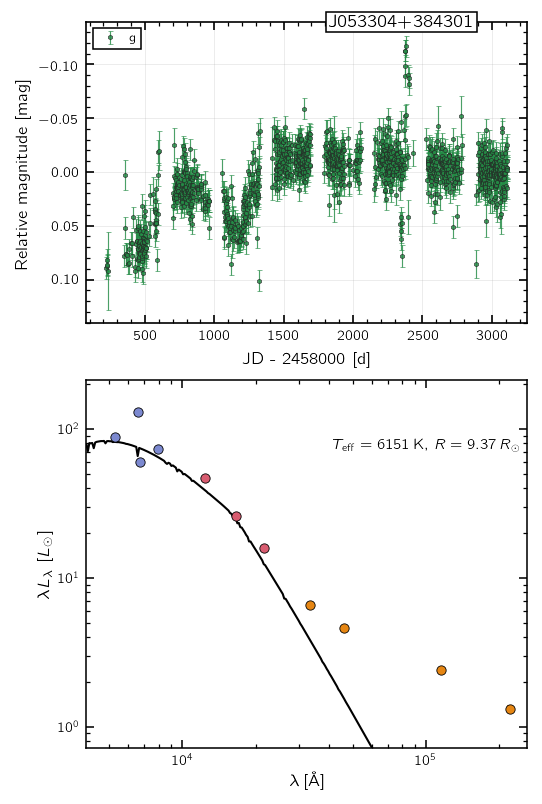

5/164  stv_42950978749  J053304+384301


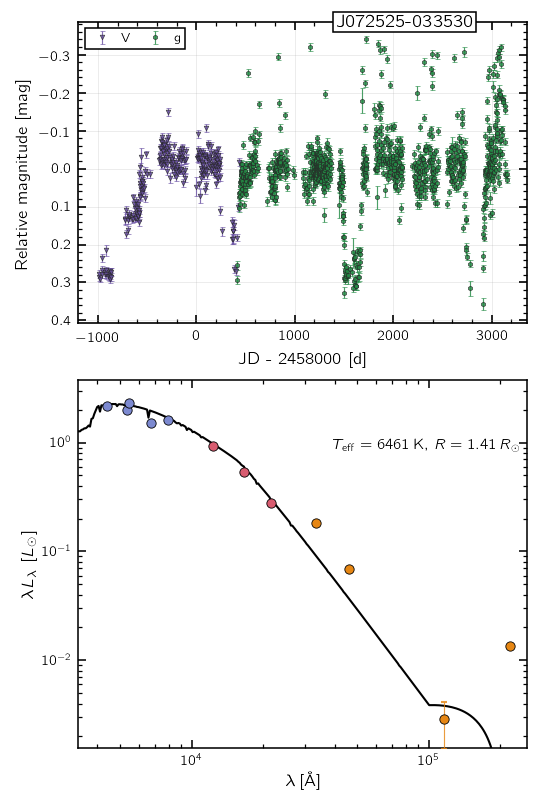

6/164  stv_395137147332  J072525-033530


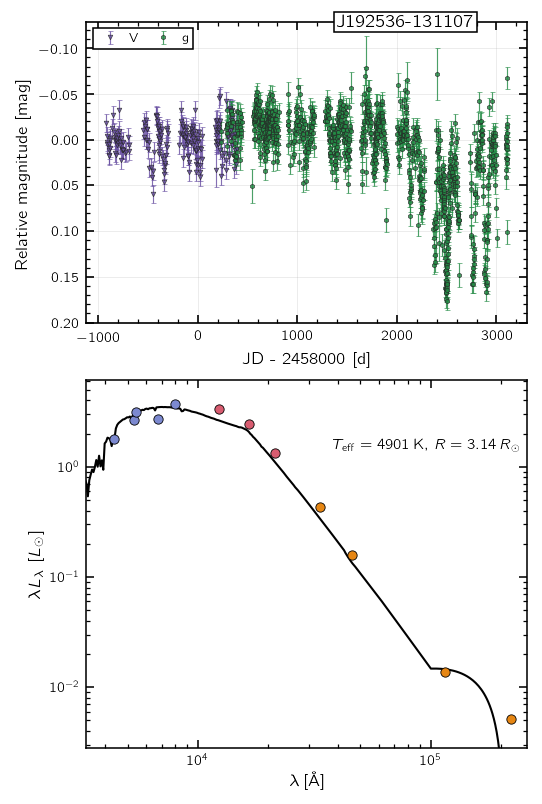

7/164  stv_352187778169  J192536-131107


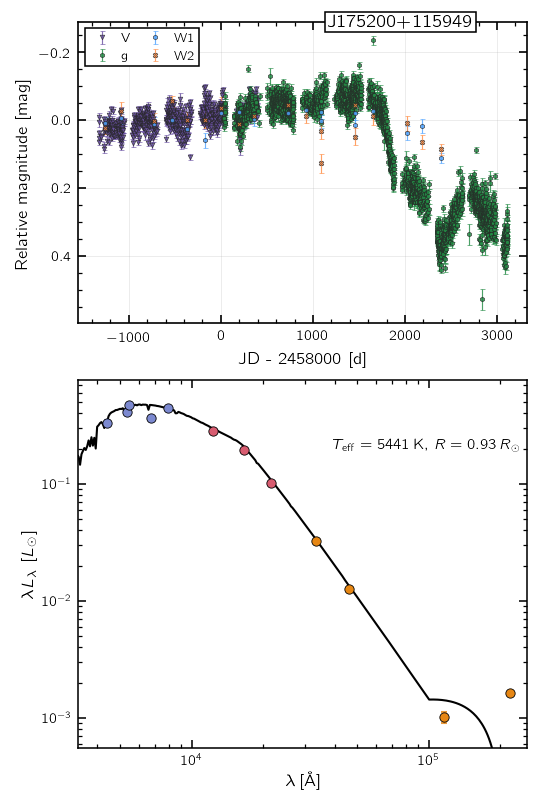

8/164  stv_395137536331  J175200+115949


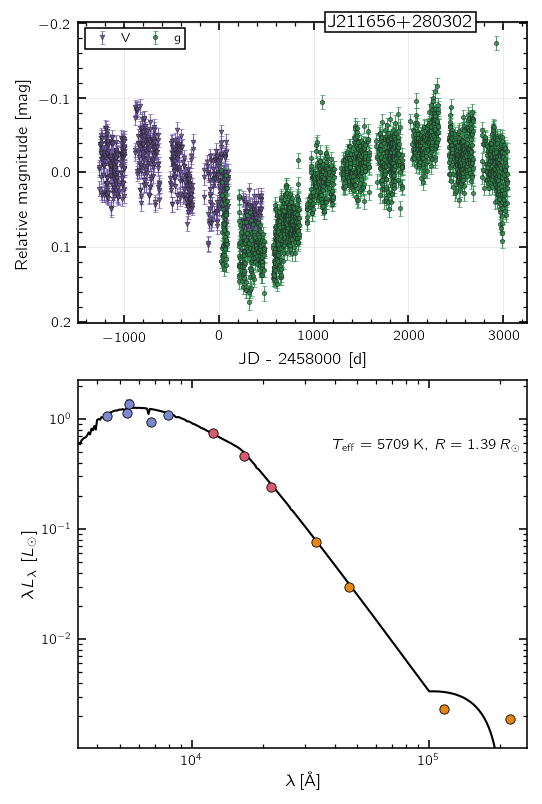

9/164  stv_188979142258  J211656+280302


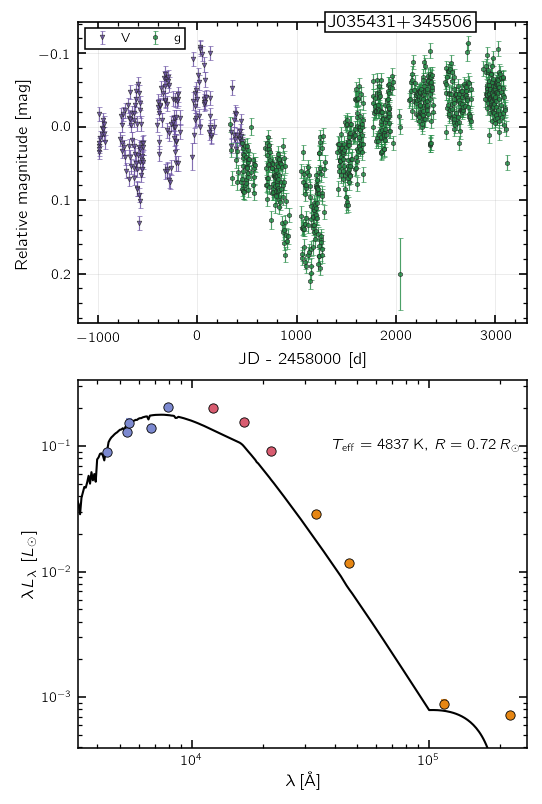

10/164  stv_111670444883  J035431+345506


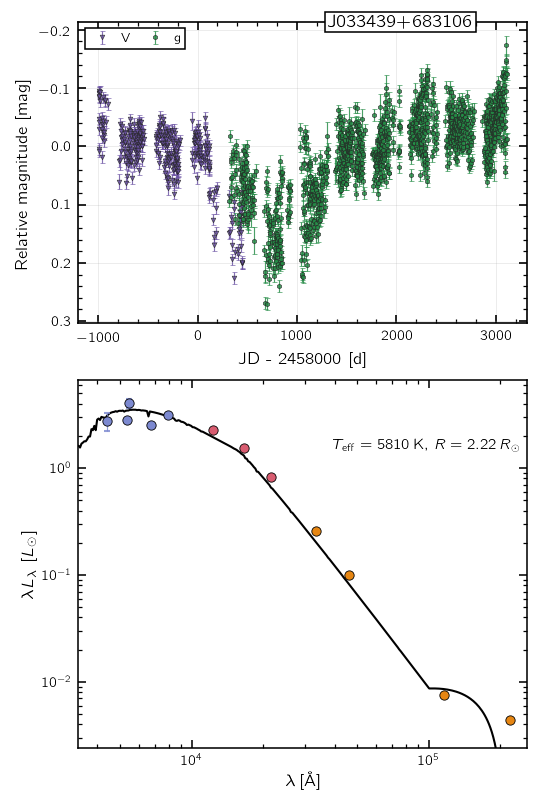

11/164  stv_17180004254  J033439+683106


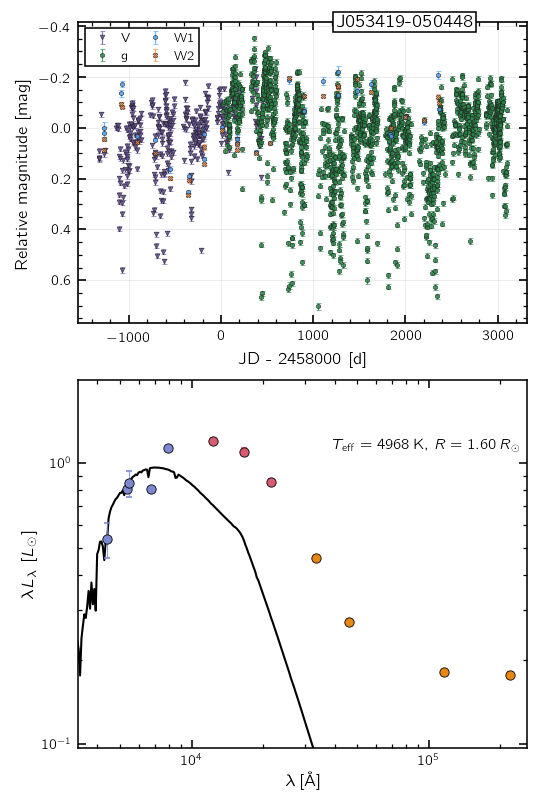

12/164  stv_343598086600  J053419-050448


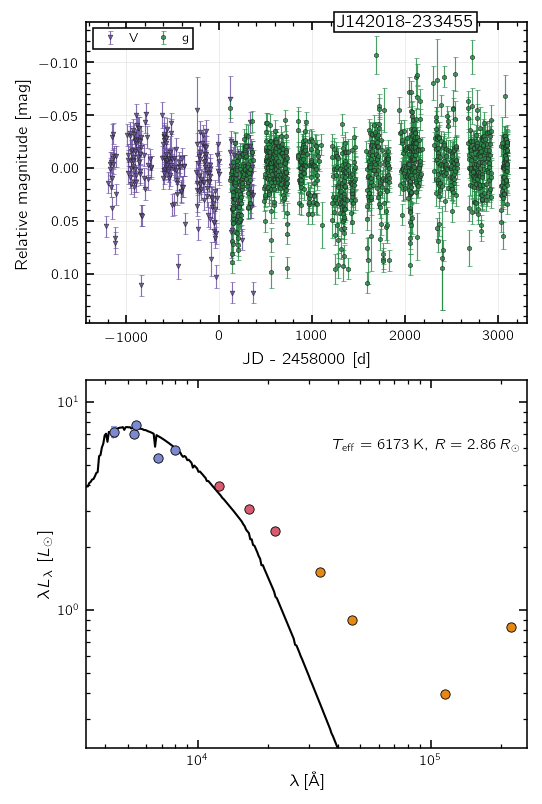

13/164  stv_558346776813  J142018-233455


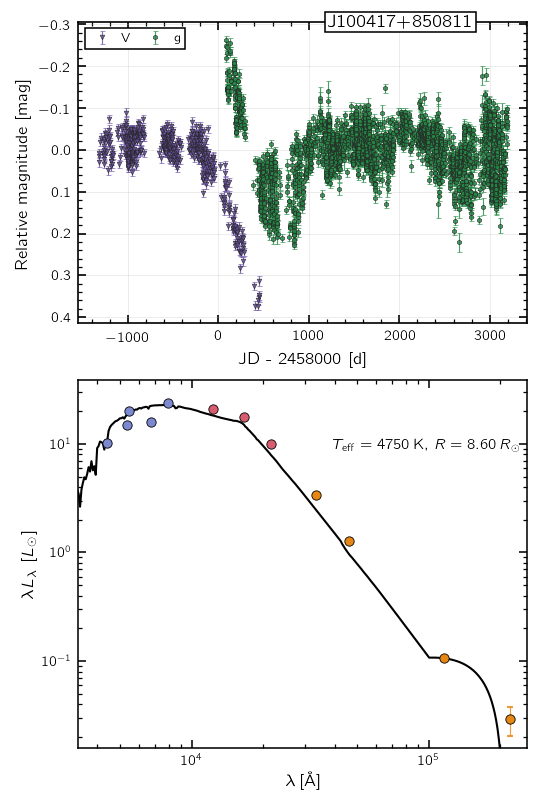

14/164  stv_317828613008  J100417+850811


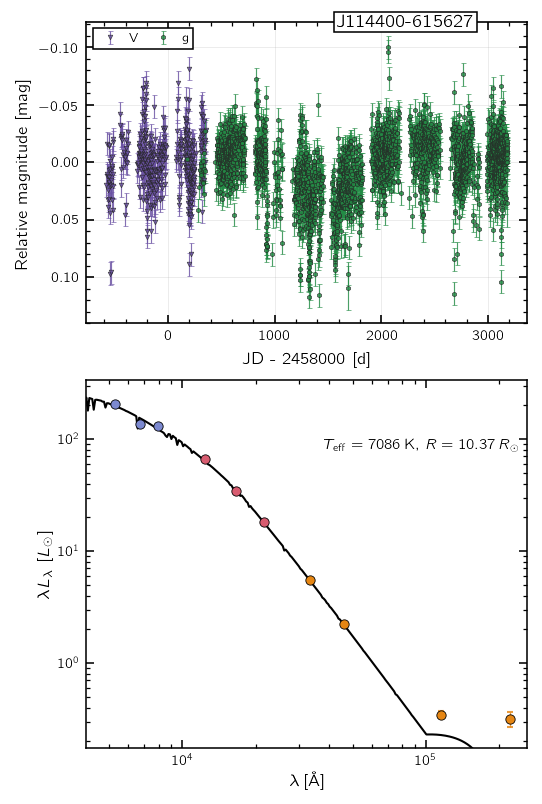

15/164  stv_609885930304  J114400-615627


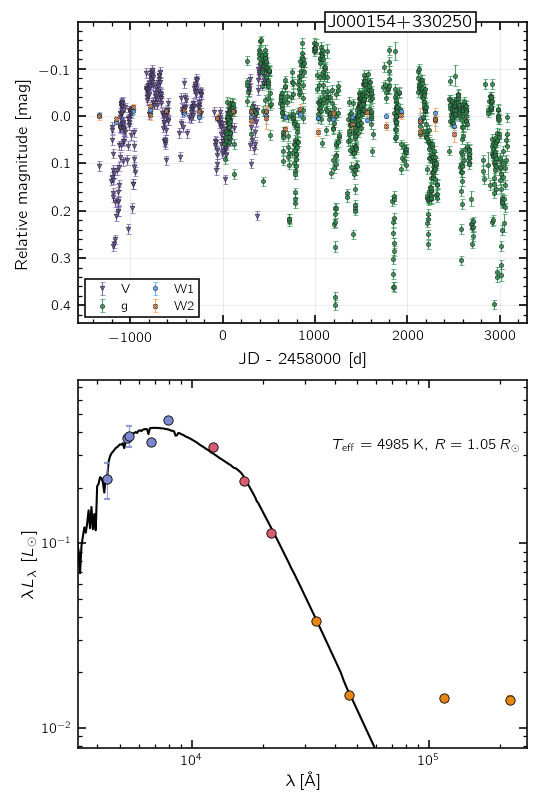

16/164  stv_111669512802  J000154+330250


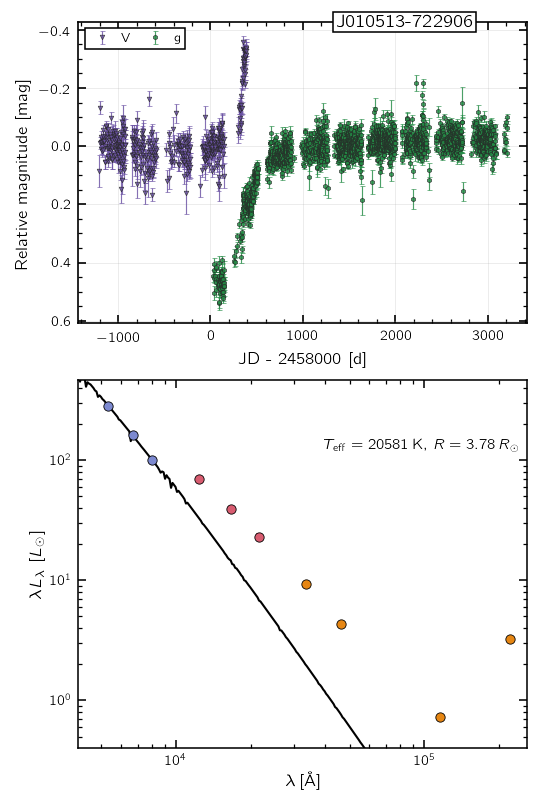

17/164  stv_446676962403  J010513-722906


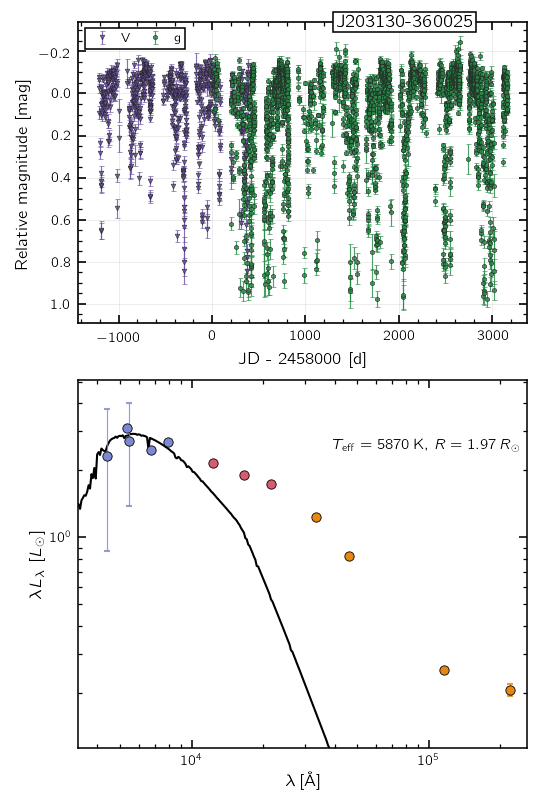

18/164  stv_541166856332  J203130-360025


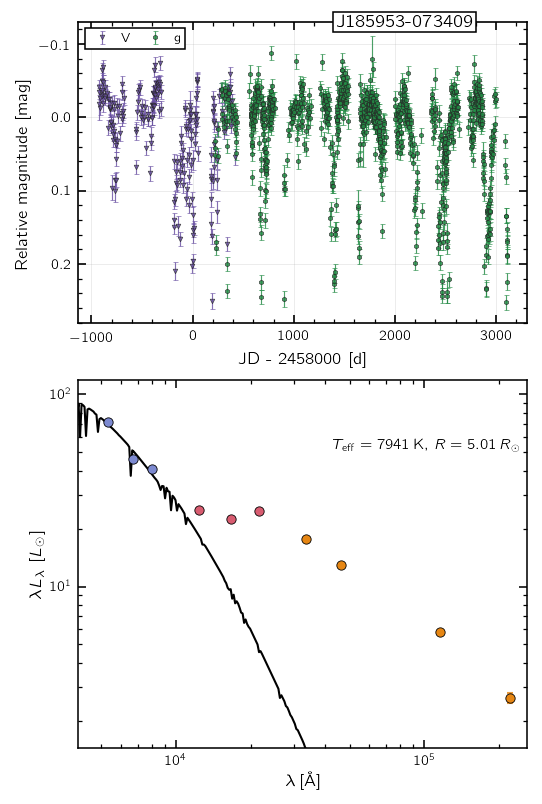

19/164  stv_369368247238  J185953-073409


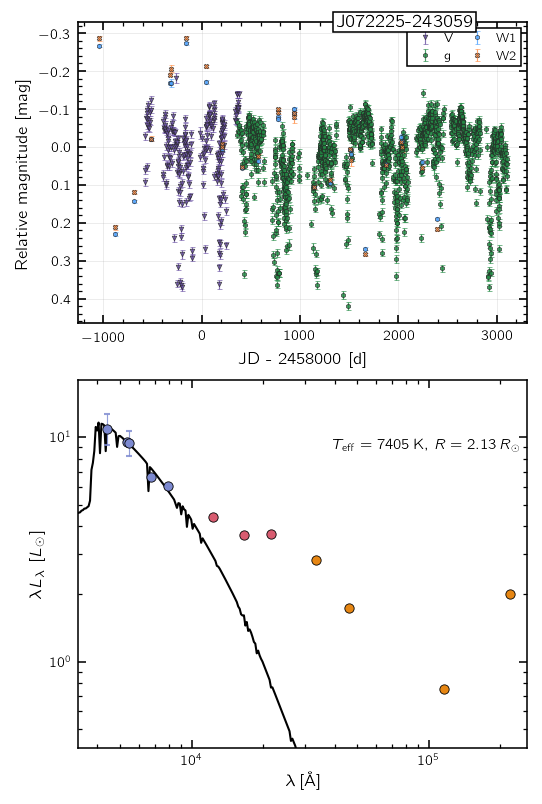

20/164  stv_558346808431  J072225-243059


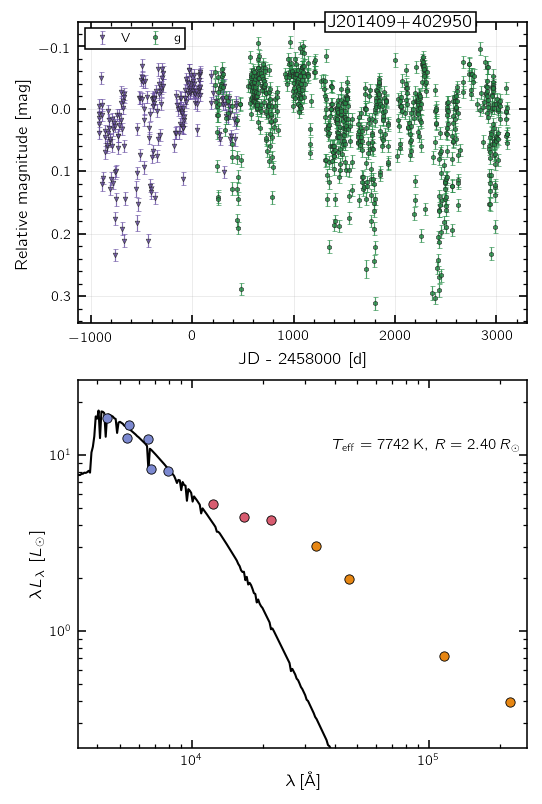

21/164  stv_120259975222  J201409+402950


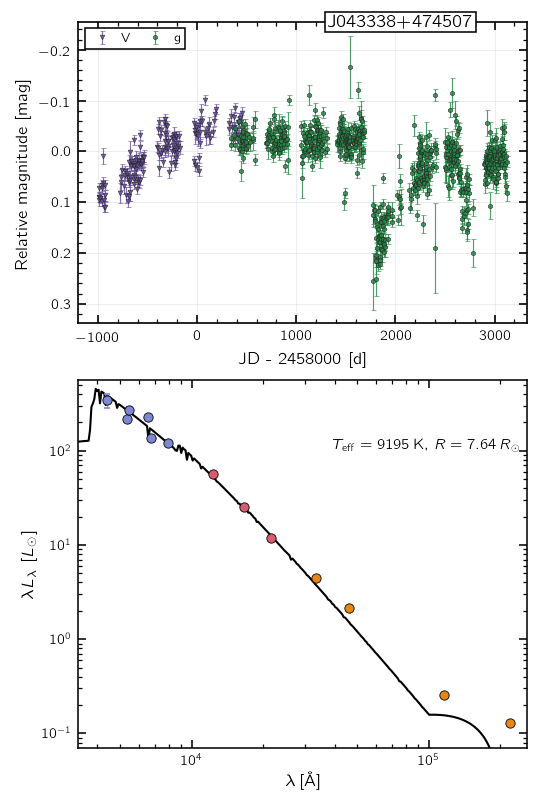

22/164  stv_85900740505  J043338+474507


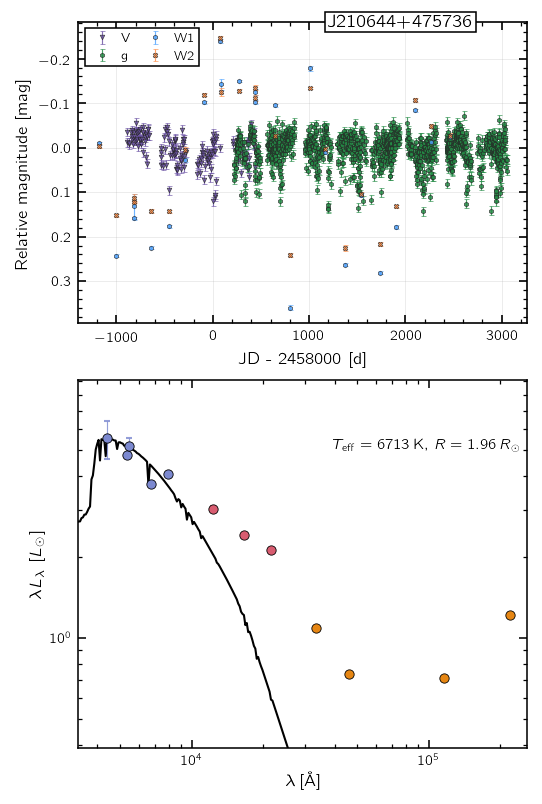

23/164  stv_25770384706  J210644+475736


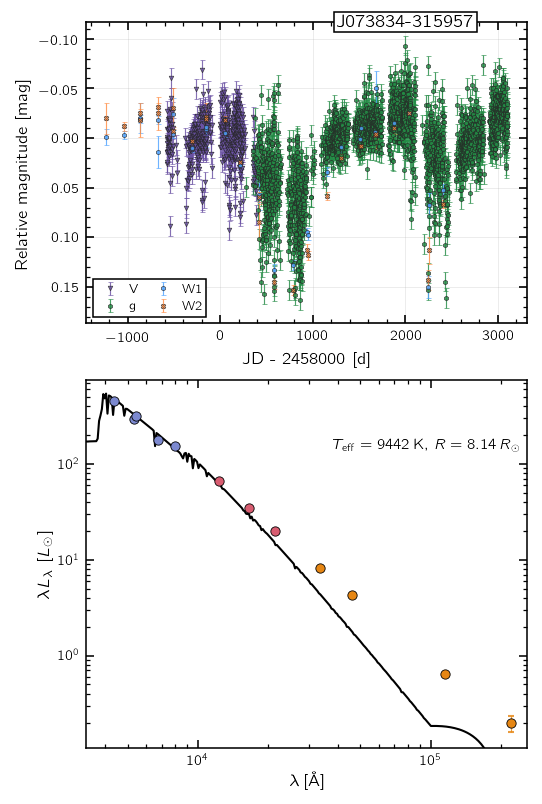

24/164  stv_566936811310  J073834-315957


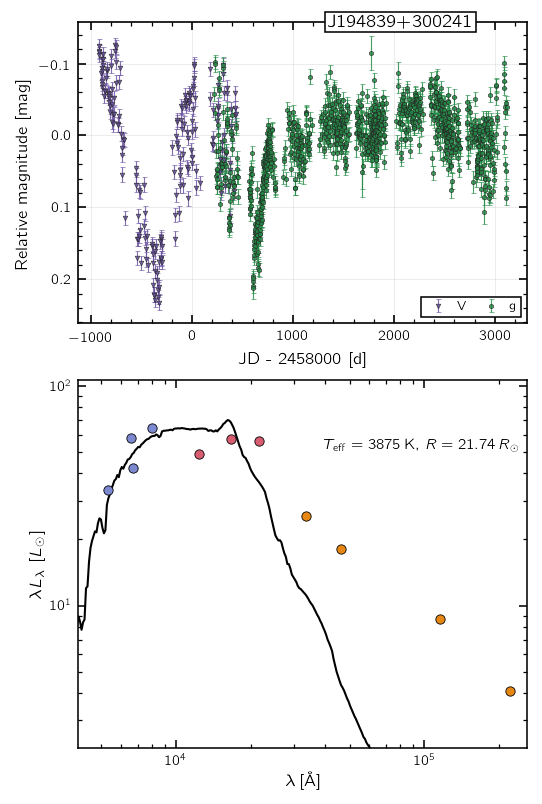

25/164  stv_154618944199  J194839+300241


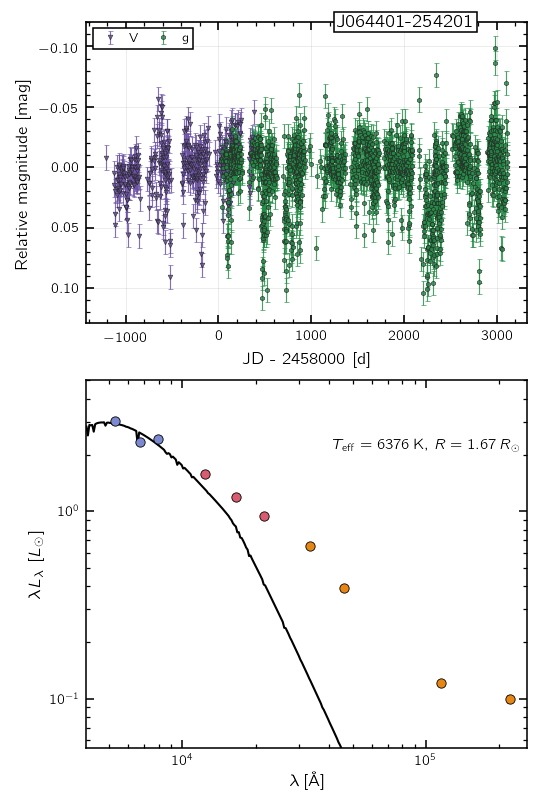

26/164  stv_369368019182  J064401-254201


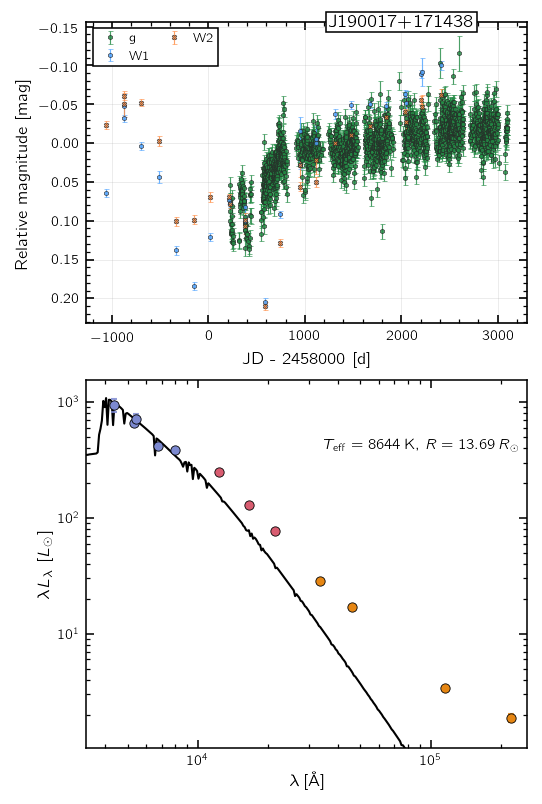

27/164  stv_214748985701  J190017+171438


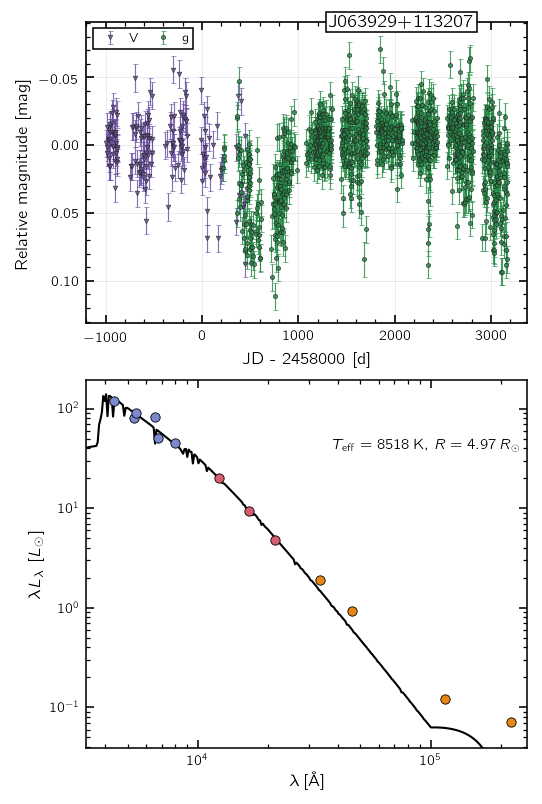

28/164  stv_360777789109  J063929+113207


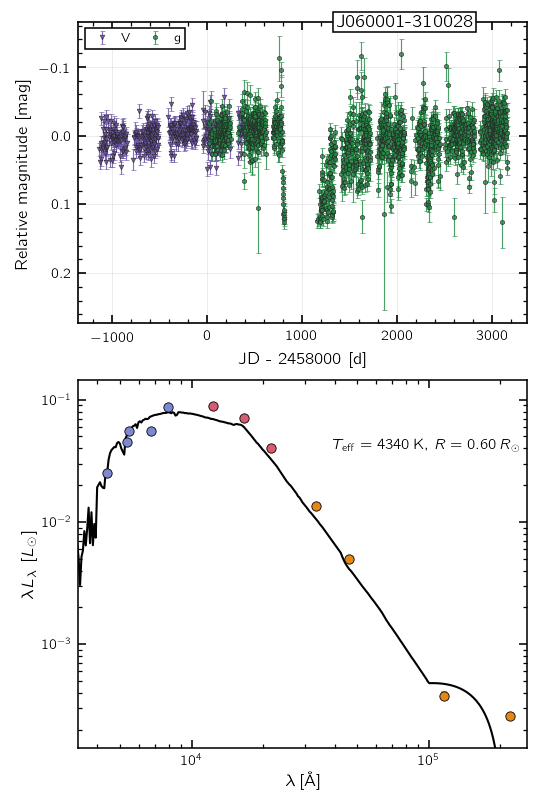

29/164  stv_34360122433  J060001-310028


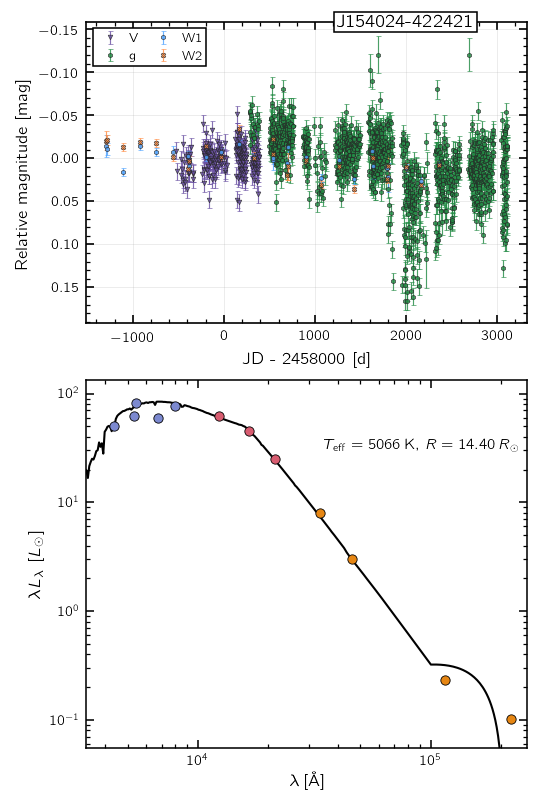

30/164  stv_403727390848  J154024-422421


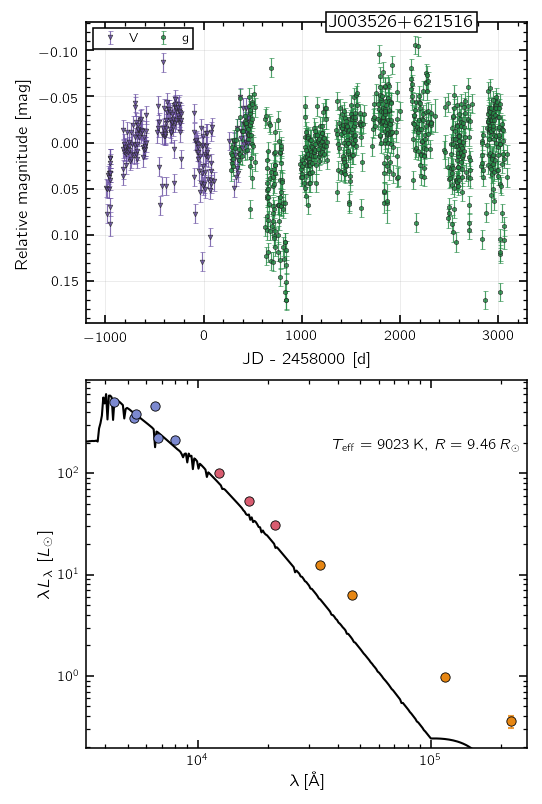

31/164  stv_120259384073  J003526+621516


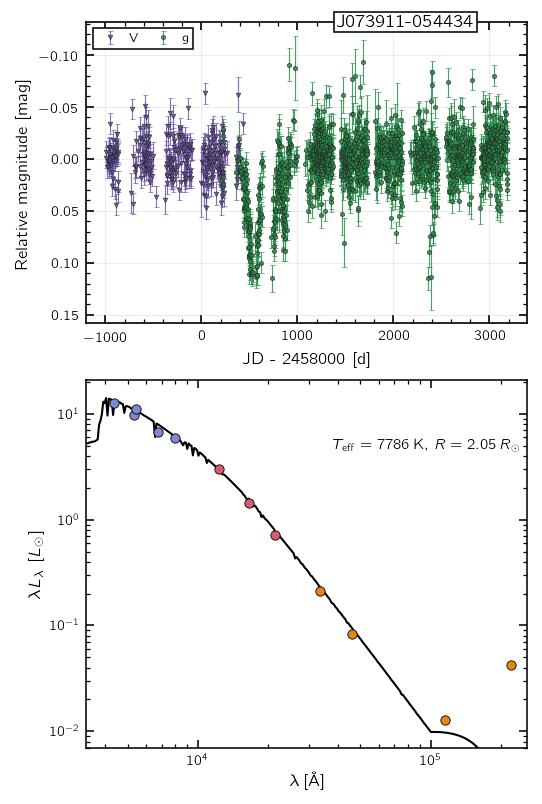

32/164  stv_463857379909  J073911-054434


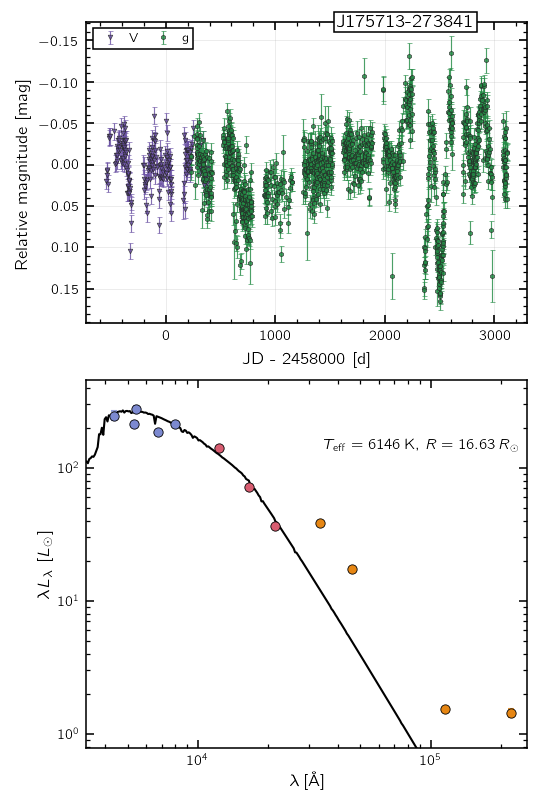

33/164  stv_429497765184  J175713-273841


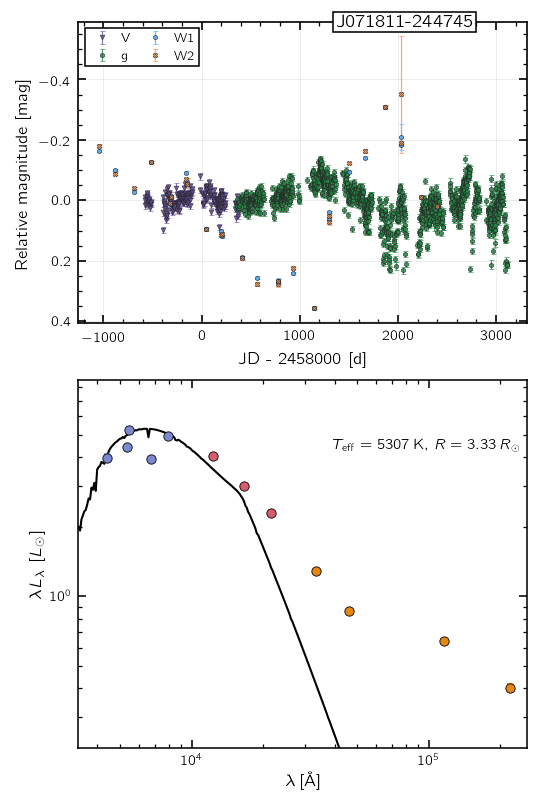

34/164  stv_489627249934  J071811-244745


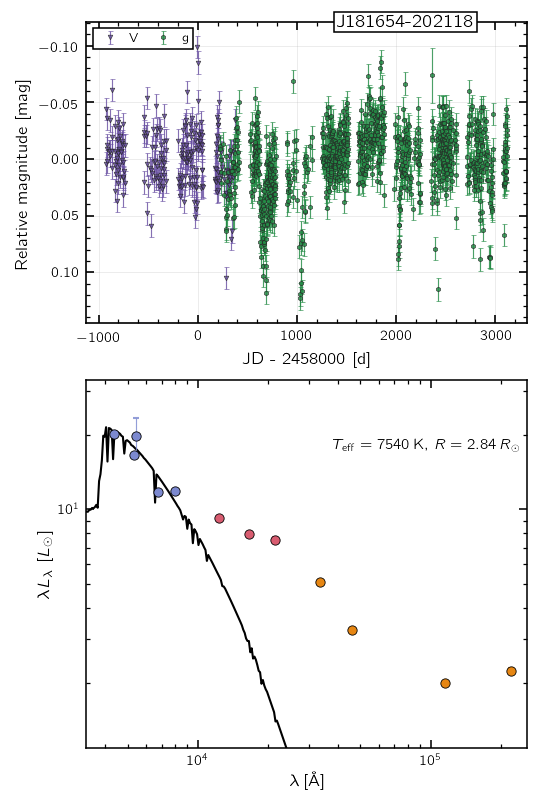

35/164  stv_532577049495  J181654-202118


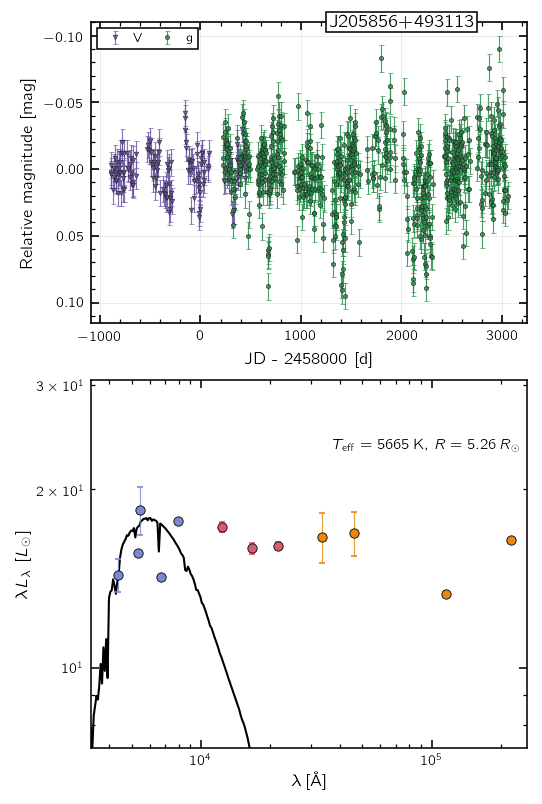

36/164  stv_68720526392  J205856+493113


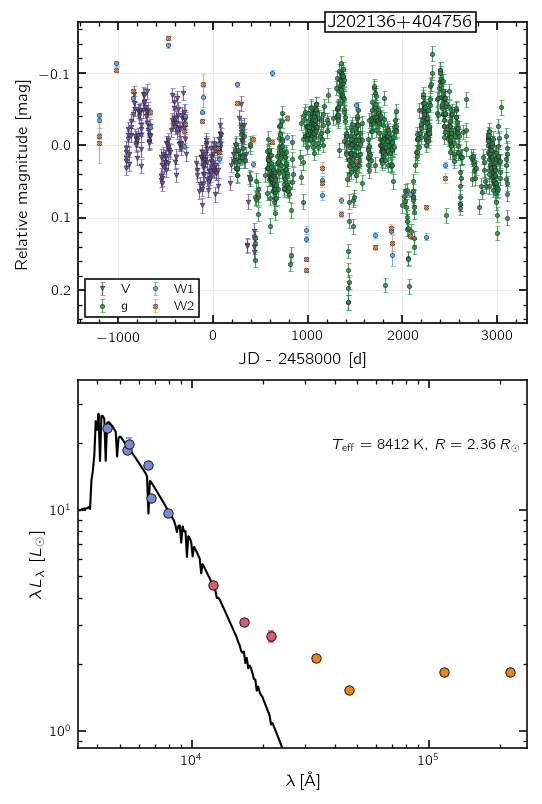

37/164  stv_60130127364  J202136+404756


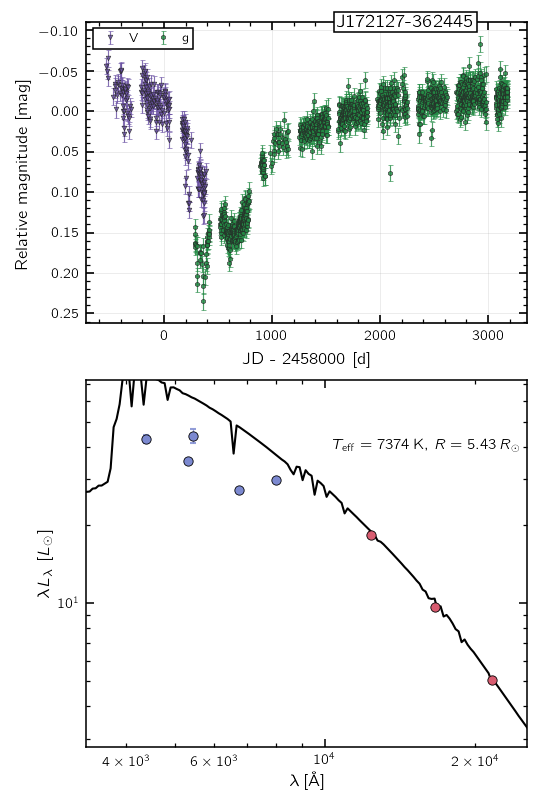

38/164  stv_283468165807  J172127-362445


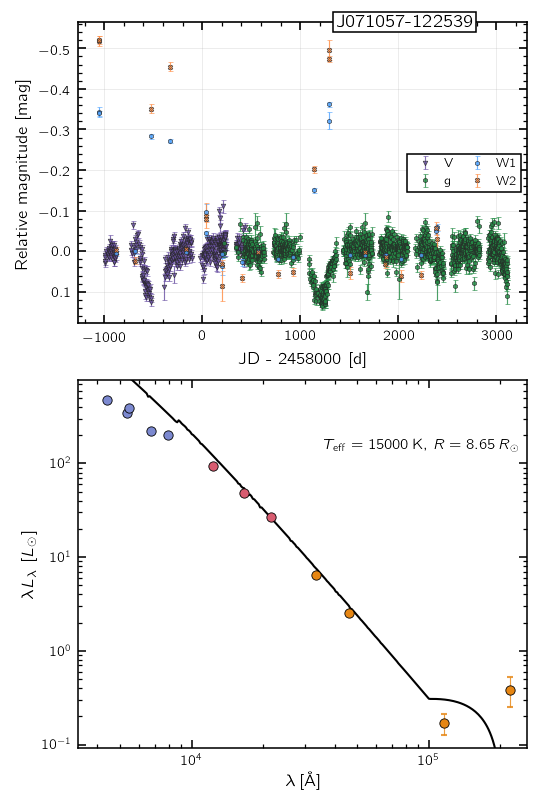

39/164  stv_300648890329  J071057-122539


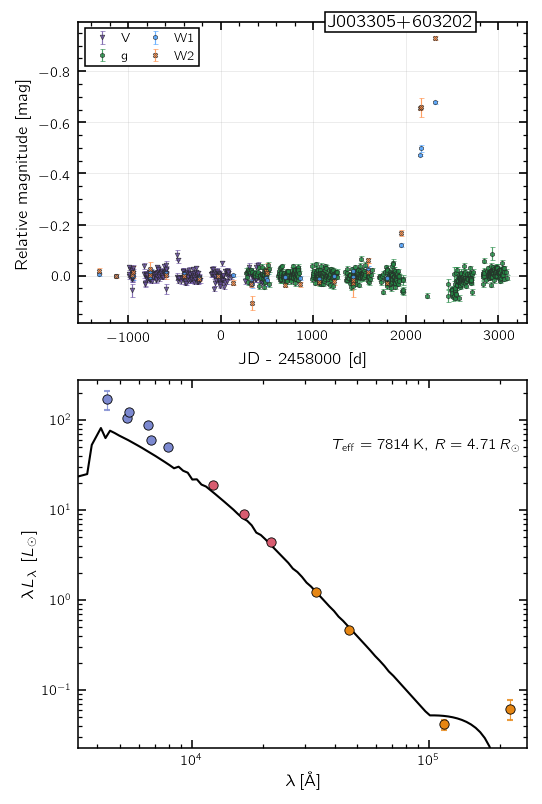

40/164  stv_146029595645  J003305+603202


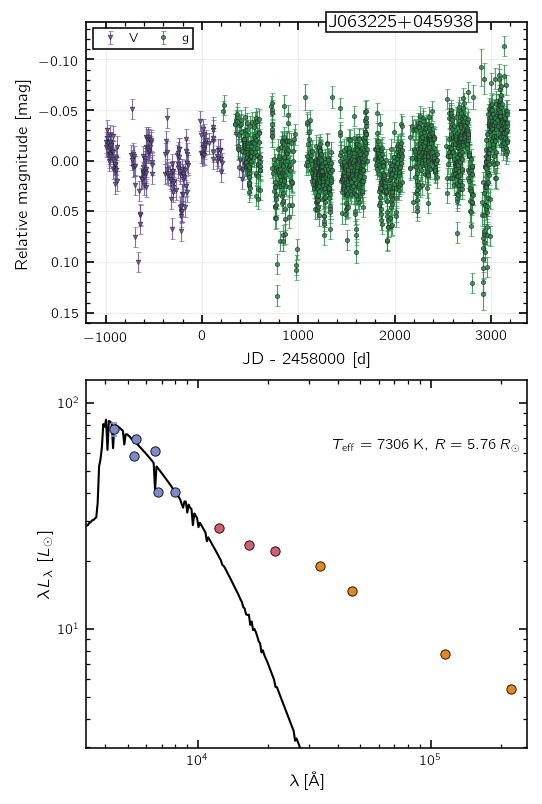

41/164  stv_266288191401  J063225+045938


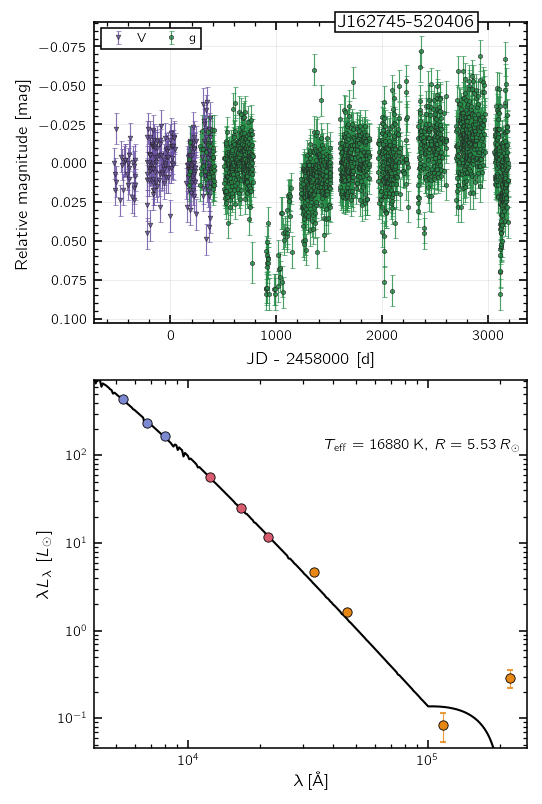

42/164  stv_601296234211  J162745-520406


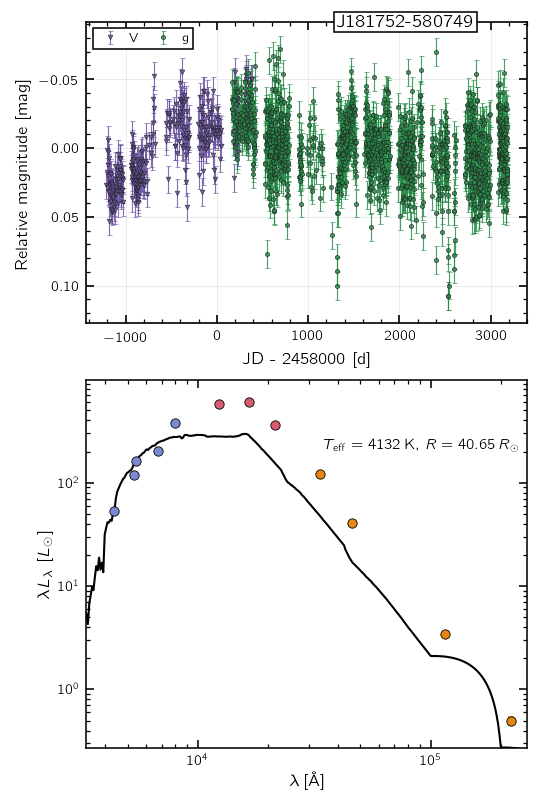

43/164  stv_644245387906  J181752-580749


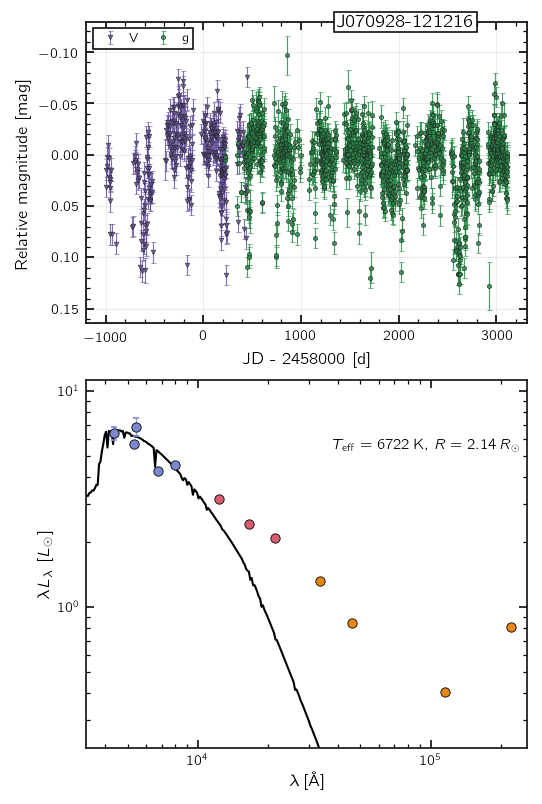

44/164  stv_326417838270  J070928-121216


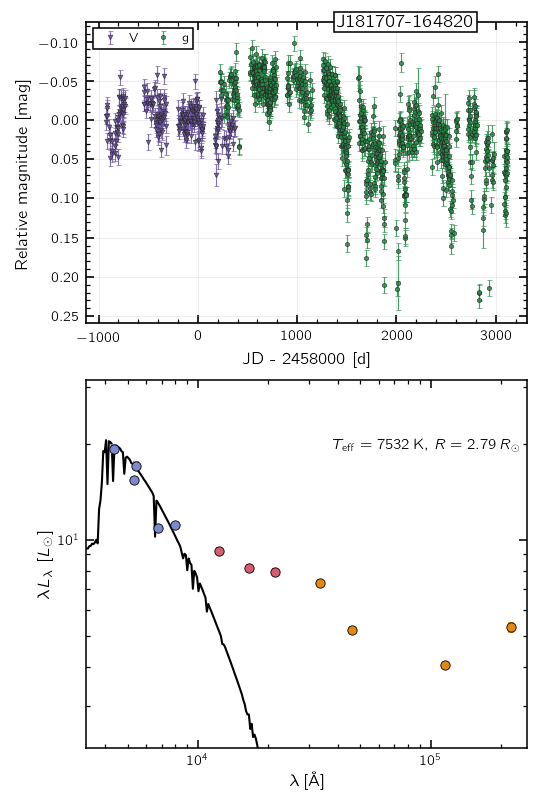

45/164  stv_369367581586  J181707-164820


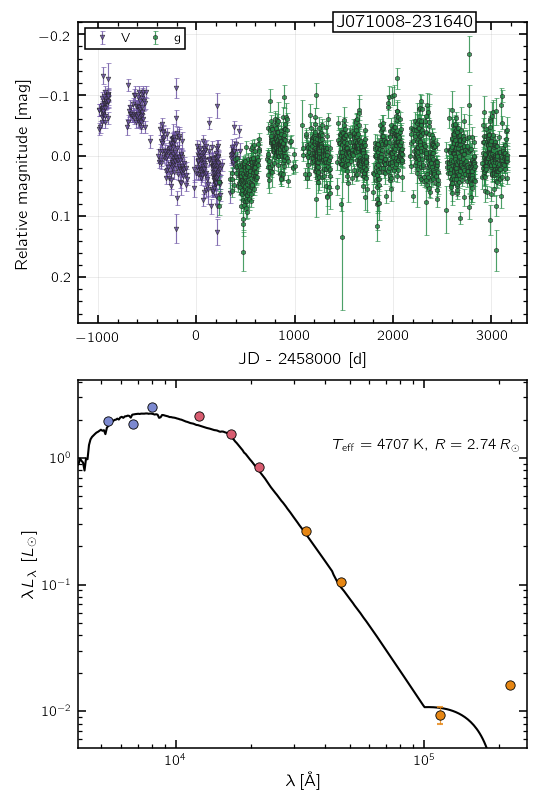

46/164  stv_515396599194  J071008-231640


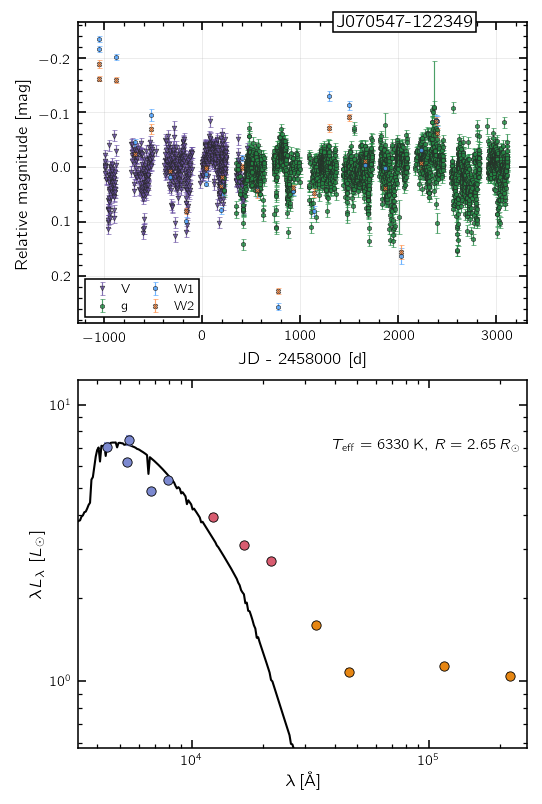

47/164  stv_326417748428  J070547-122349


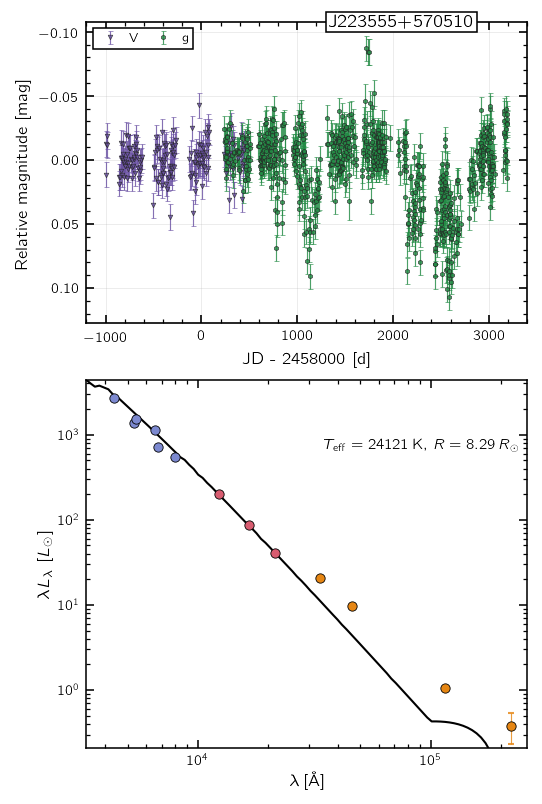

48/164  stv_103080542701  J223555+570510


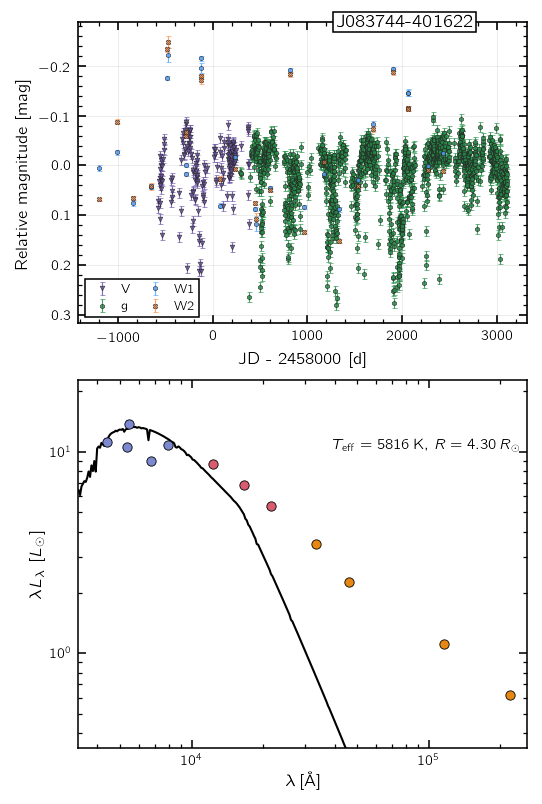

49/164  stv_438087432036  J083744-401622


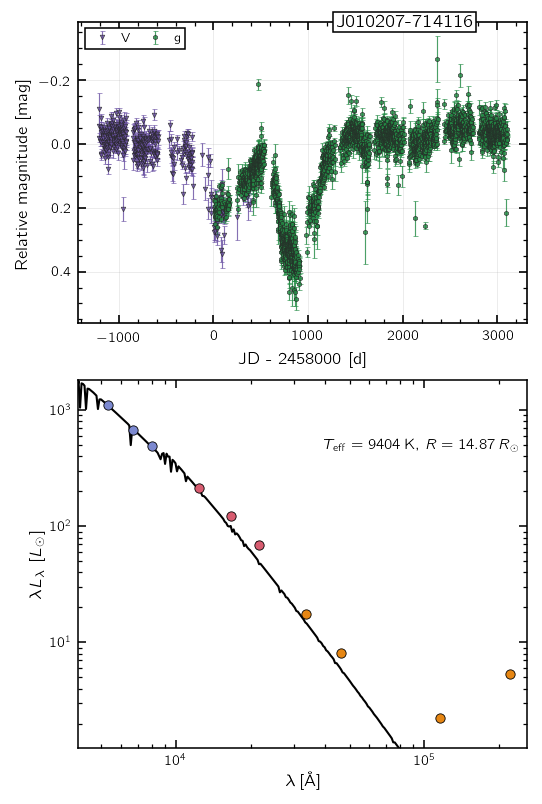

50/164  stv_463856558214  J010207-714116


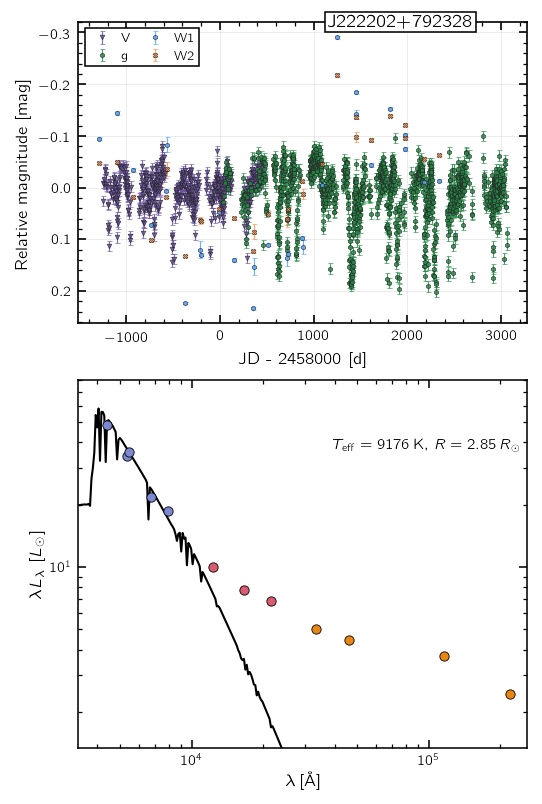

51/164  stv_34360173609  J222202+792328


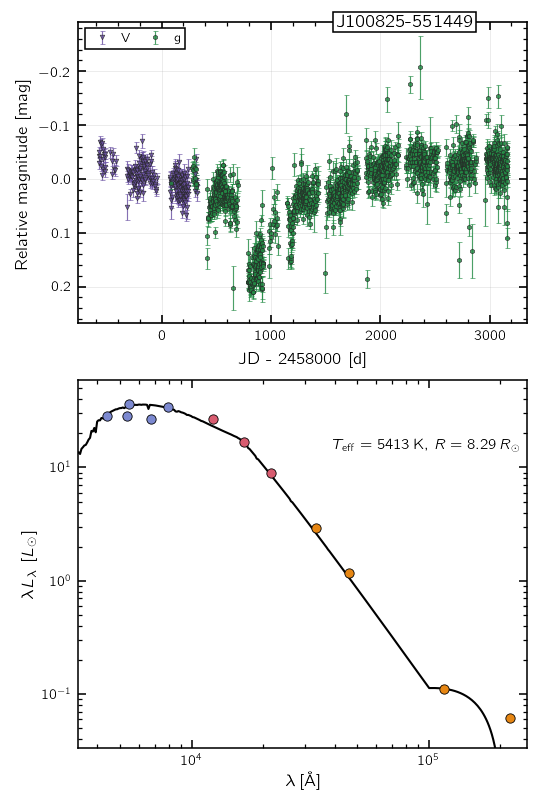

52/164  stv_652835553348  J100825-551449


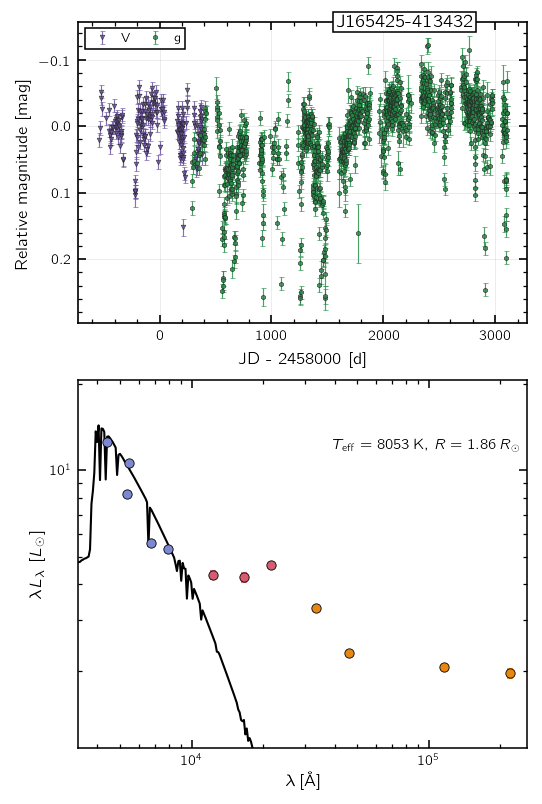

53/164  stv_455267329115  J165425-413432


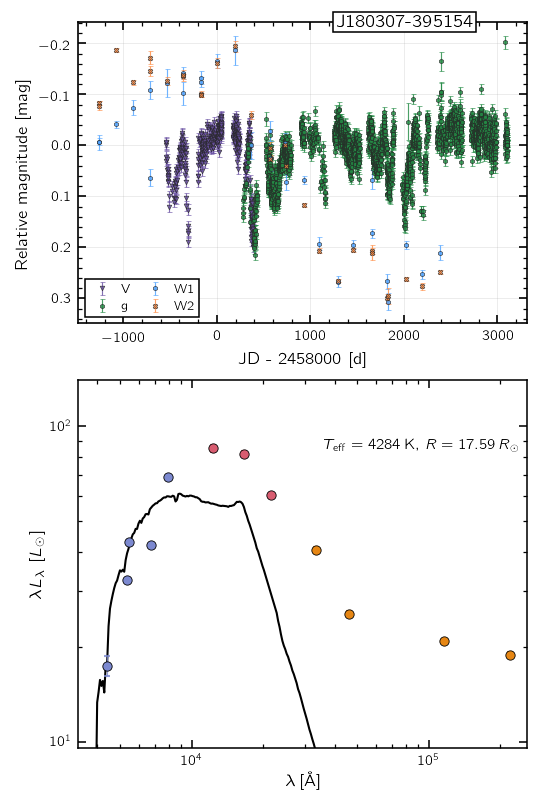

54/164  stv_481036753007  J180307-395154


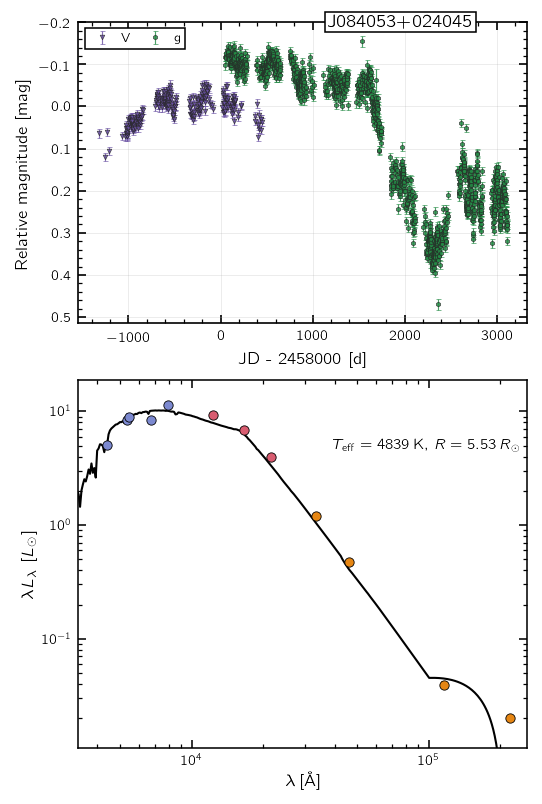

55/164  stv_197569146752  J084053+024045


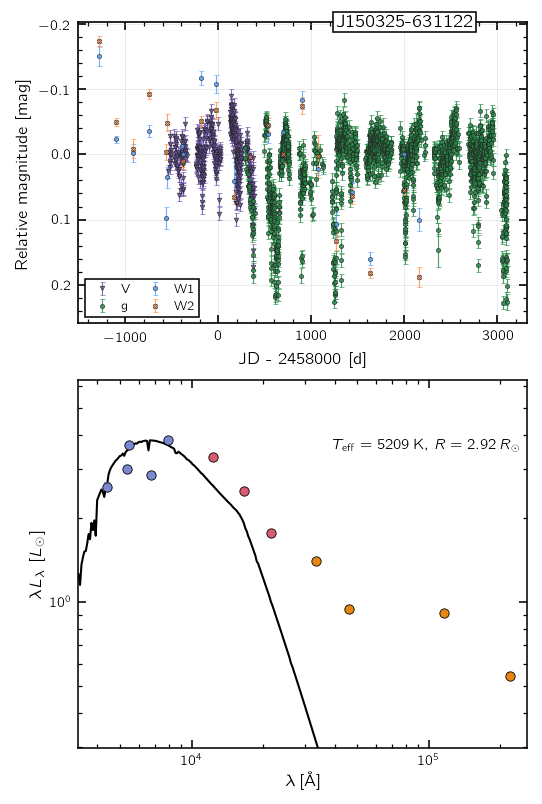

56/164  stv_635656028029  J150325-631122


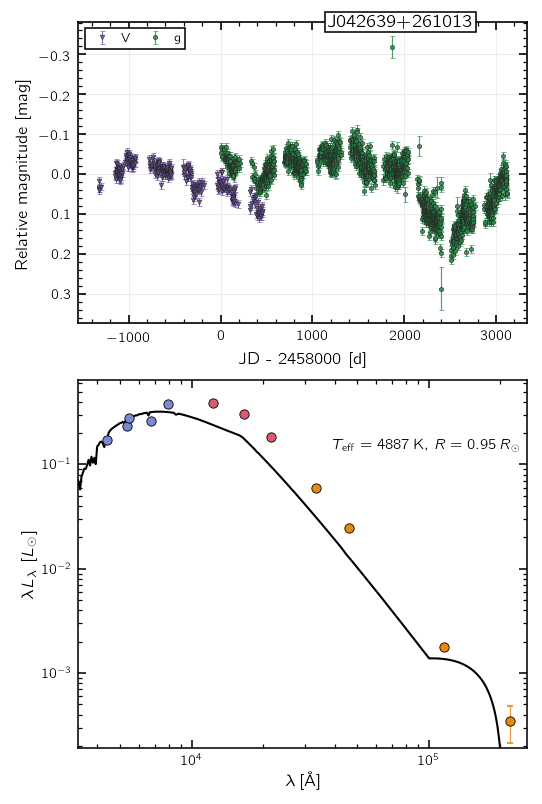

57/164  stv_266288875581  J042639+261013


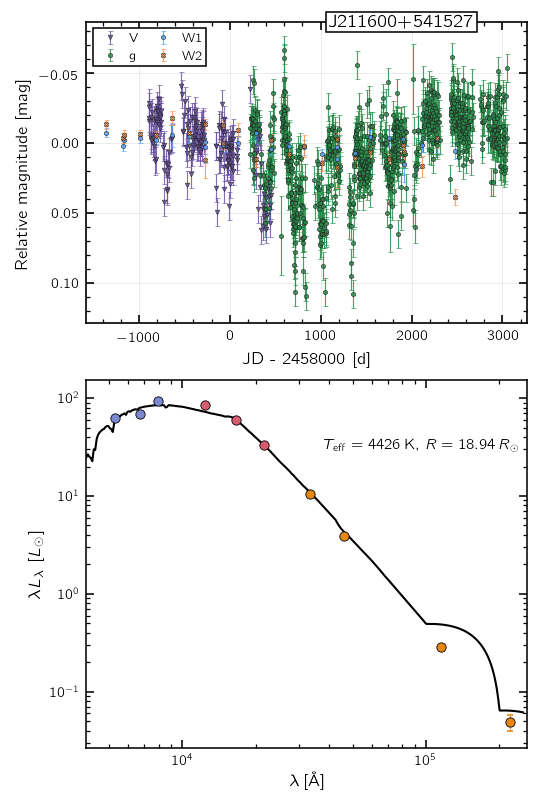

58/164  stv_103079502524  J211600+541527


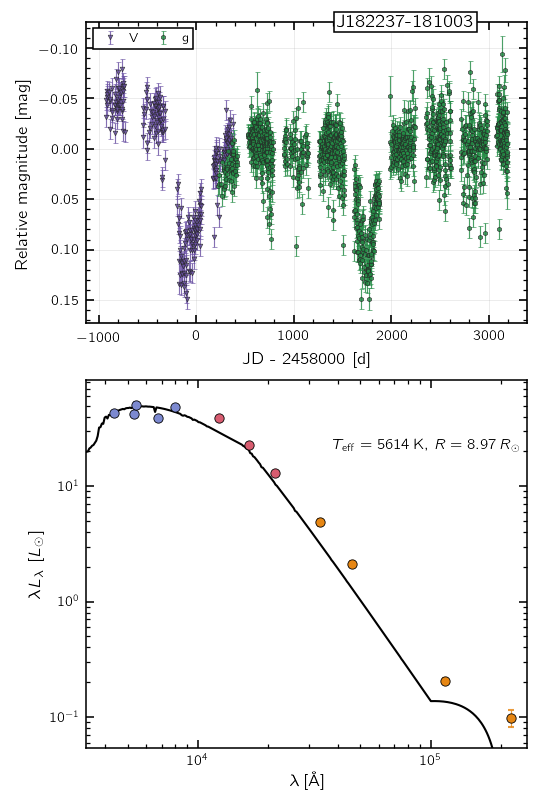

59/164  stv_455267146704  J182237-181003


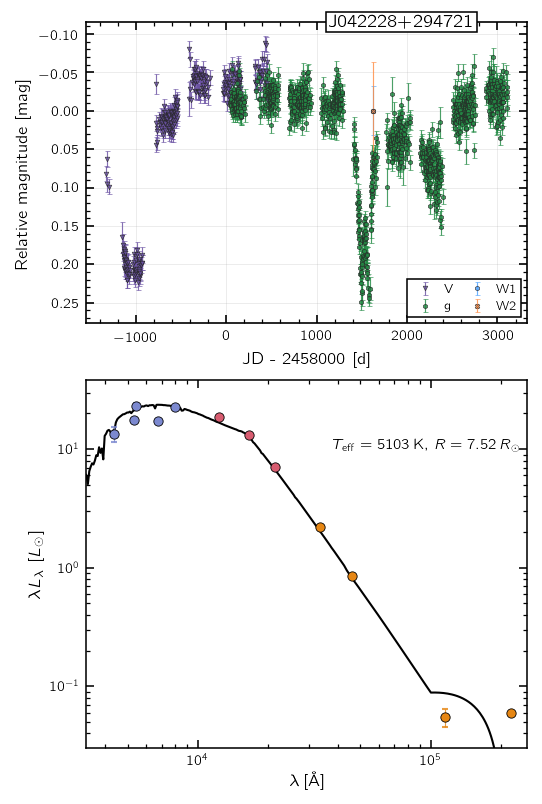

60/164  stv_137440061640  J042228+294721


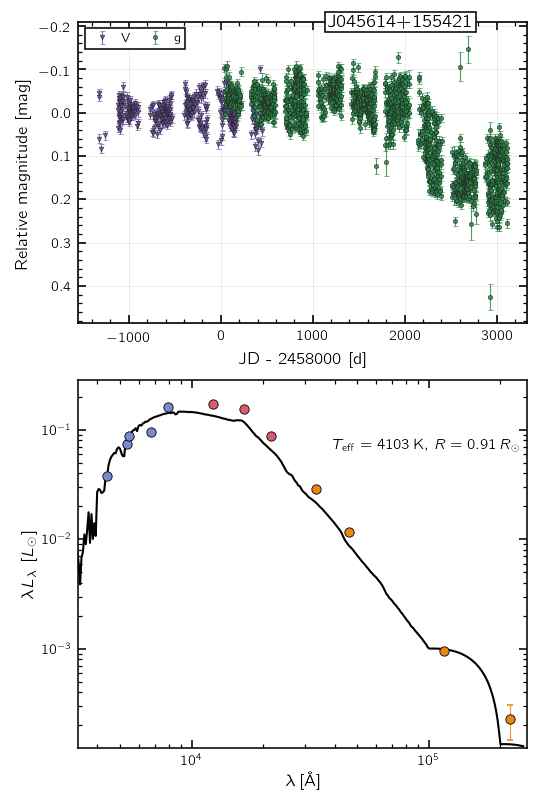

61/164  stv_386547633180  J045614+155421


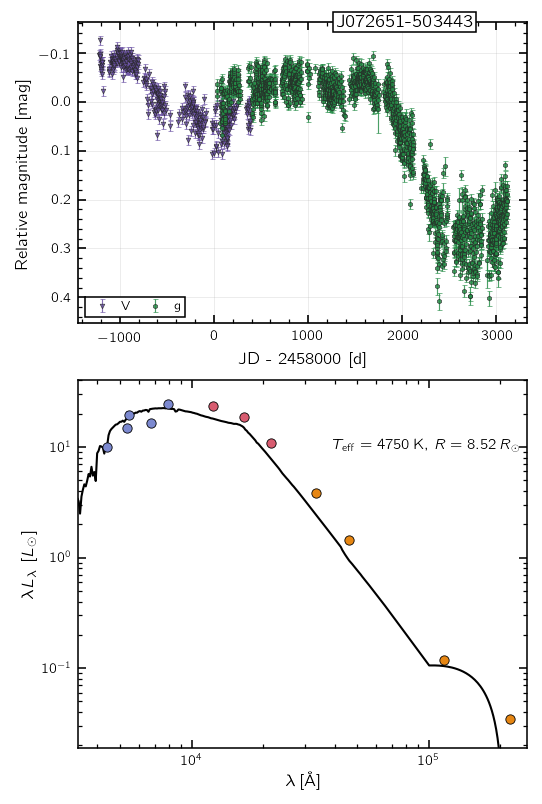

62/164  stv_446677541838  J072651-503443


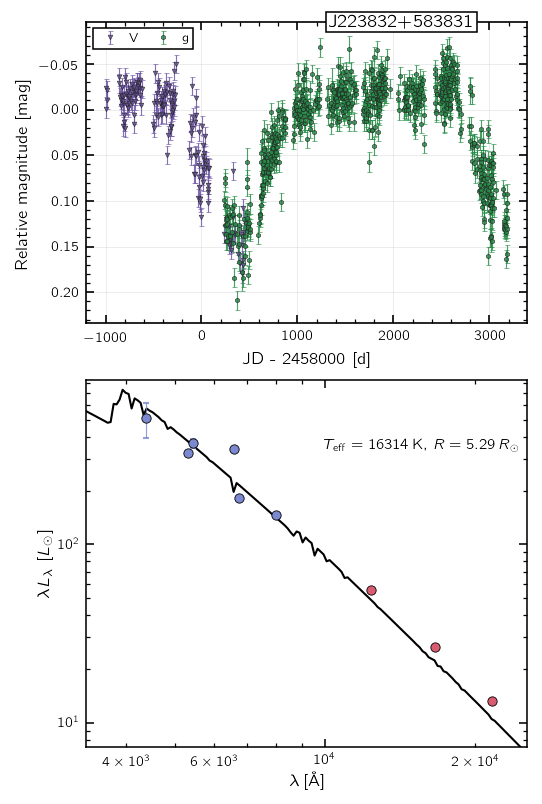

63/164  stv_111670547411  J223832+583831


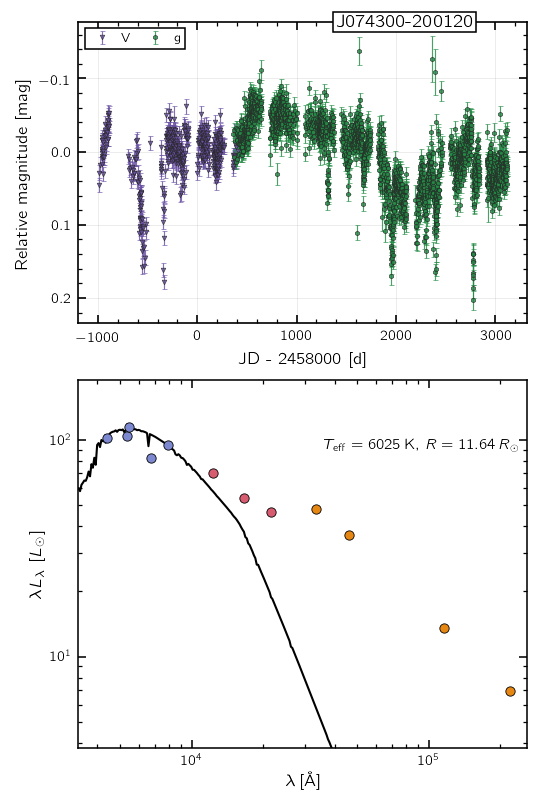

64/164  stv_515396303780  J074300-200120


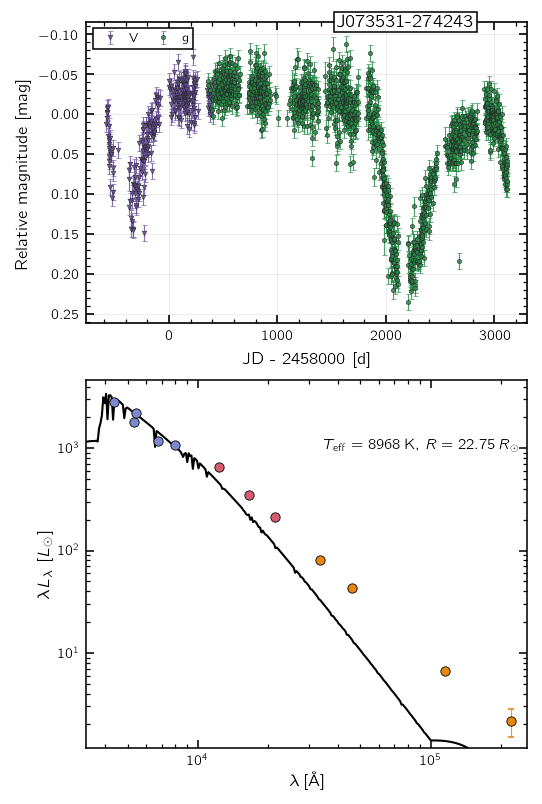

65/164  stv_386547548488  J073531-274243


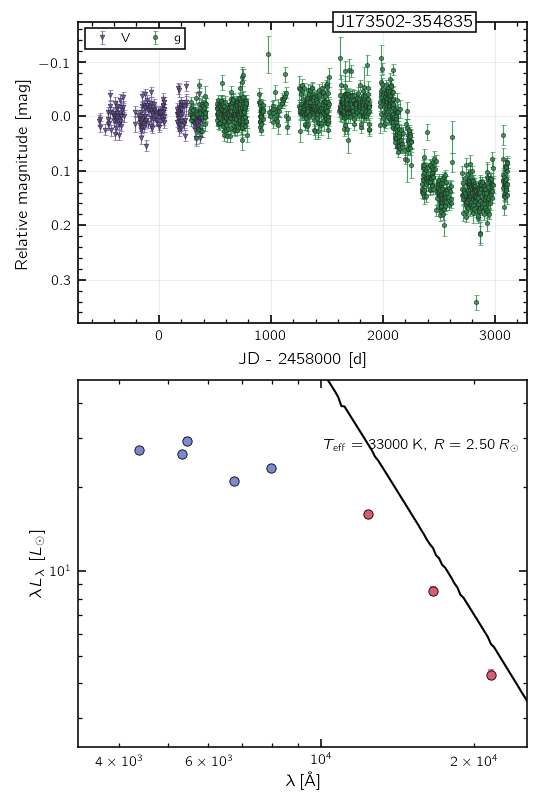

66/164  stv_609885850038  J173502-354835


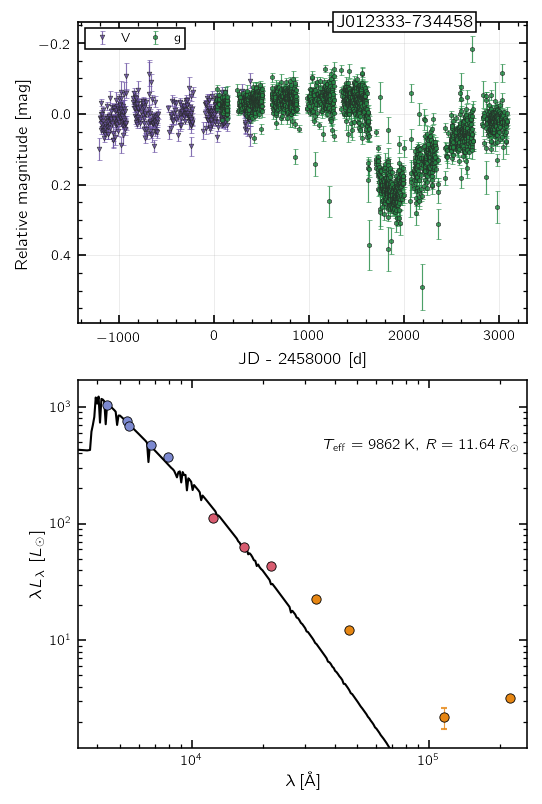

67/164  stv_283468931829  J012333-734458


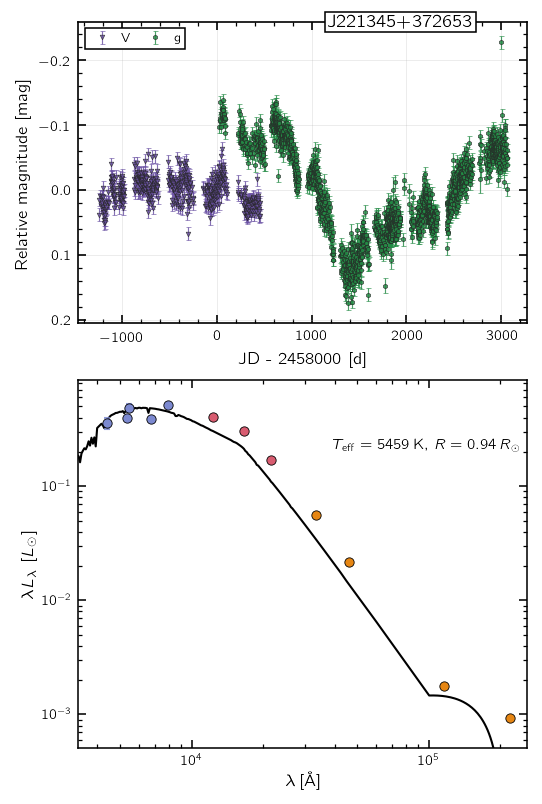

68/164  stv_8590787268  J221345+372653


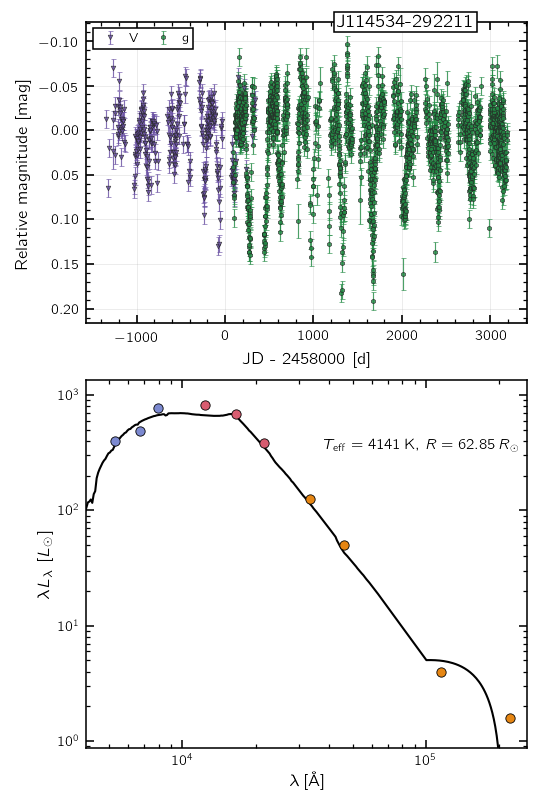

69/164  stv_266289132701  J114534-292211


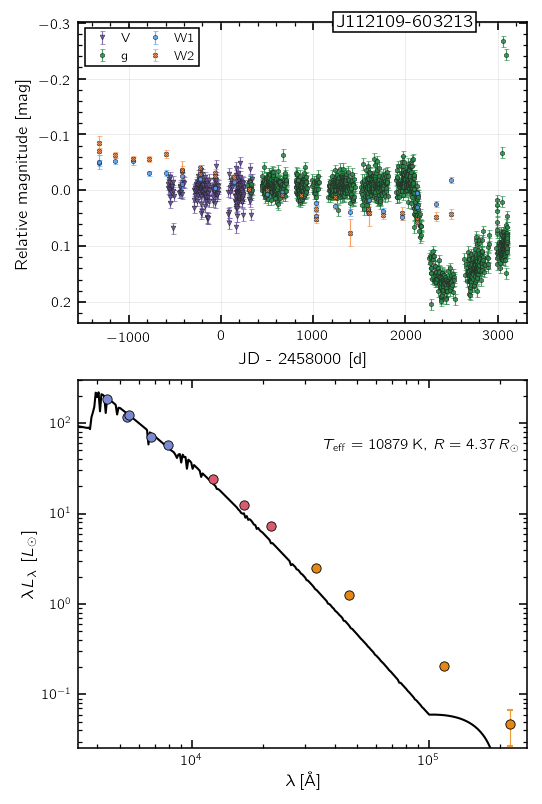

70/164  stv_635655213015  J112109-603213


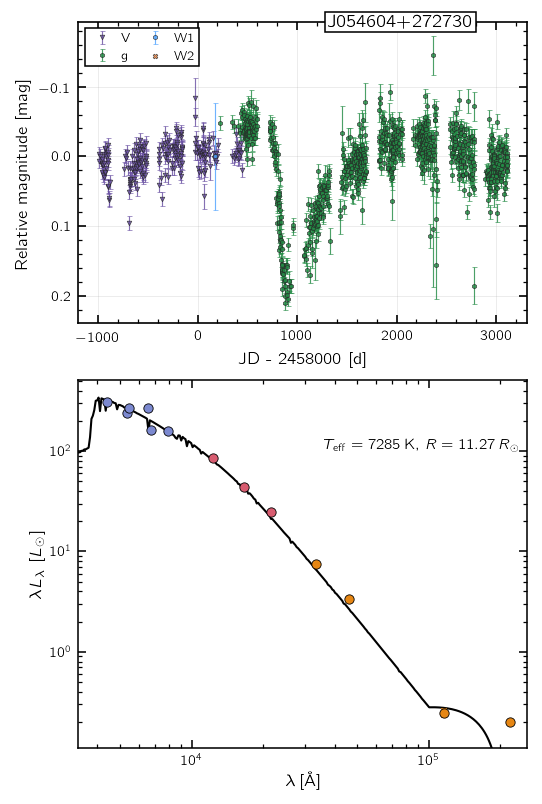

71/164  stv_214748665650  J054604+272730


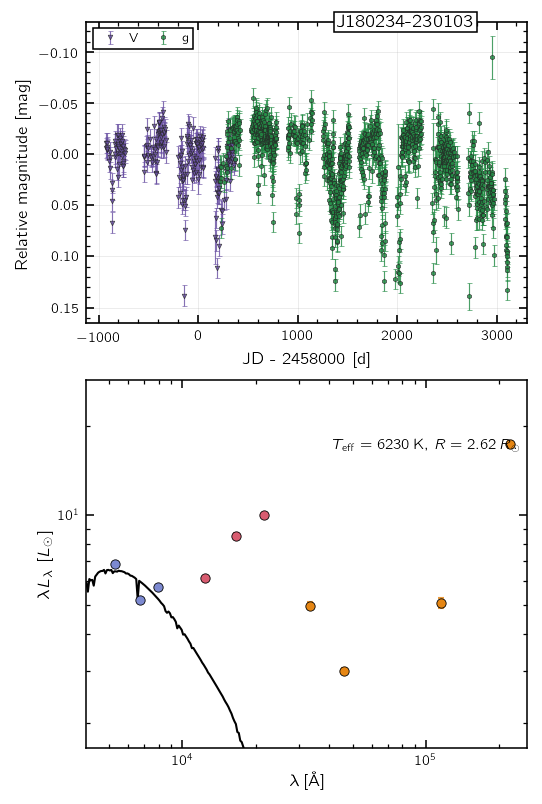

72/164  stv_515396665634  J180234-230103


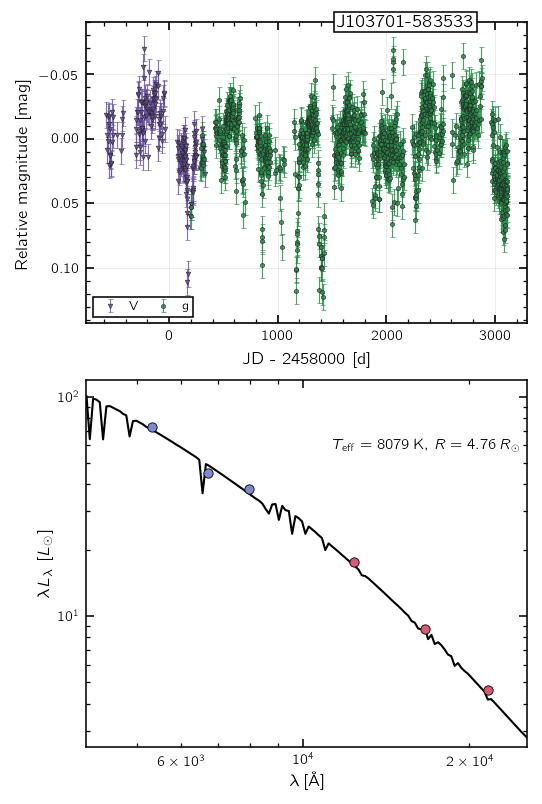

73/164  stv_627065796369  J103701-583533


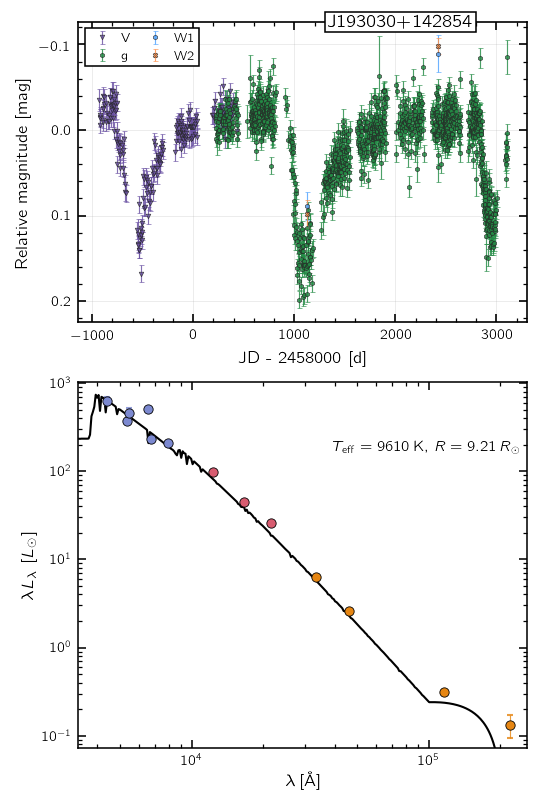

74/164  stv_386547717669  J193030+142854


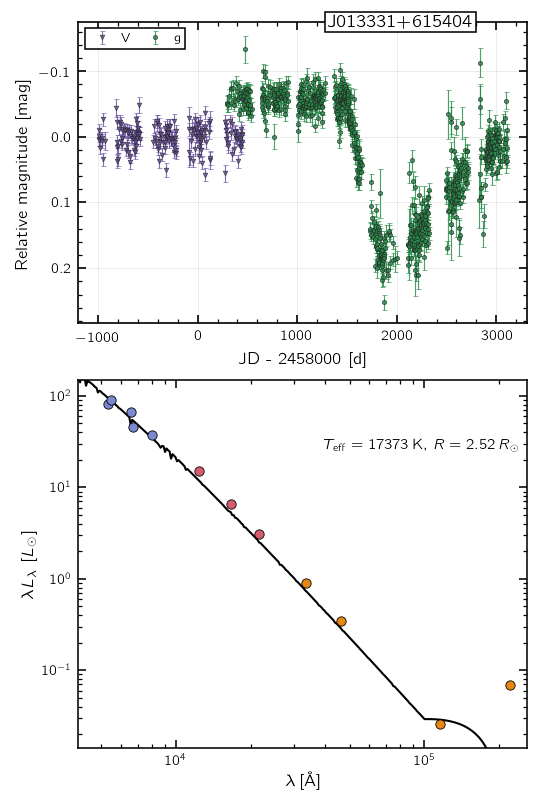

75/164  stv_111669305159  J013331+615404


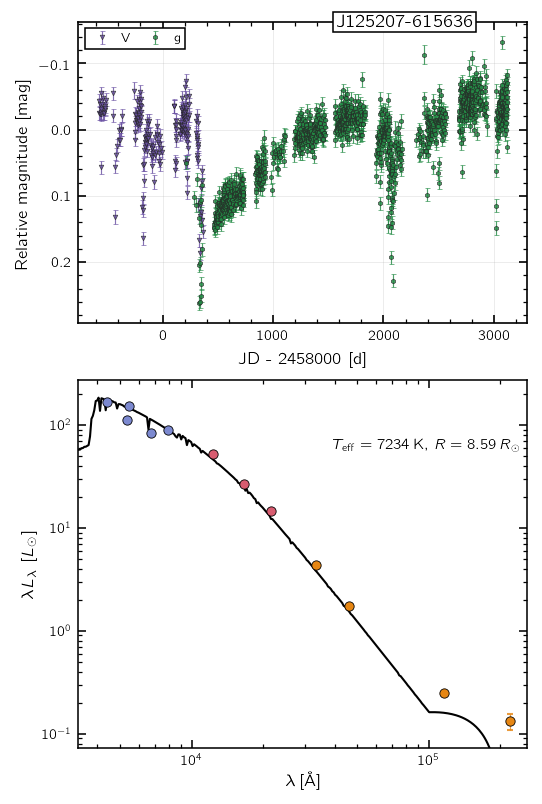

76/164  stv_609885931971  J125207-615636


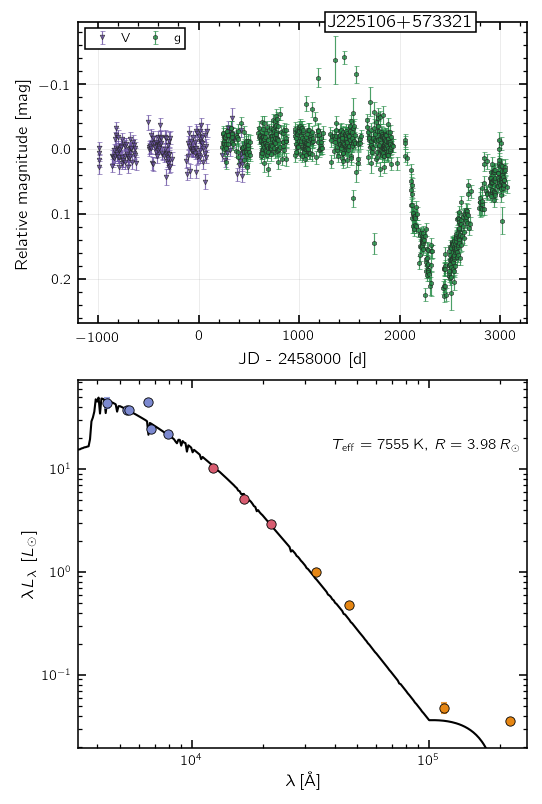

77/164  stv_146029052740  J225106+573321


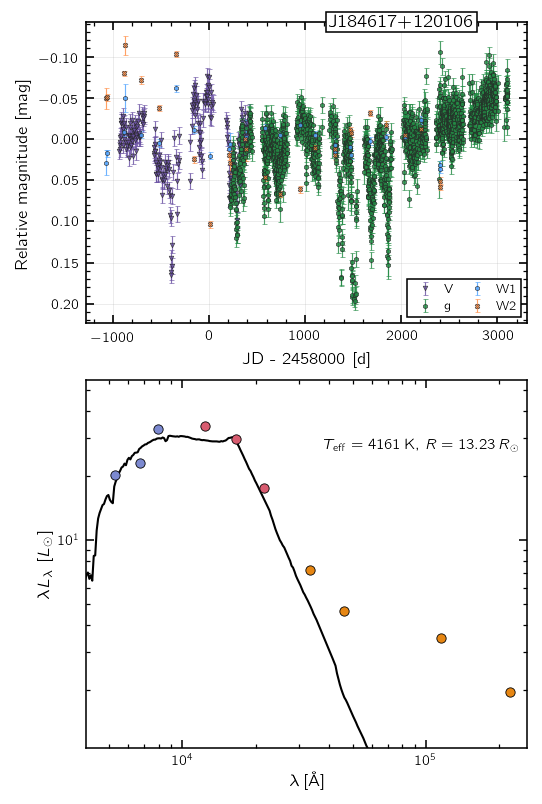

78/164  stv_395137530106  J184617+120106


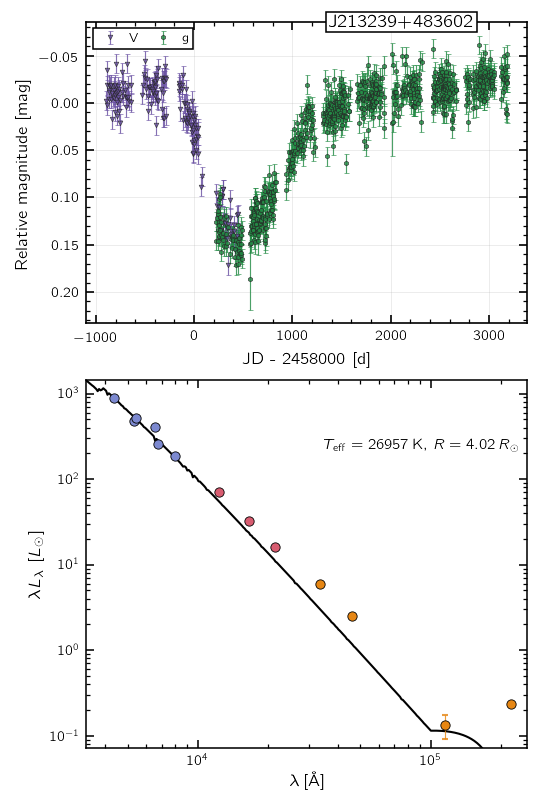

79/164  stv_111669455609  J213239+483602


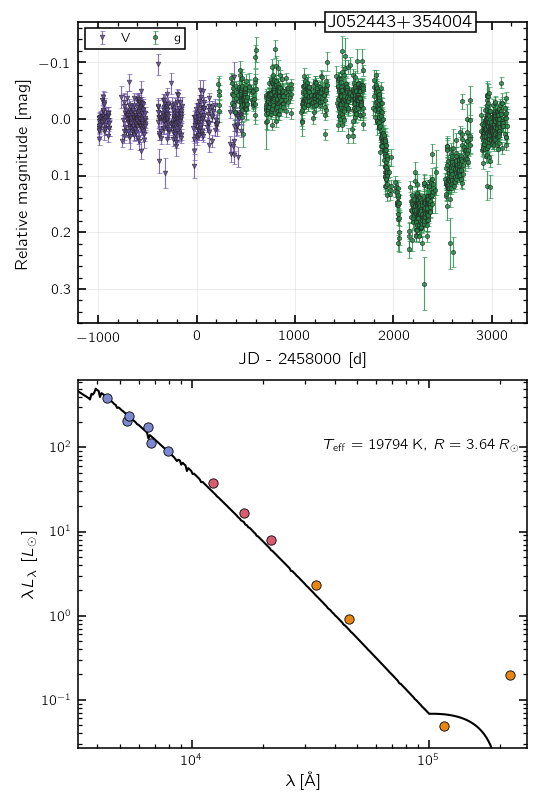

80/164  stv_8591170248  J052443+354004


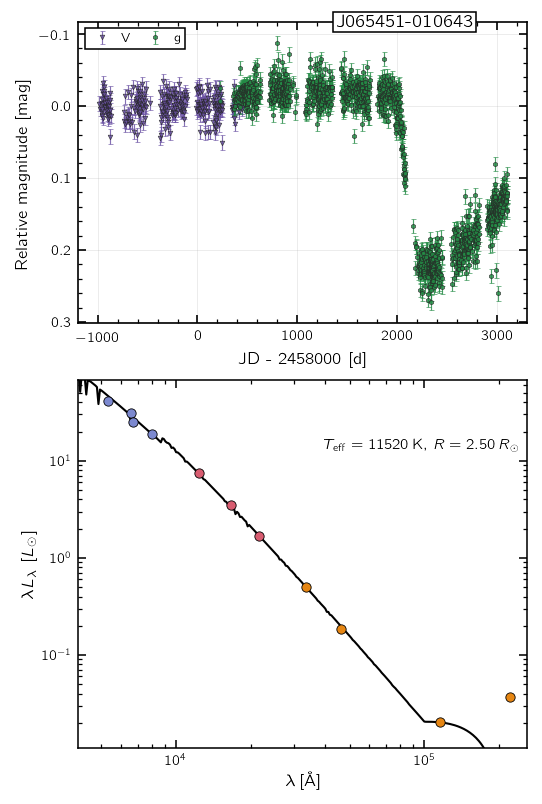

81/164  stv_249109213616  J065451-010643


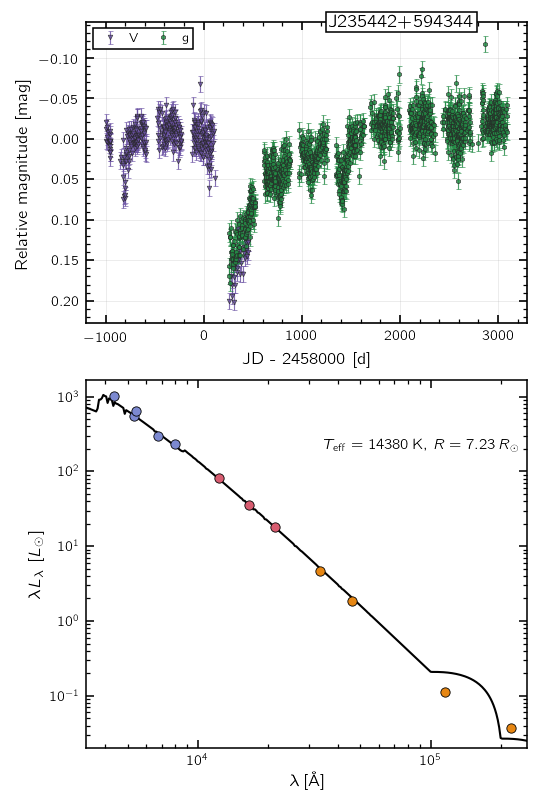

82/164  stv_8591303502  J235442+594344


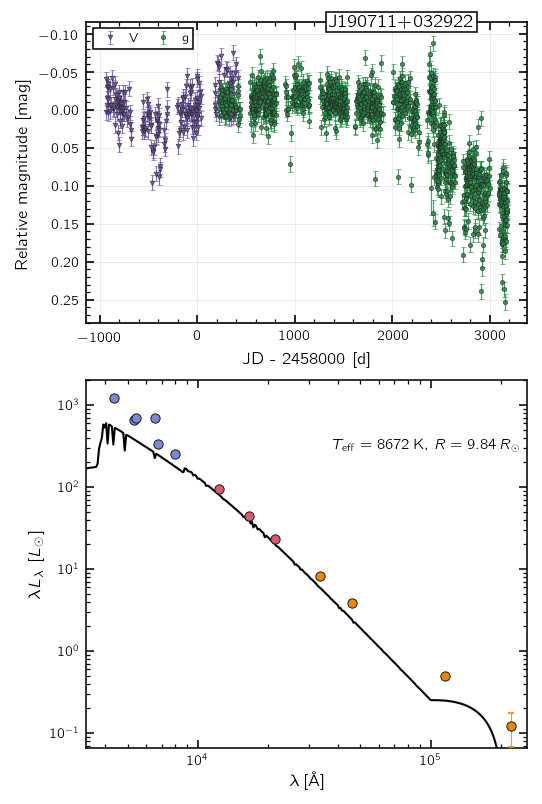

83/164  stv_283467842509  J190711+032922


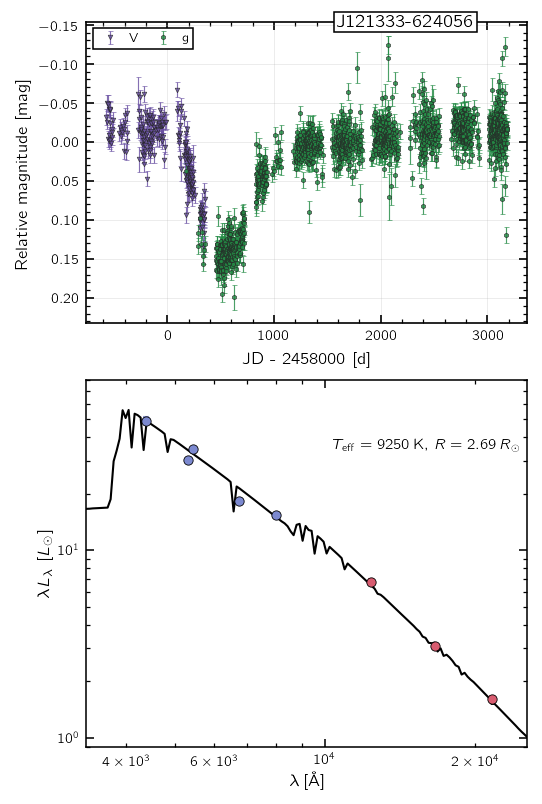

84/164  stv_532576256705  J121333-624056


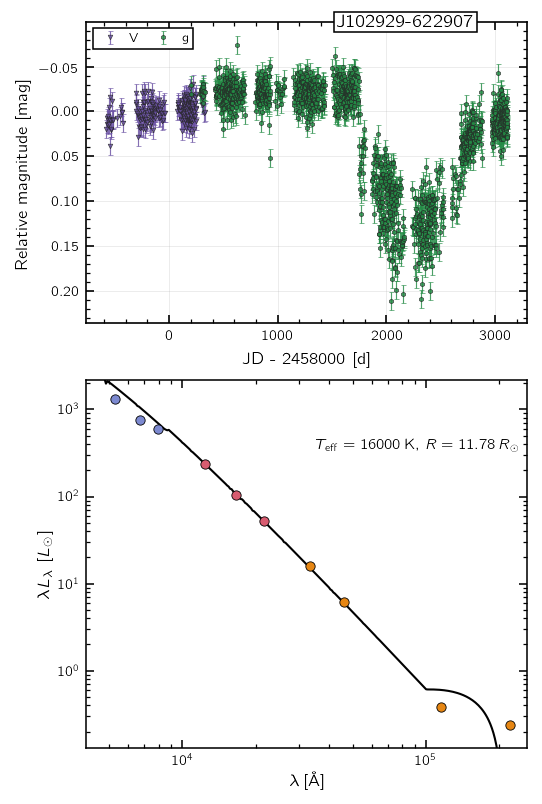

85/164  stv_601295730966  J102929-622907


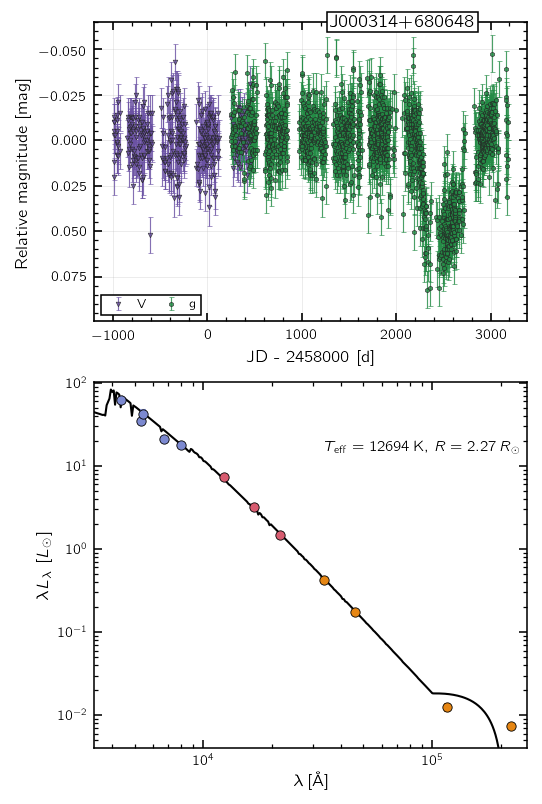

86/164  stv_17181027305  J000314+680648


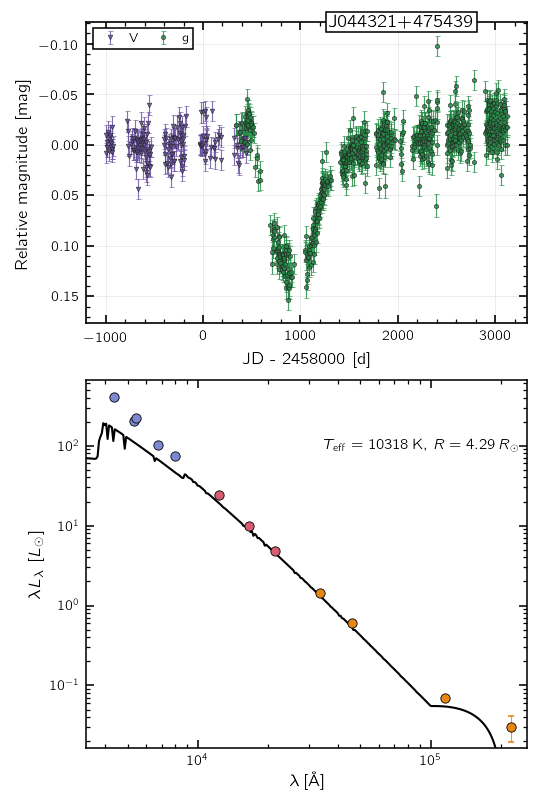

87/164  stv_120259148405  J044321+475439


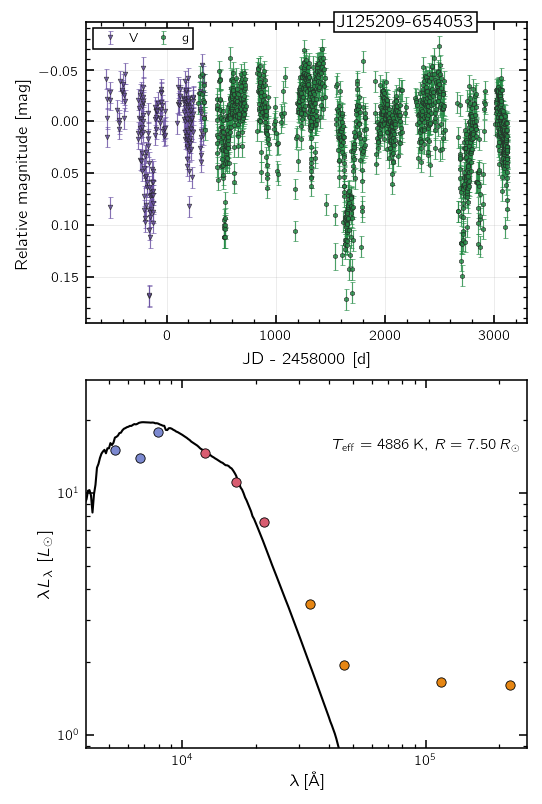

88/164  stv_652835964994  J125209-654053


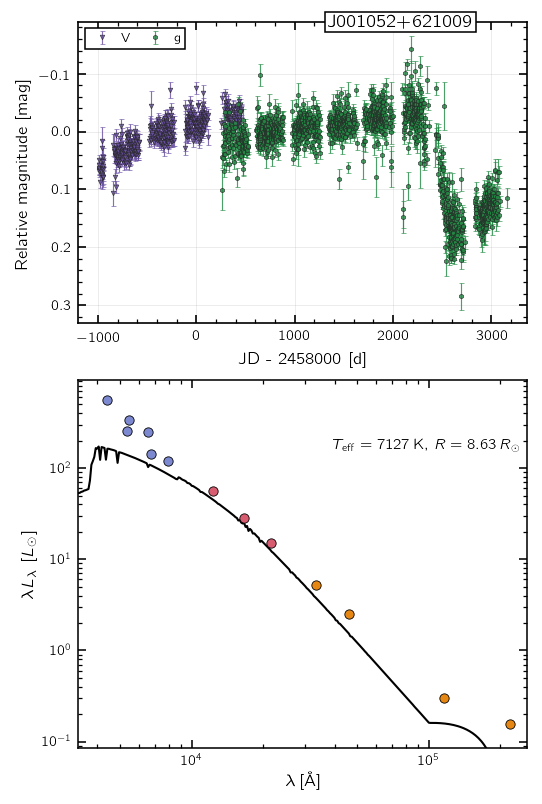

89/164  stv_120259356690  J001052+621009


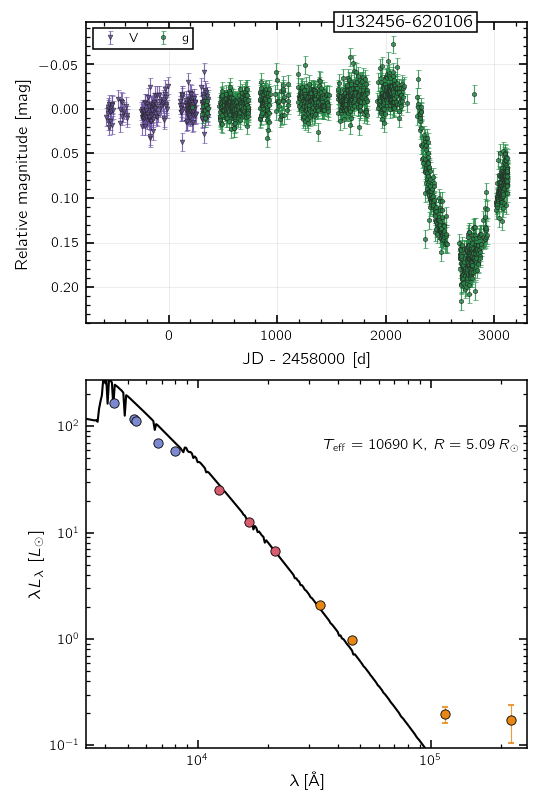

90/164  stv_635655520796  J132456-620106


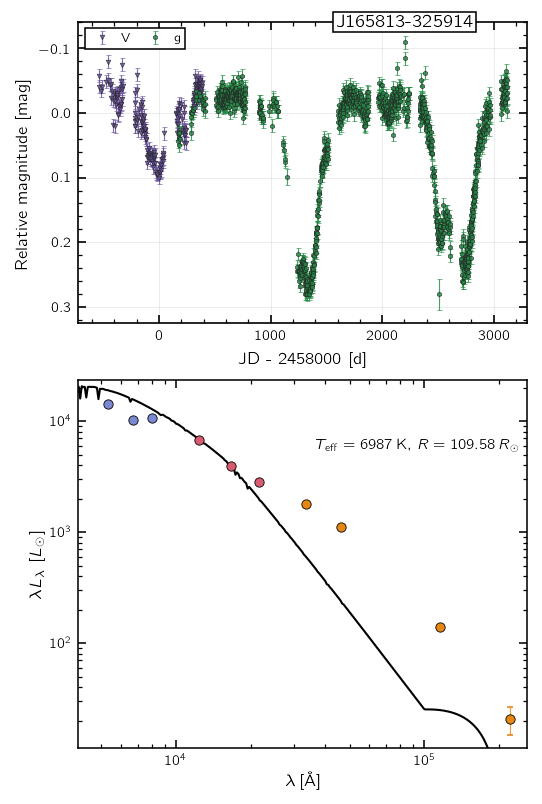

91/164  stv_300648040390  J165813-325914


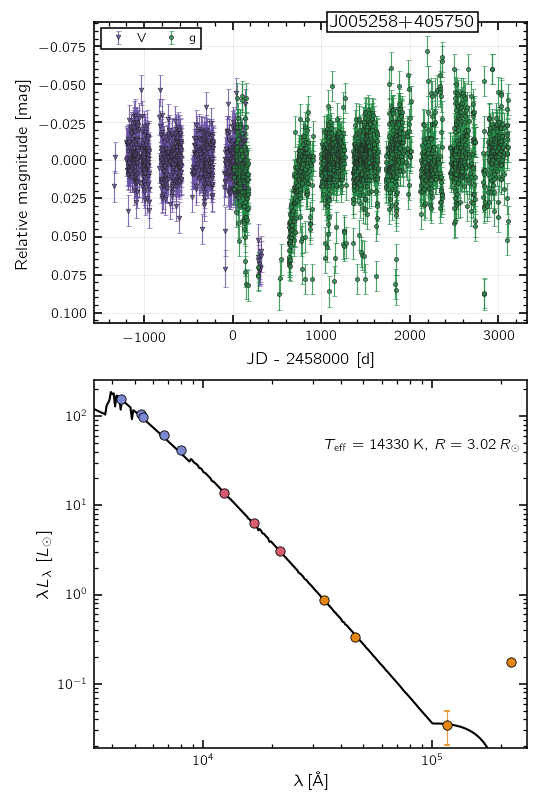

92/164  stv_60130131403  J005258+405750


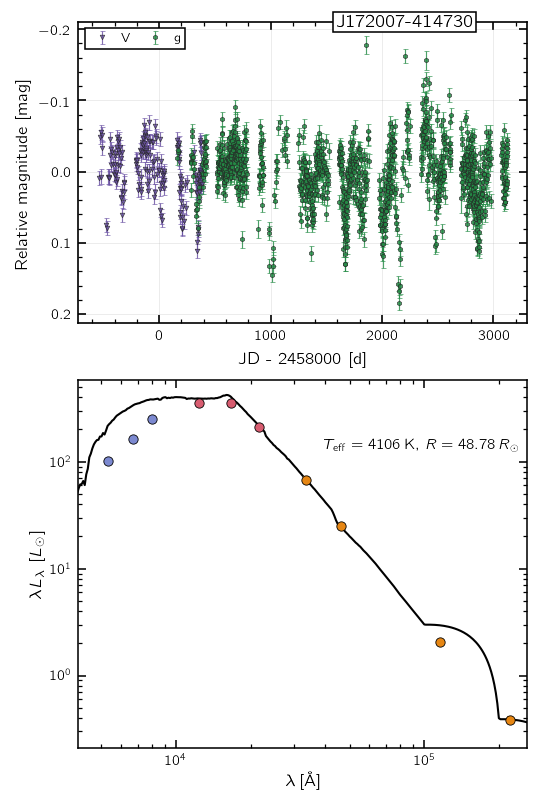

93/164  stv_463856750690  J172007-414730


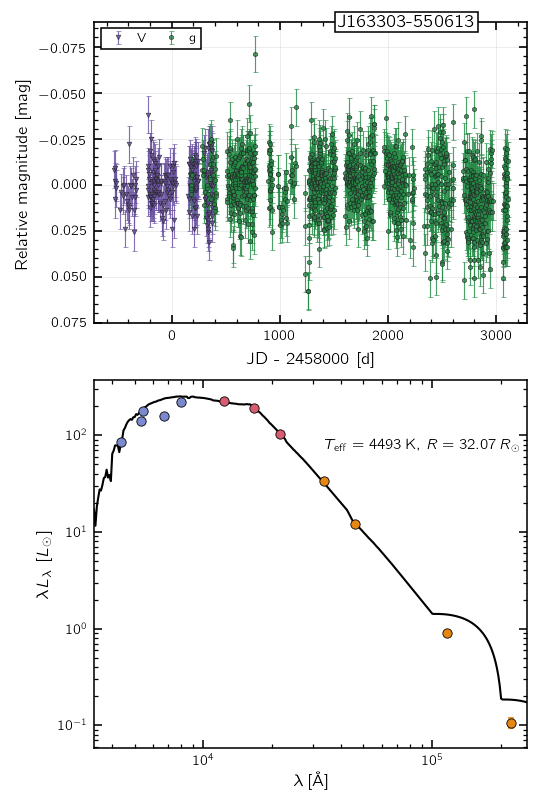

94/164  stv_498217396542  J163303-550613


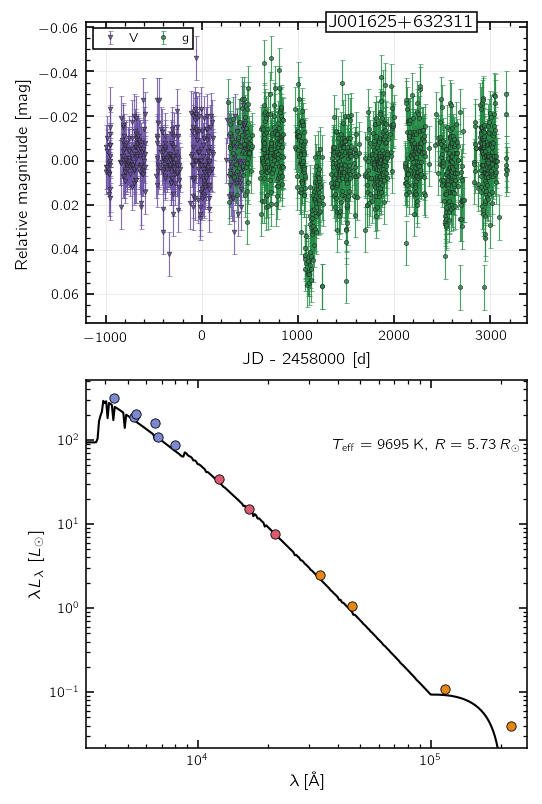

95/164  stv_17180437911  J001625+632311


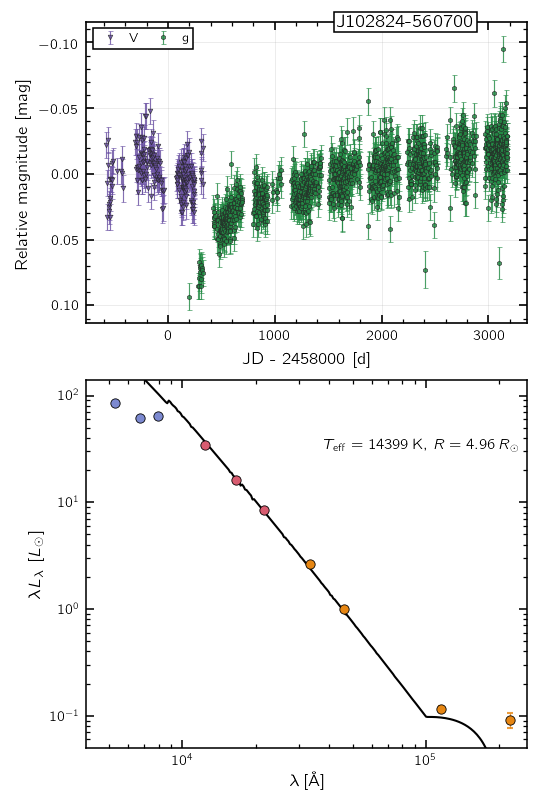

96/164  stv_618475663505  J102824-560700


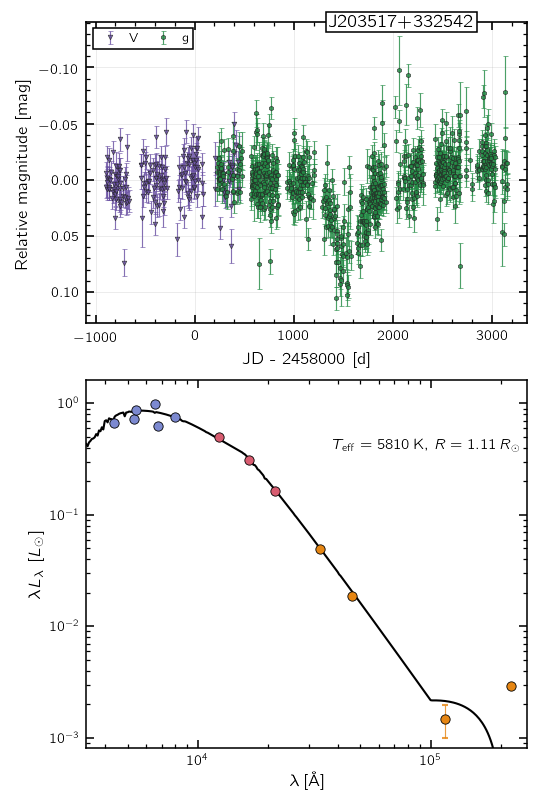

97/164  stv_111670309173  J203517+332542


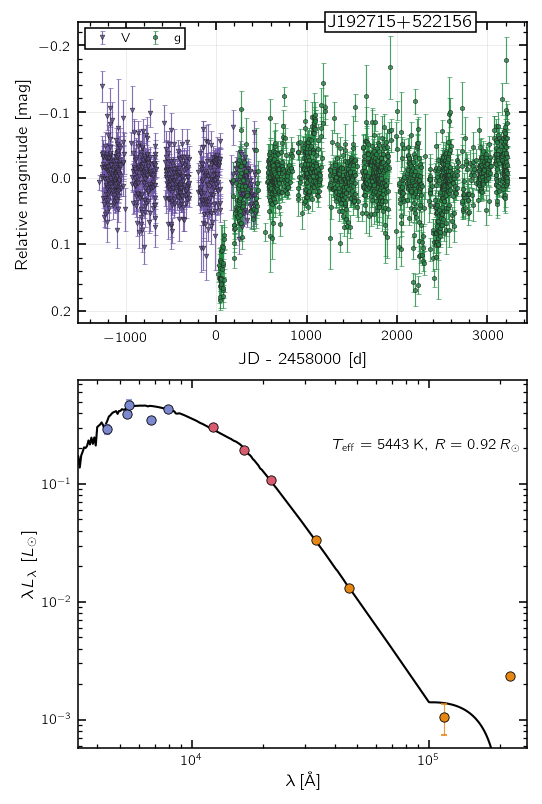

98/164  stv_77309980503  J192715+522156


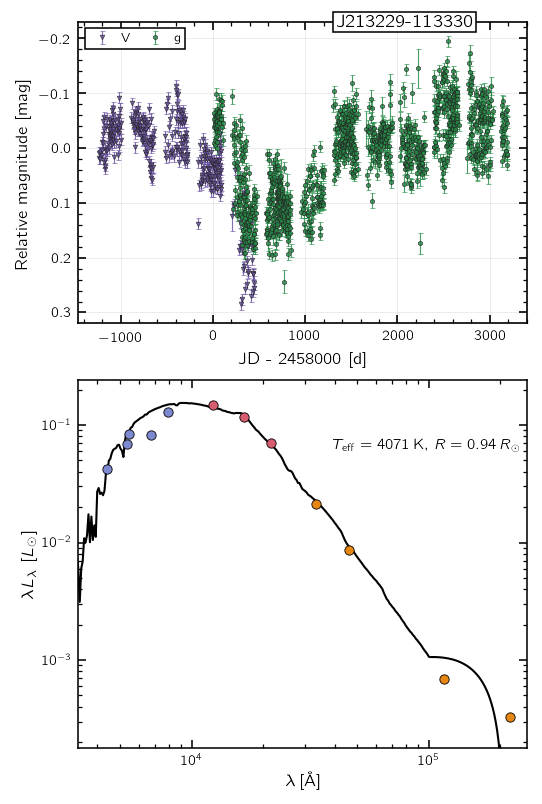

99/164  stv_292059016008  J213229-113330


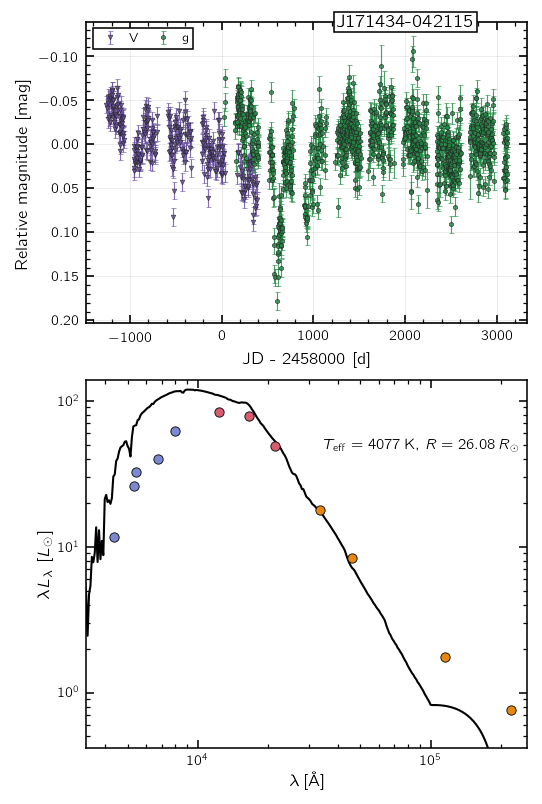

100/164  stv_403727513981  J171434-042115


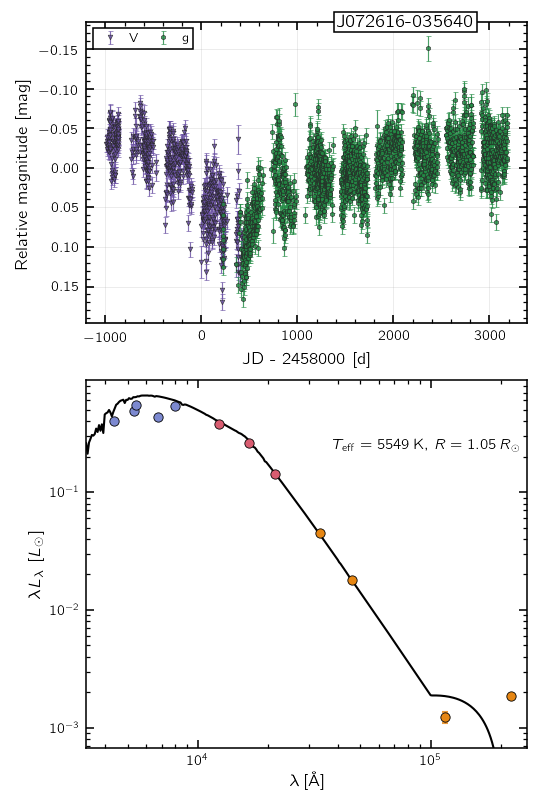

101/164  stv_369367234804  J072616-035640


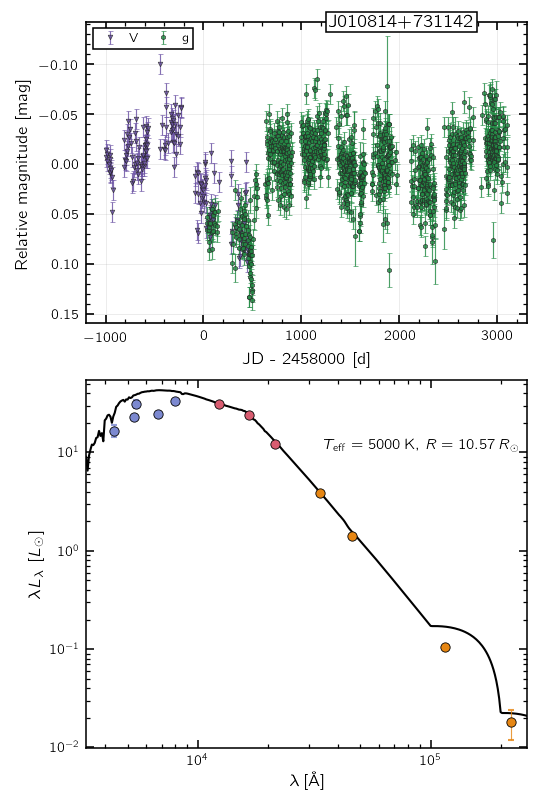

102/164  stv_17180374105  J010814+731142


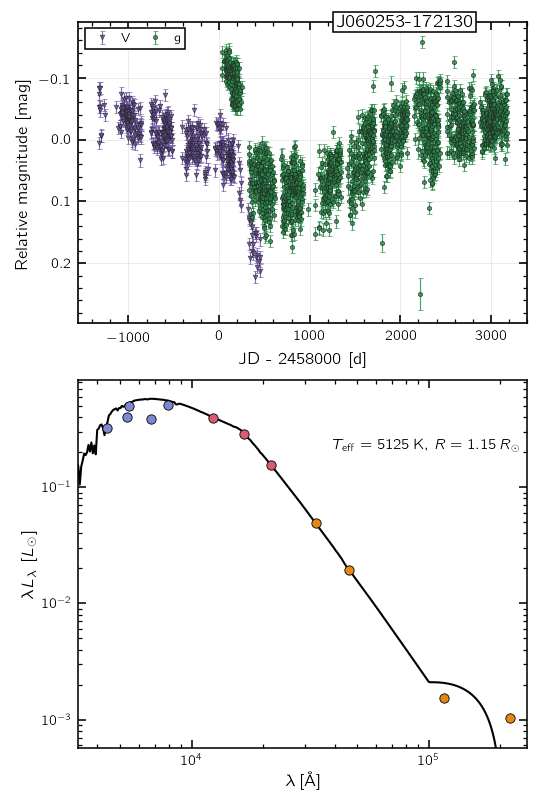

103/164  stv_360777826205  J060253-172130


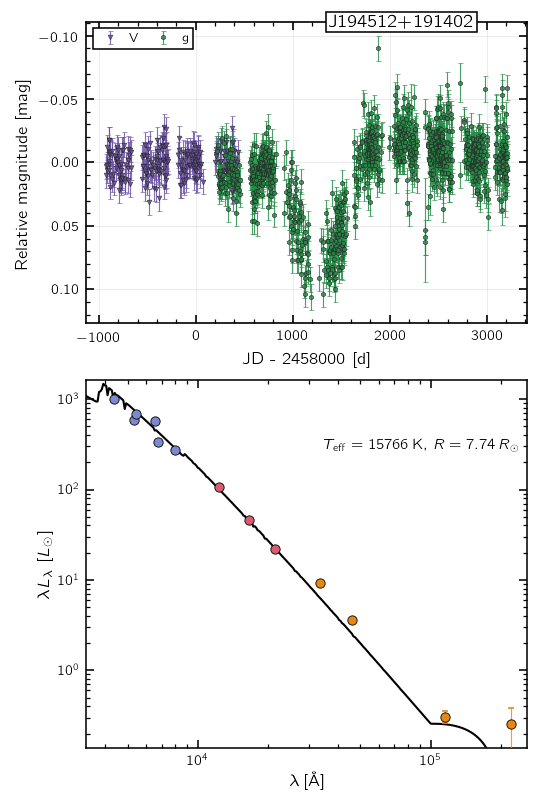

104/164  stv_197569226514  J194512+191402


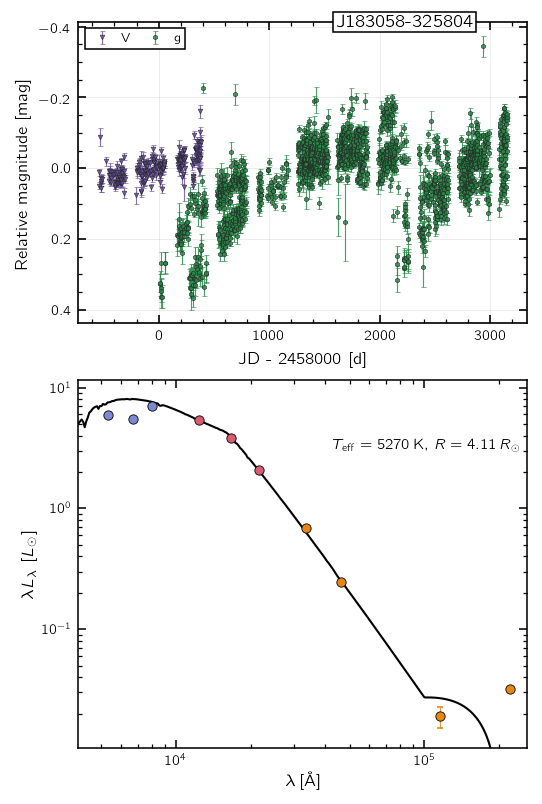

105/164  stv_395138016907  J183058-325804


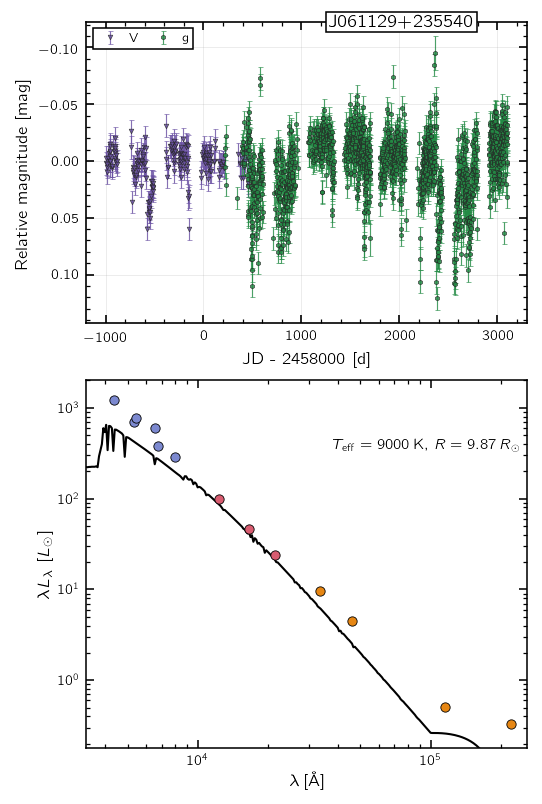

106/164  stv_163209415214  J061129+235540


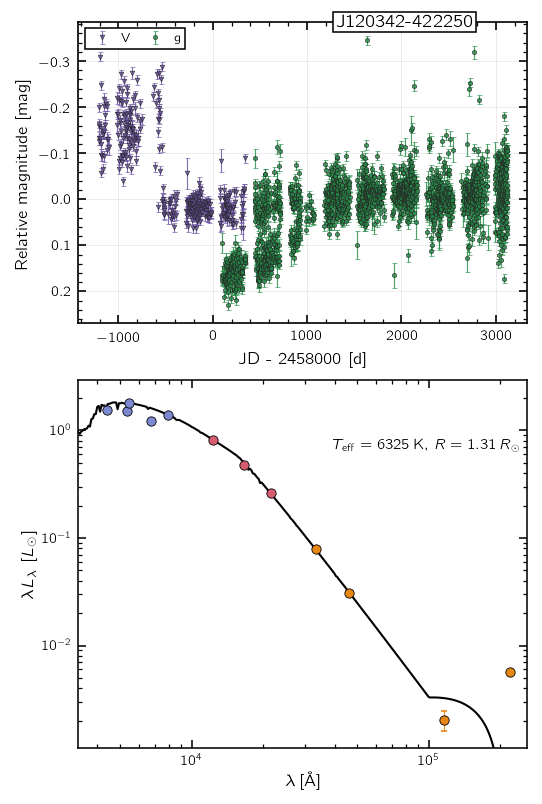

107/164  stv_403727411589  J120342-422250


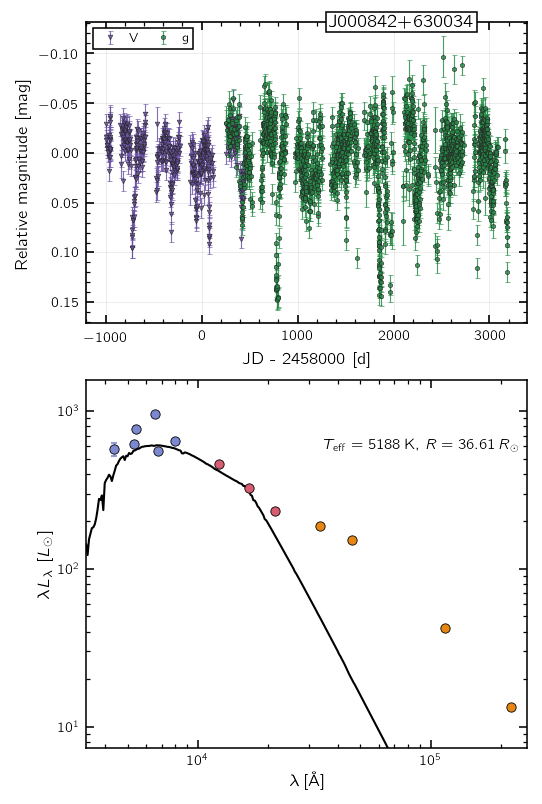

108/164  stv_25770316308  J000842+630034


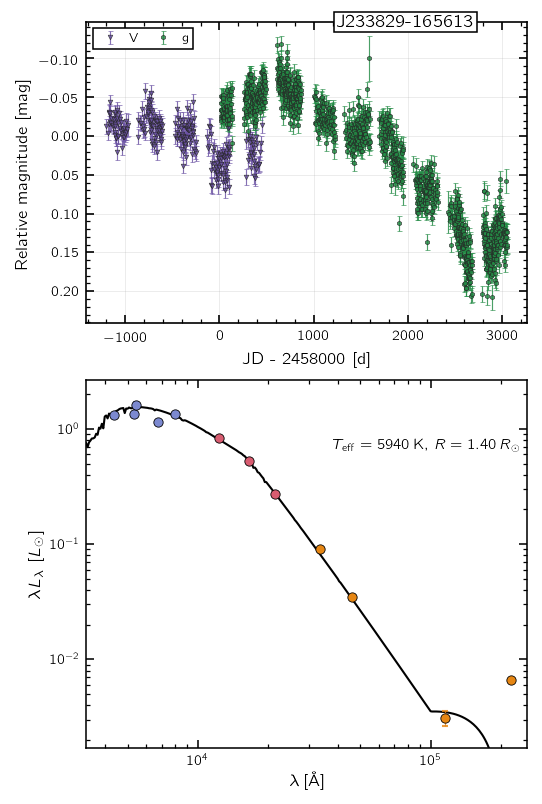

109/164  stv_584116028406  J233829-165613


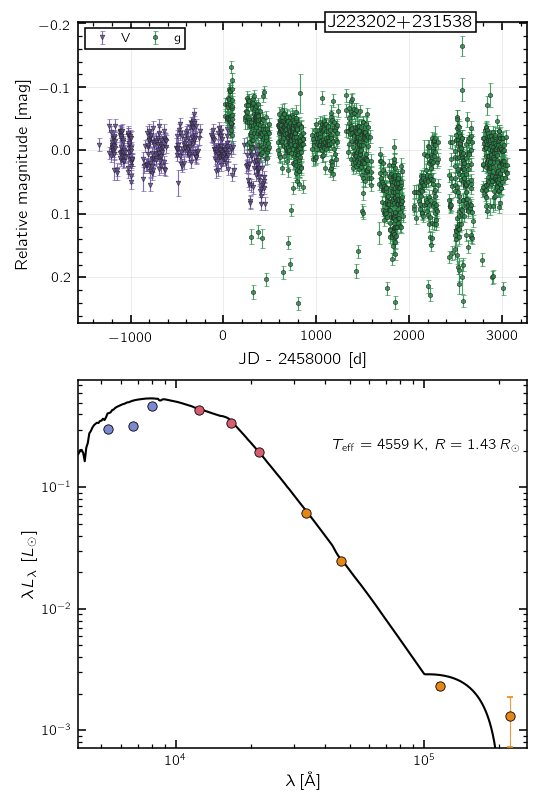

110/164  stv_154620038181  J223202+231538


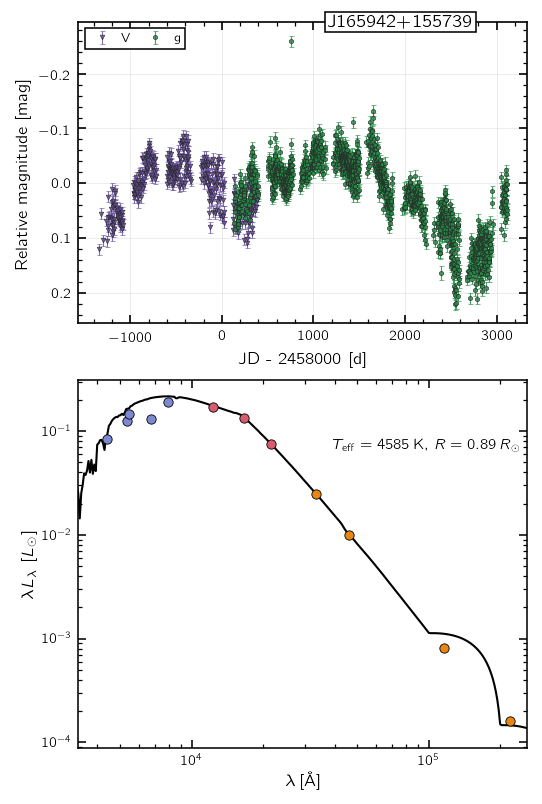

111/164  stv_180388640882  J165942+155739


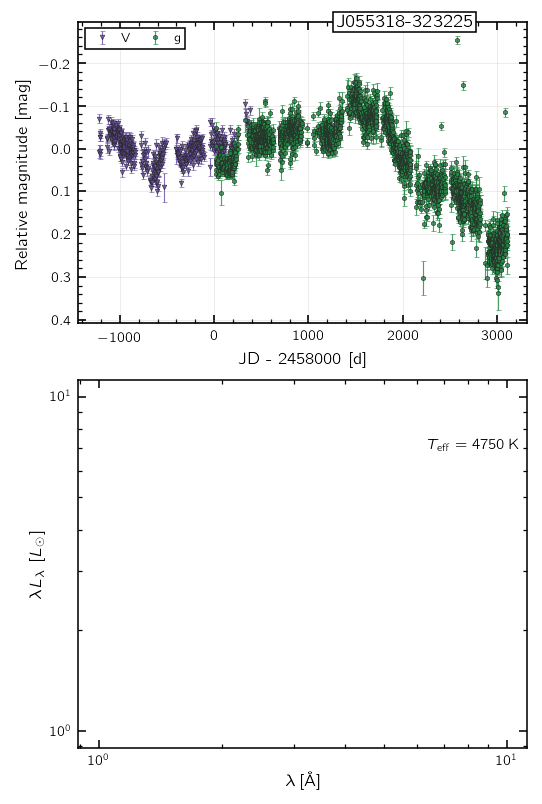

112/164  stv_592705538522  J055318-323225


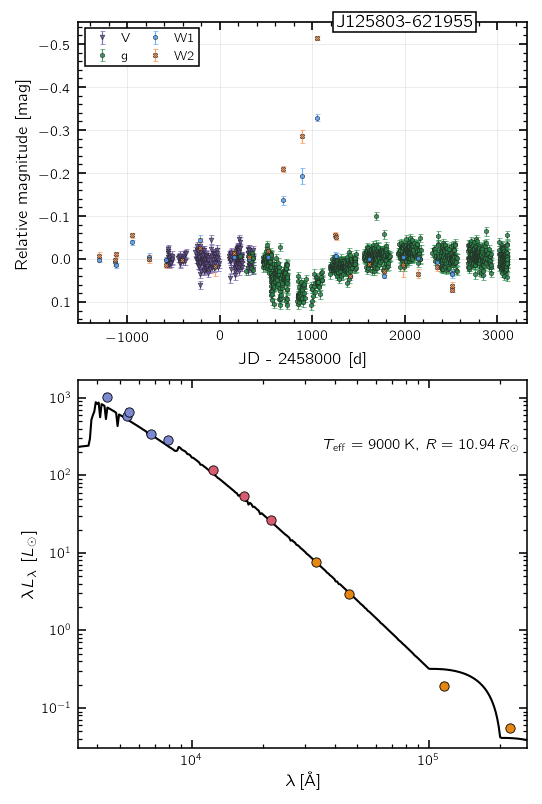

113/164  stv_601295761416  J125803-621955


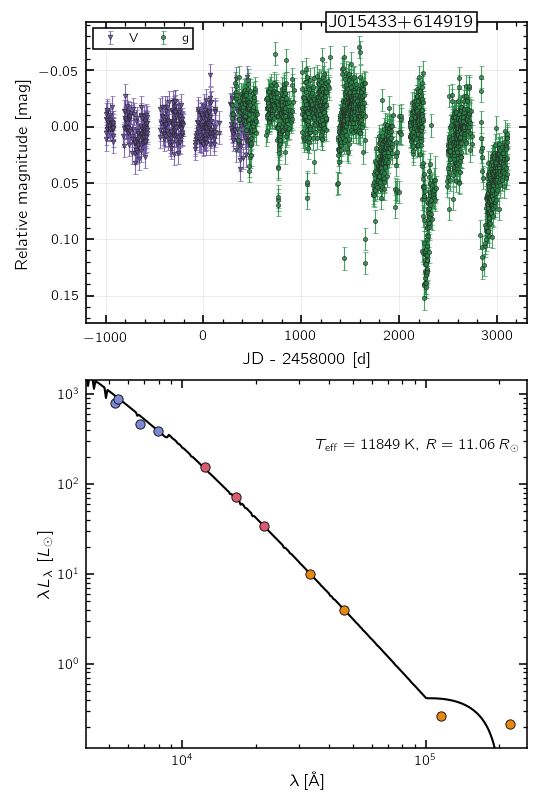

114/164  stv_111669273145  J015433+614919


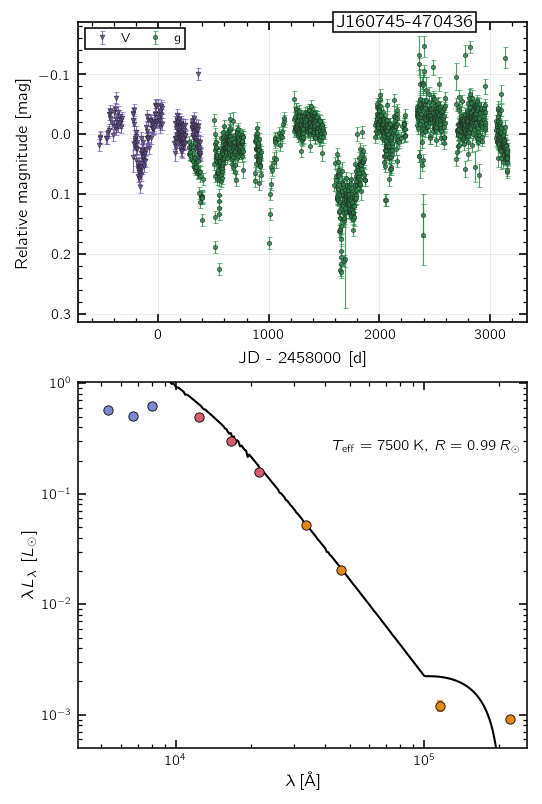

115/164  stv_395137575008  J160745-470436


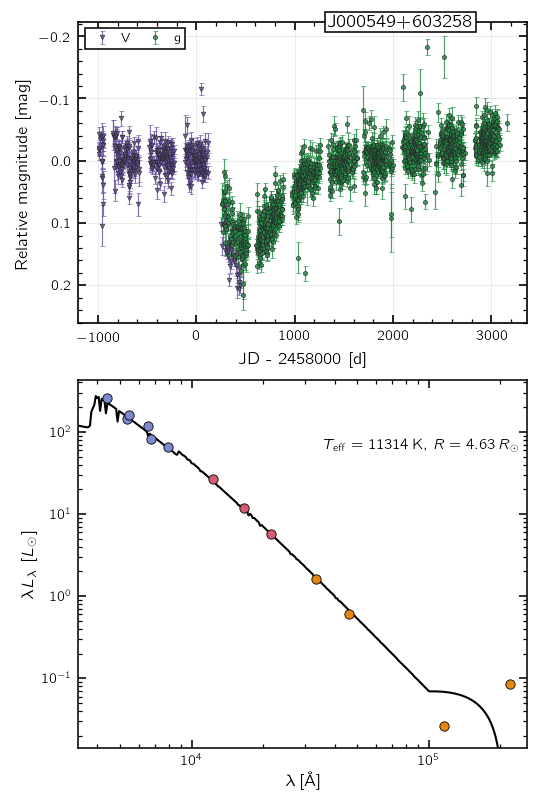

116/164  stv_60130141761  J000549+603258


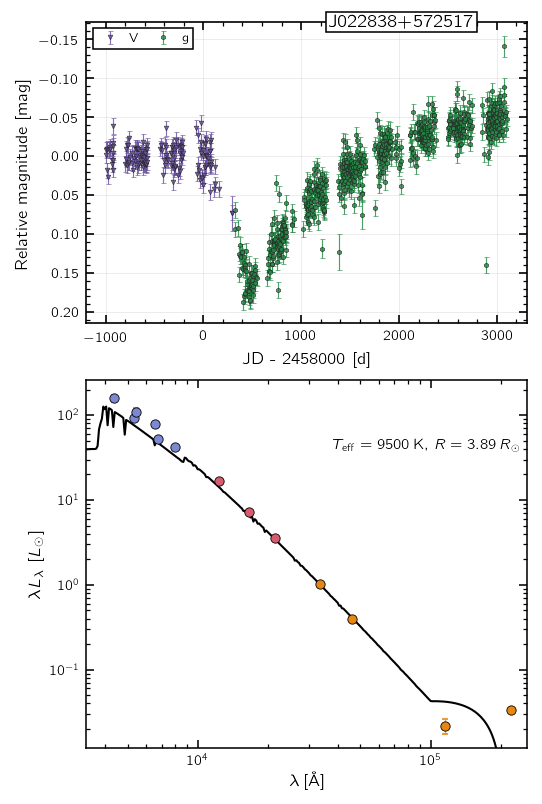

117/164  stv_68720714610  J022838+572517


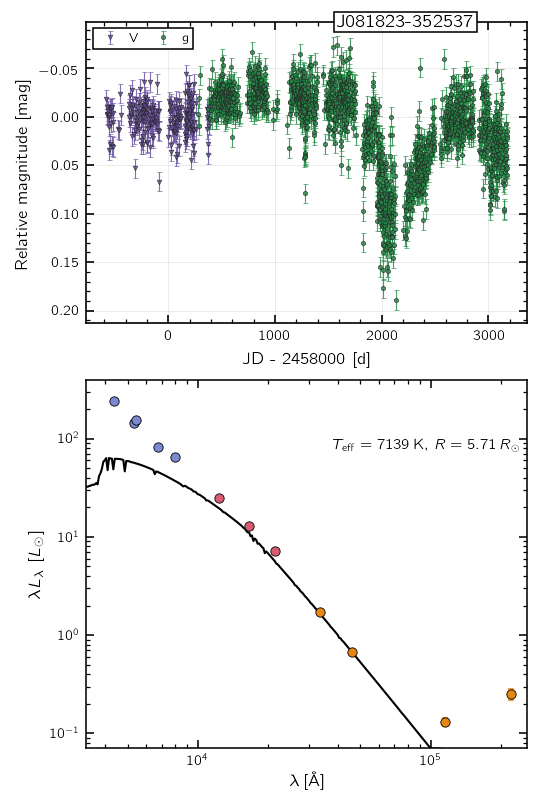

118/164  stv_541166985810  J081823-352537


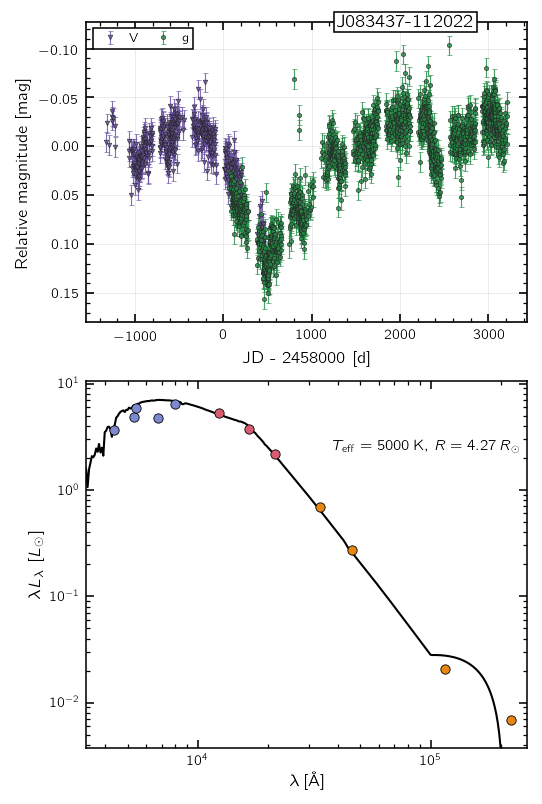

119/164  stv_300648087617  J083437-112022


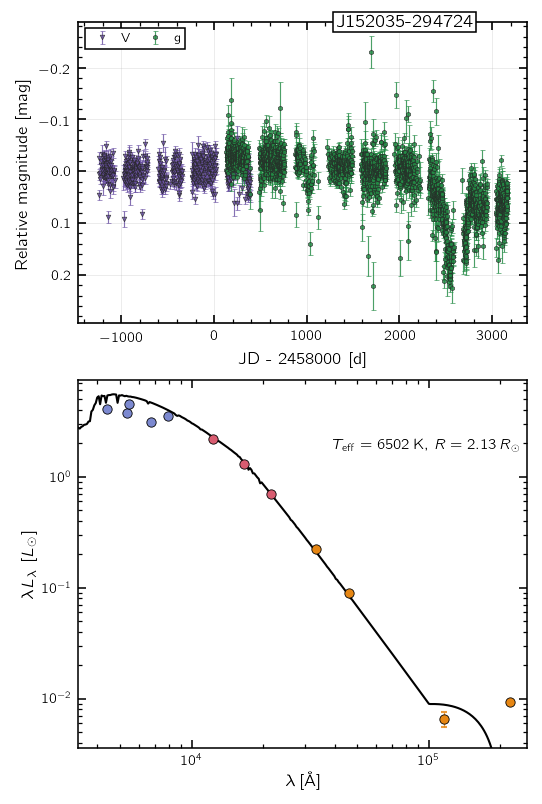

120/164  stv_541166181486  J152035-294724


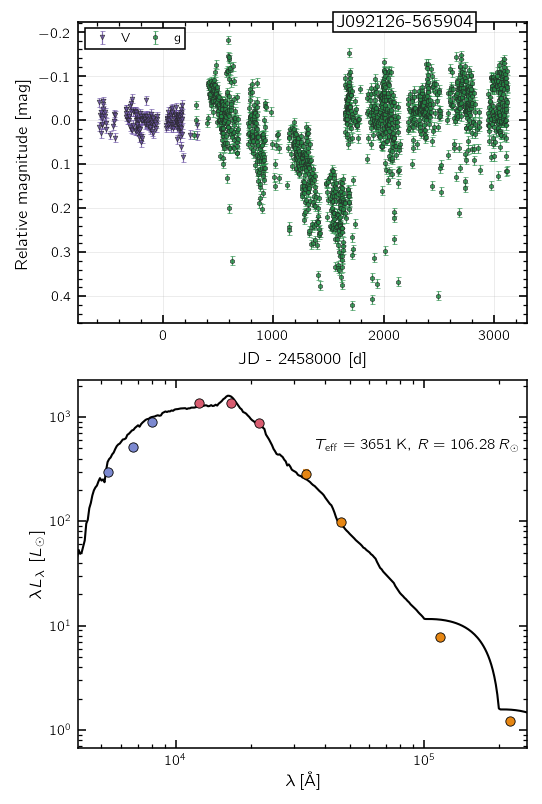

121/164  stv_644245359876  J092126-565904


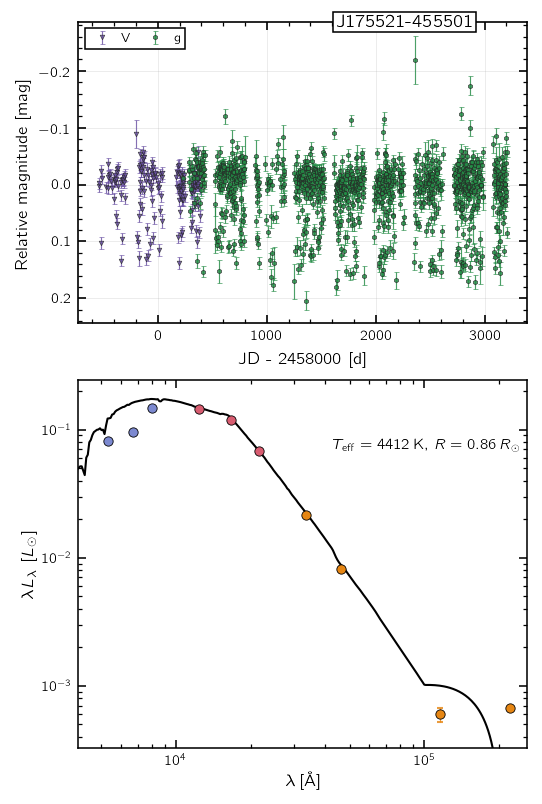

122/164  stv_446677131304  J175521-455501


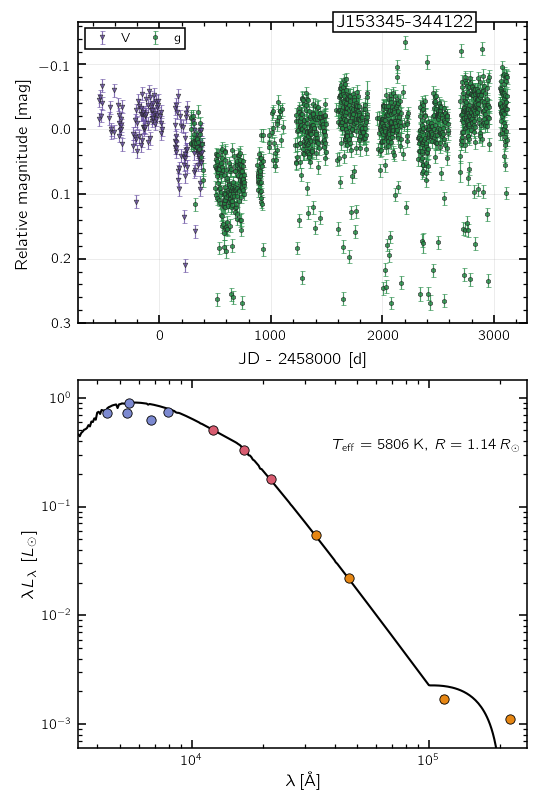

123/164  stv_566936751170  J153345-344122


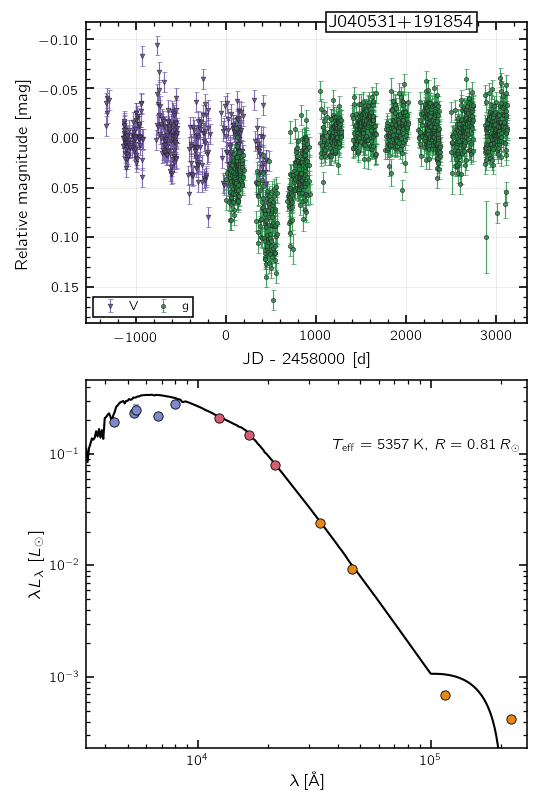

124/164  stv_197569238413  J040531+191854


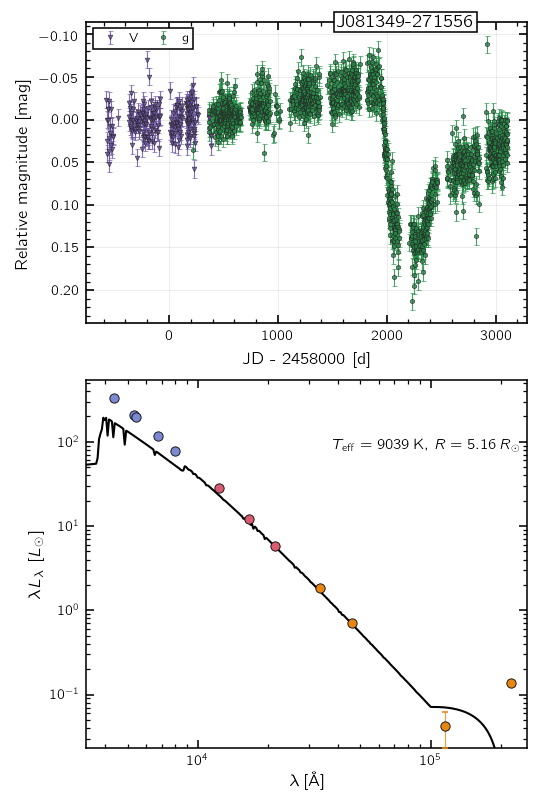

125/164  stv_566936725849  J081349-271556


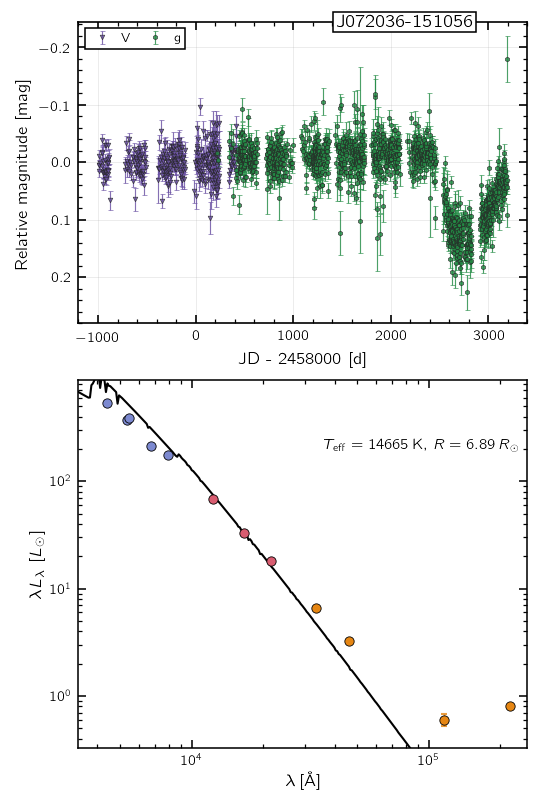

126/164  stv_369367304600  J072036-151056


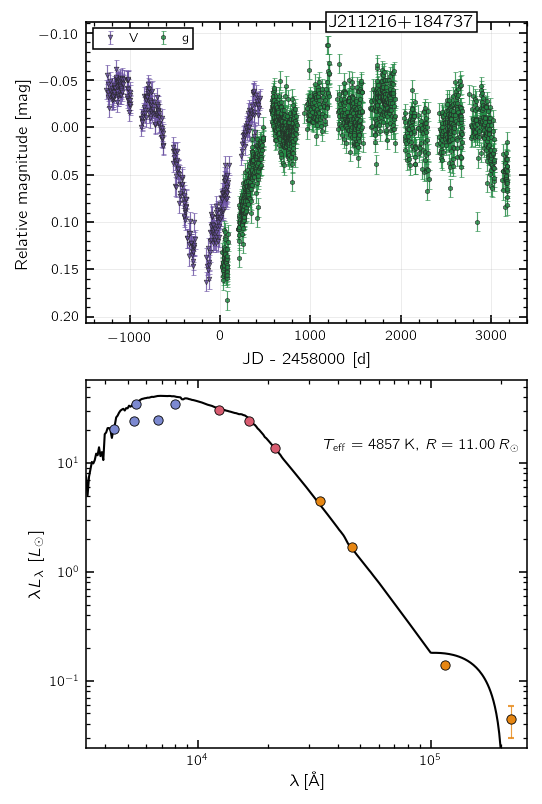

127/164  stv_266288257407  J211216+184737


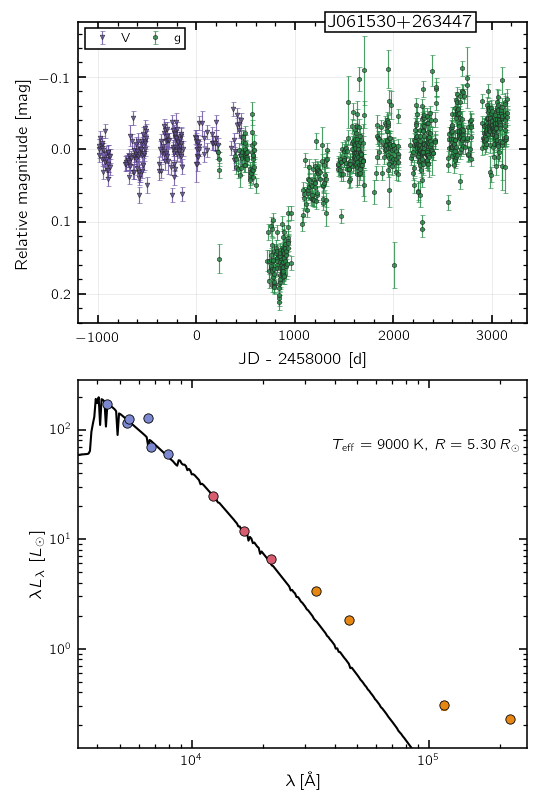

128/164  stv_240518717560  J061530+263447


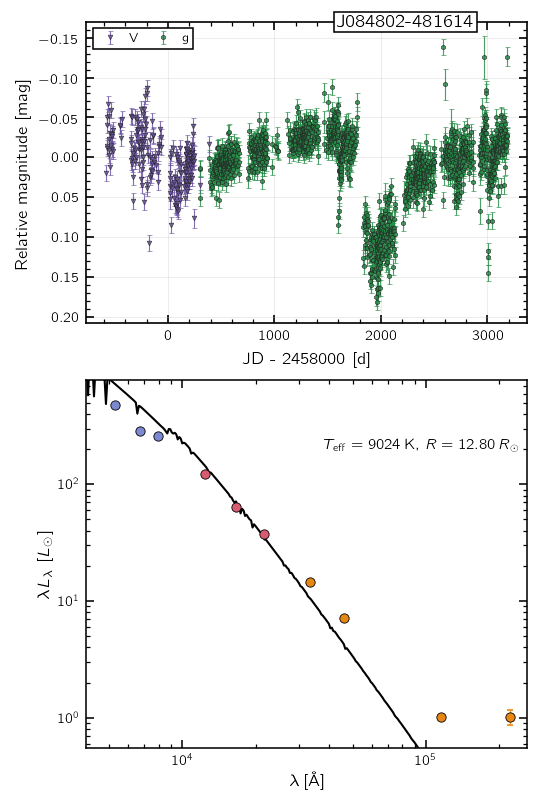

129/164  stv_472446832201  J084802-481614


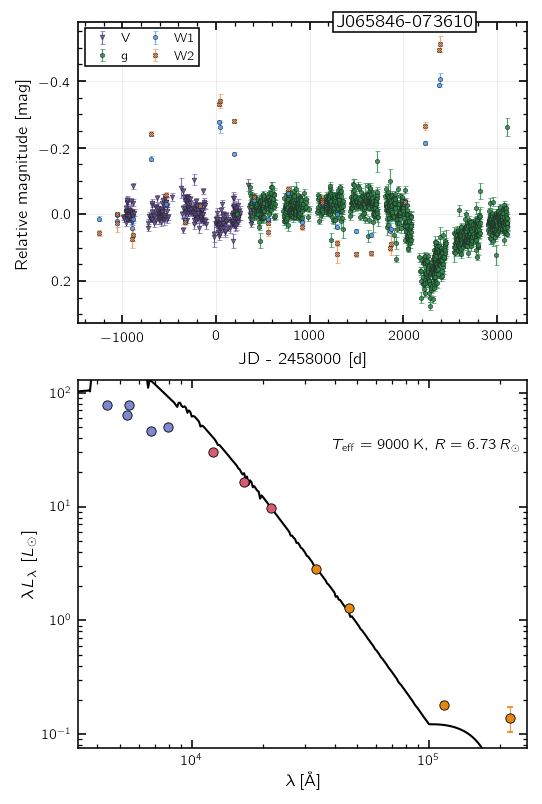

130/164  stv_369368258528  J065846-073610


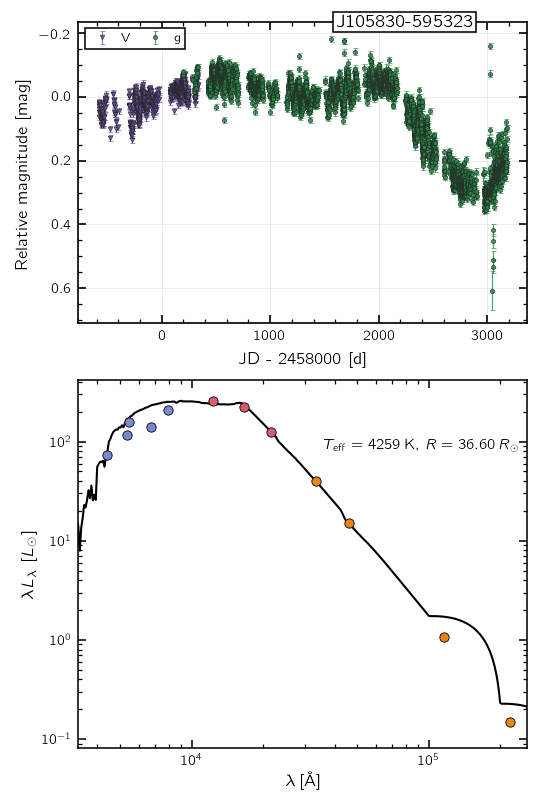

131/164  stv_627065319105  J105830-595323


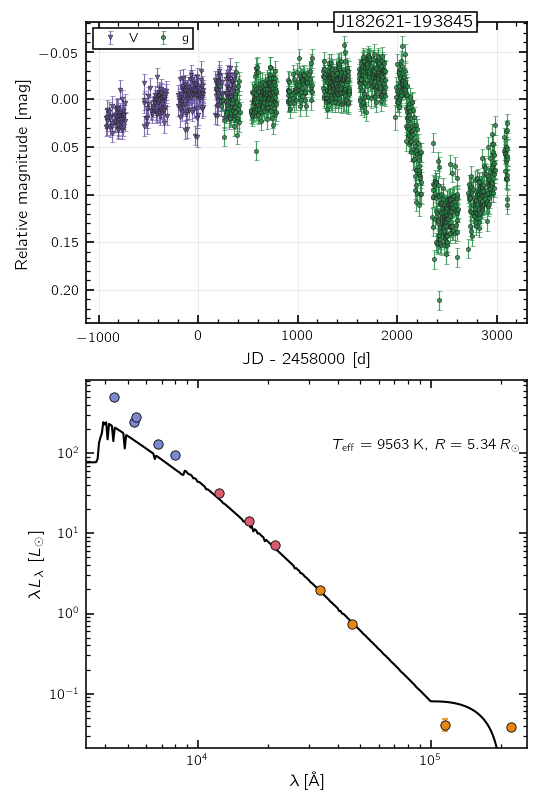

132/164  stv_489626538045  J182621-193845


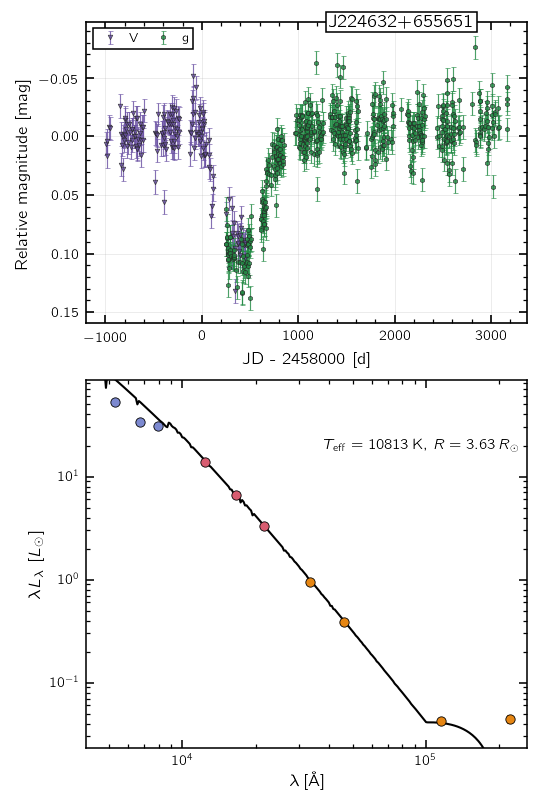

133/164  stv_94489594805  J224632+655651


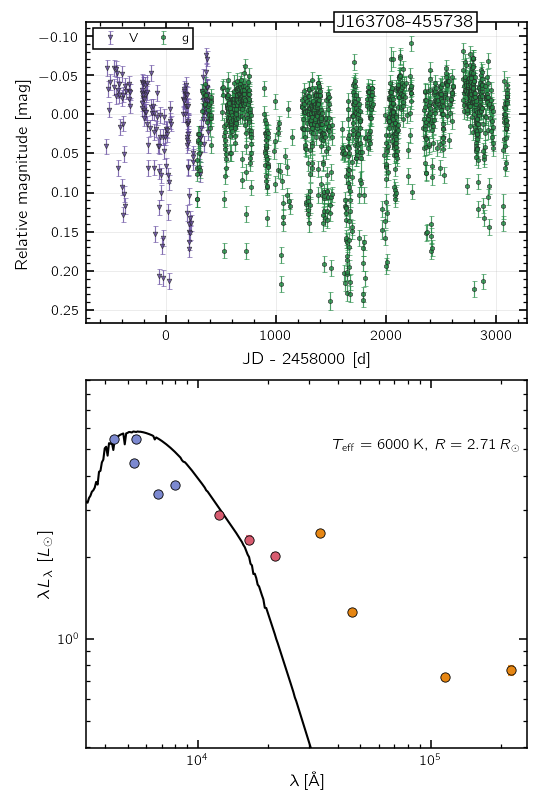

134/164  stv_446677119900  J163708-455738


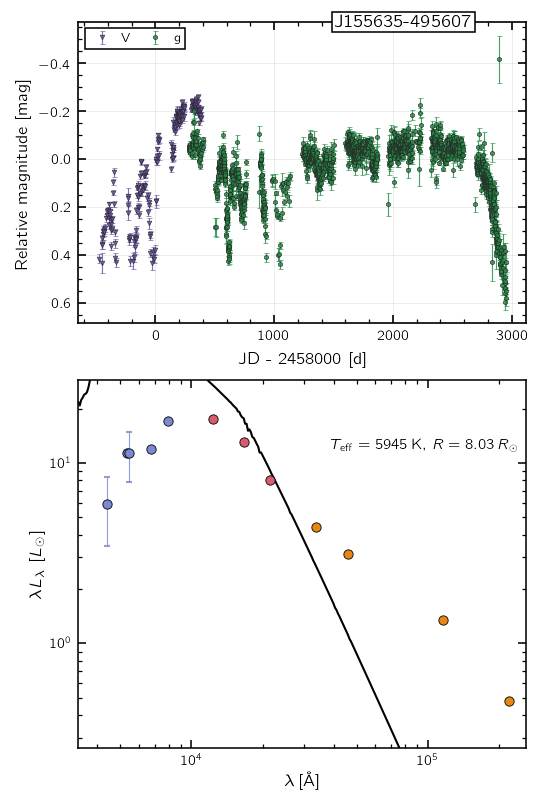

135/164  stv_523987067704  J155635-495607


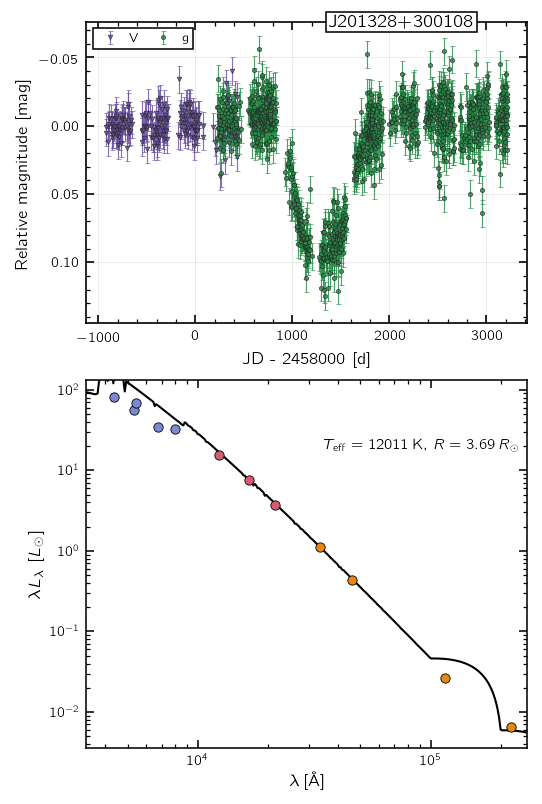

136/164  stv_42950519514  J201328+300108


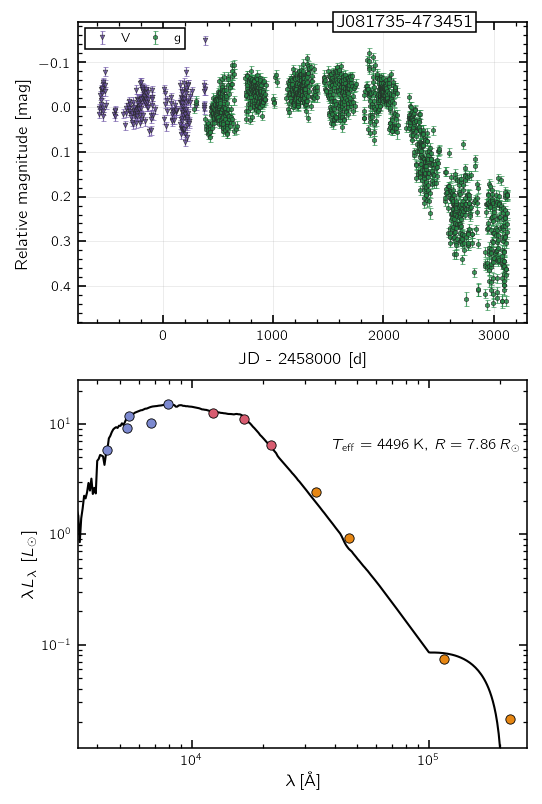

137/164  stv_420907788679  J081735-473451


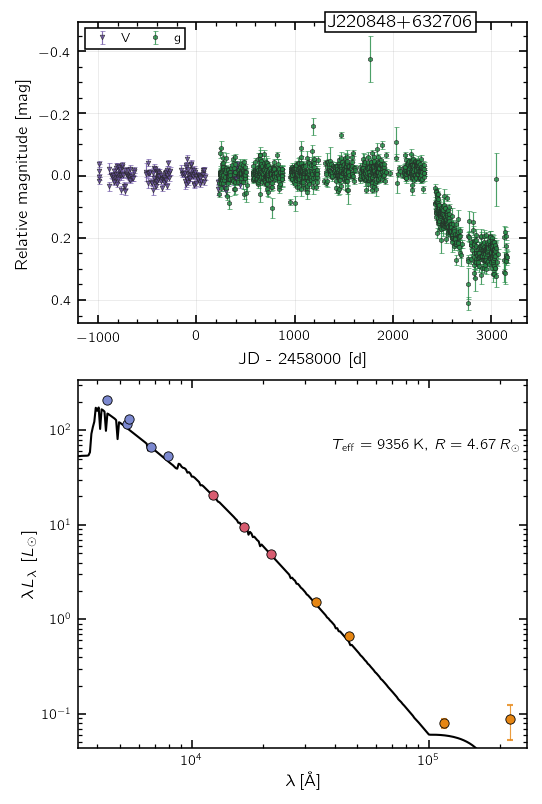

138/164  stv_94489437356  J220848+632706


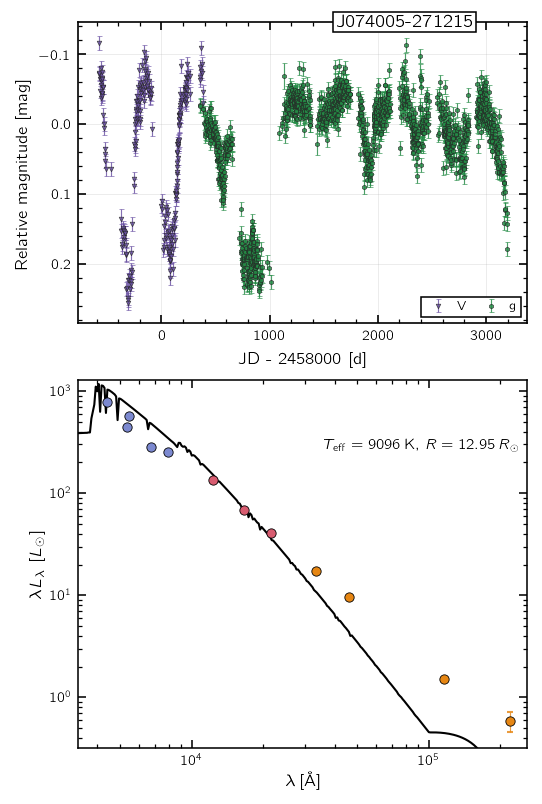

139/164  stv_489626566903  J074005-271215


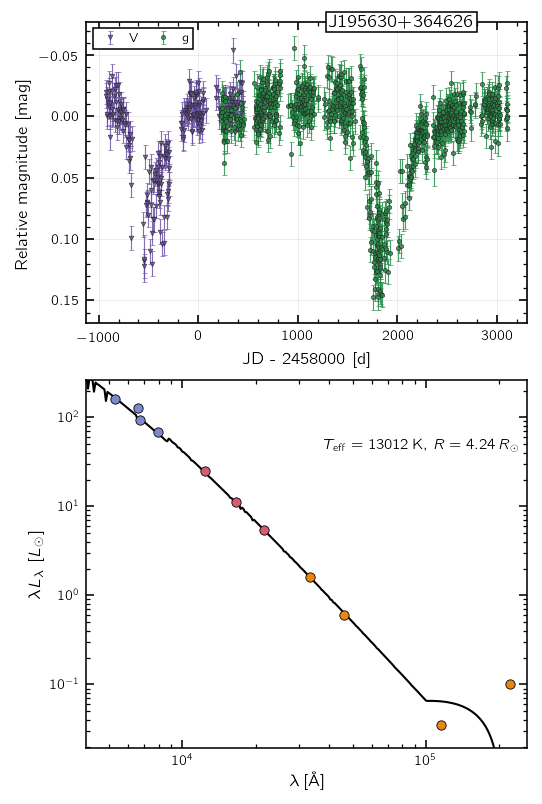

140/164  stv_128850429575  J195630+364626


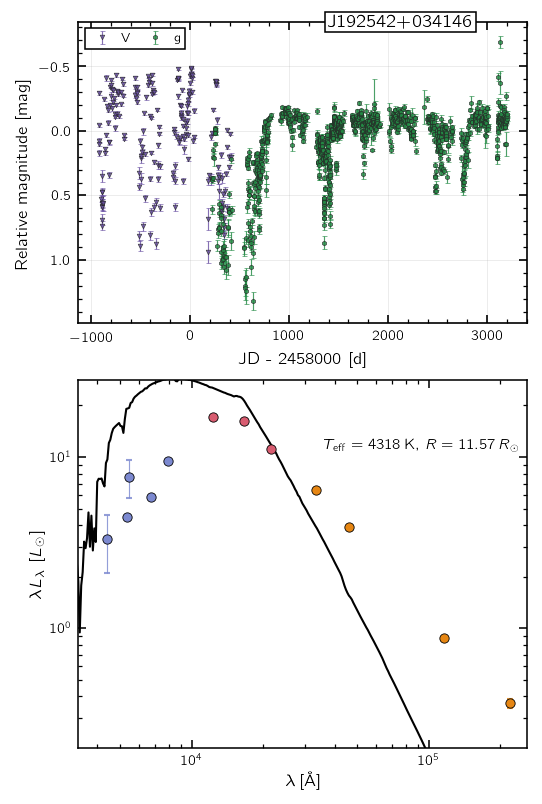

141/164  stv_240519504803  J192542+034146


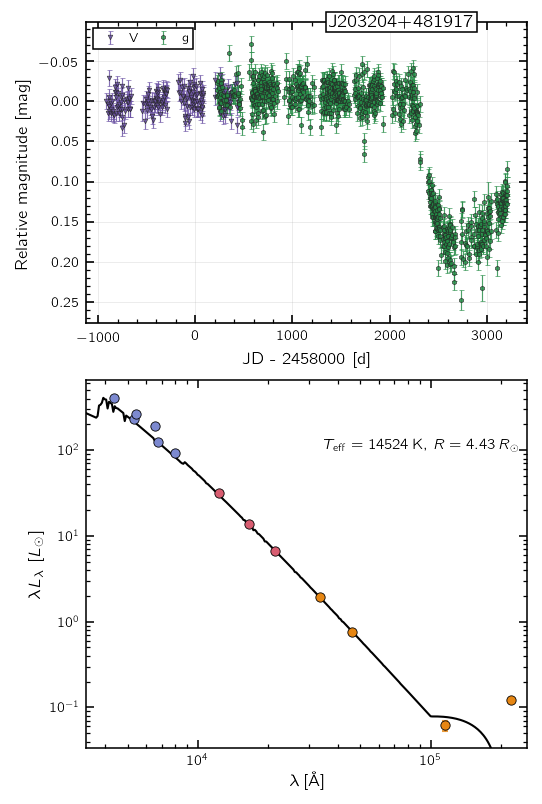

142/164  stv_68719676517  J203204+481917


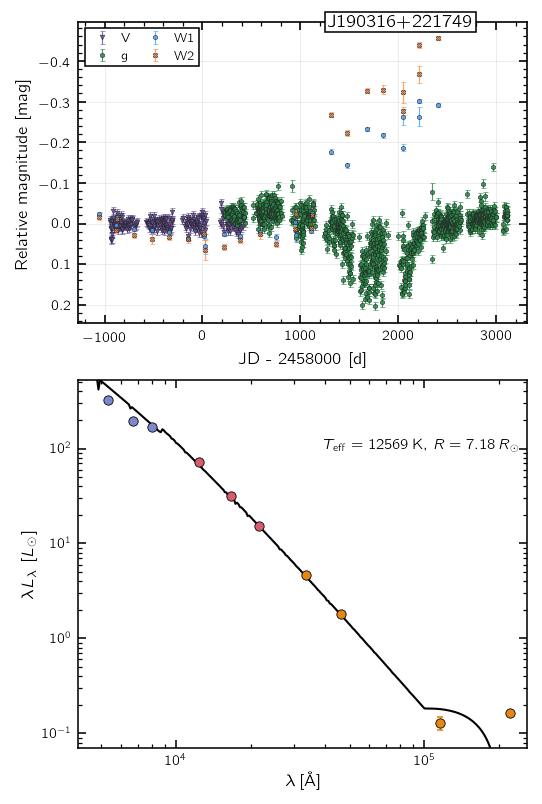

143/164  stv_163209590869  J190316+221749


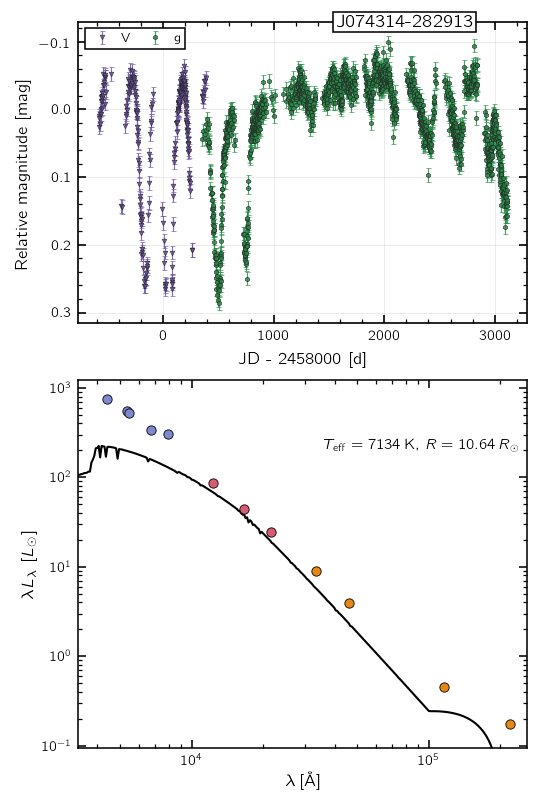

144/164  stv_481036839646  J074314-282913


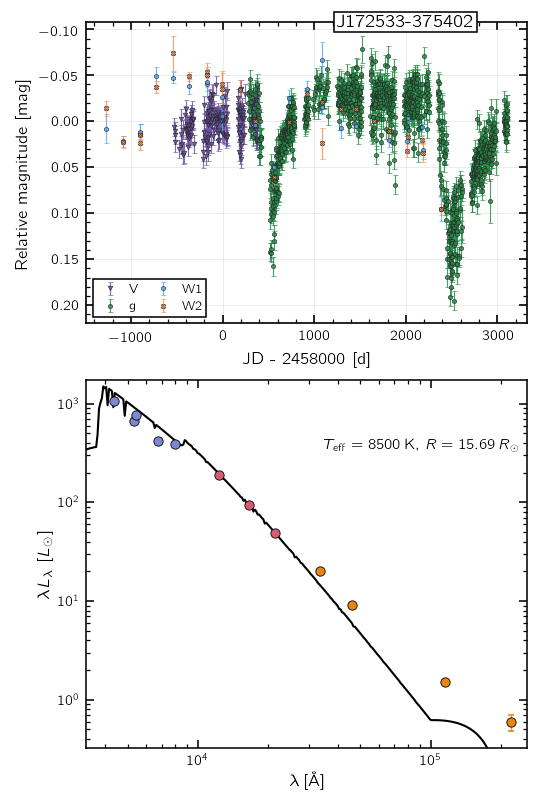

145/164  stv_463857647562  J172533-375402


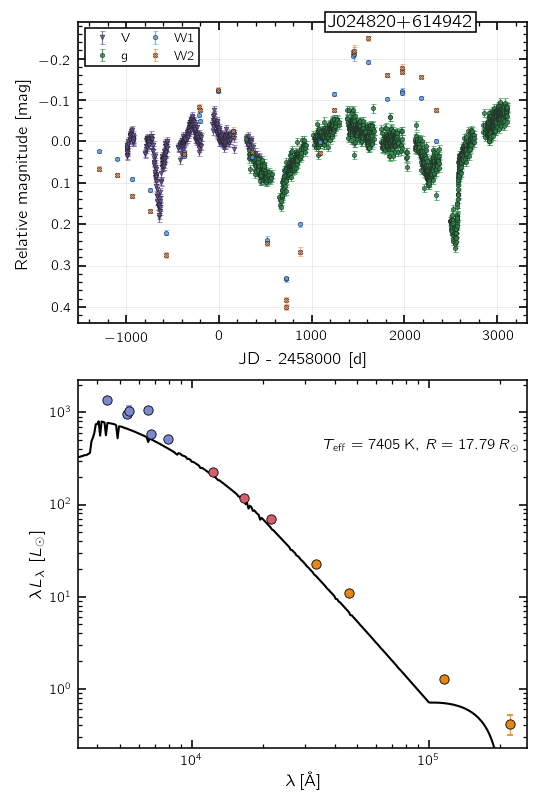

146/164  stv_111669291649  J024820+614942


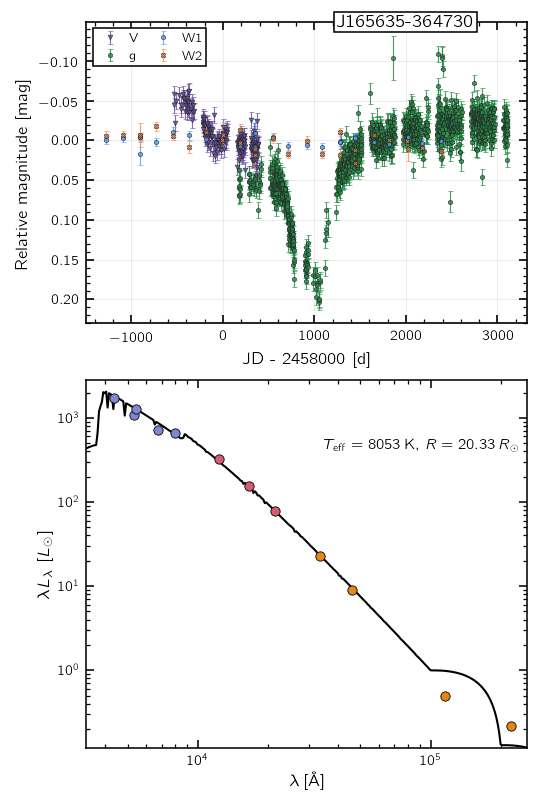

147/164  stv_498216222923  J165635-364730


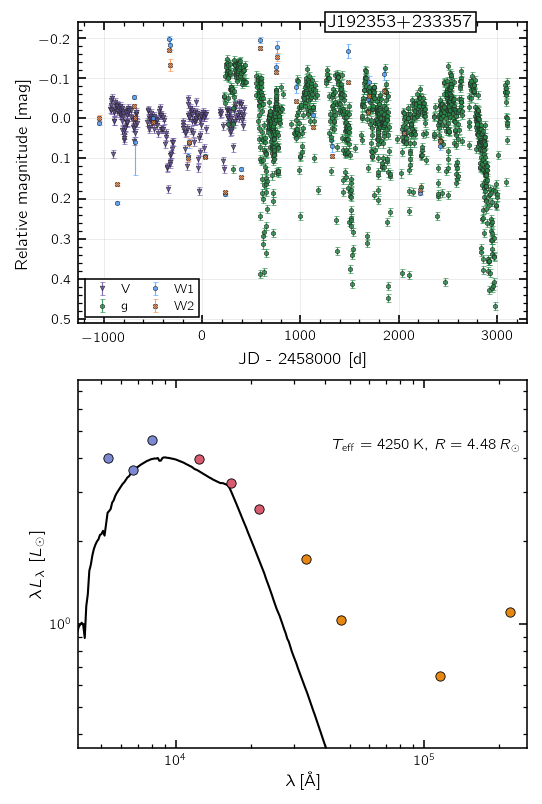

148/164  stv_240518636016  J192353+233357


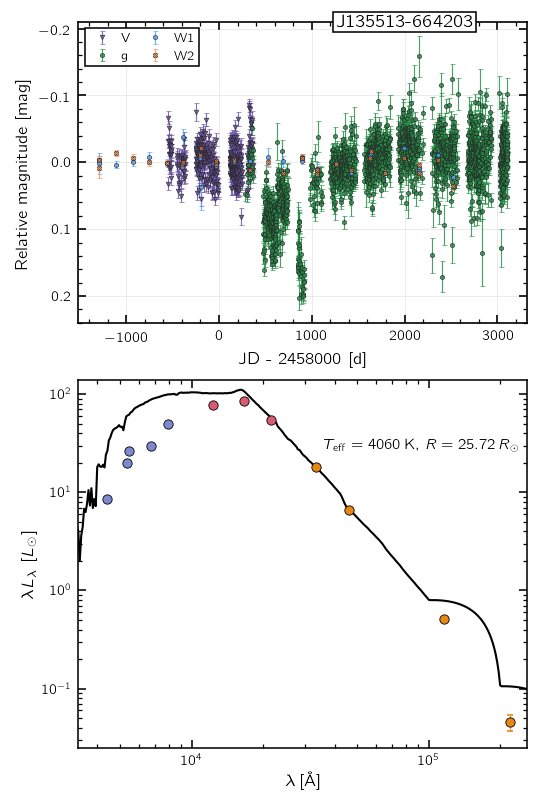

149/164  stv_446676921101  J135513-664203


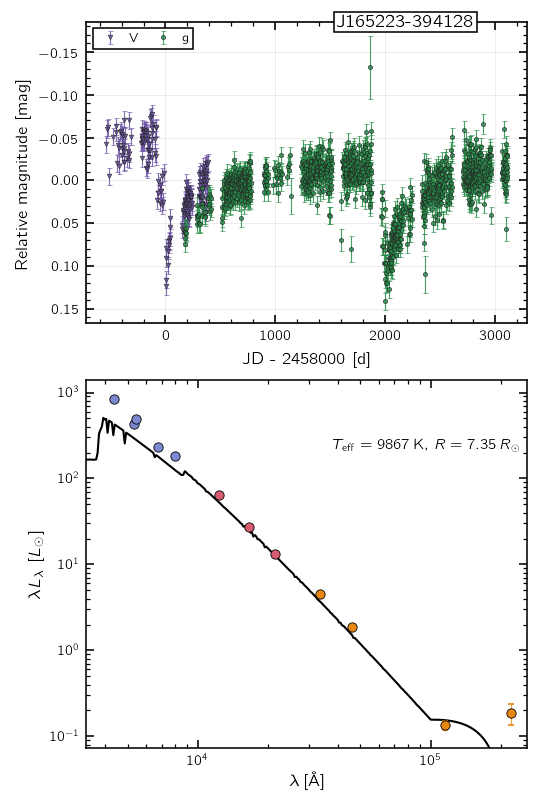

150/164  stv_549755992463  J165223-394128


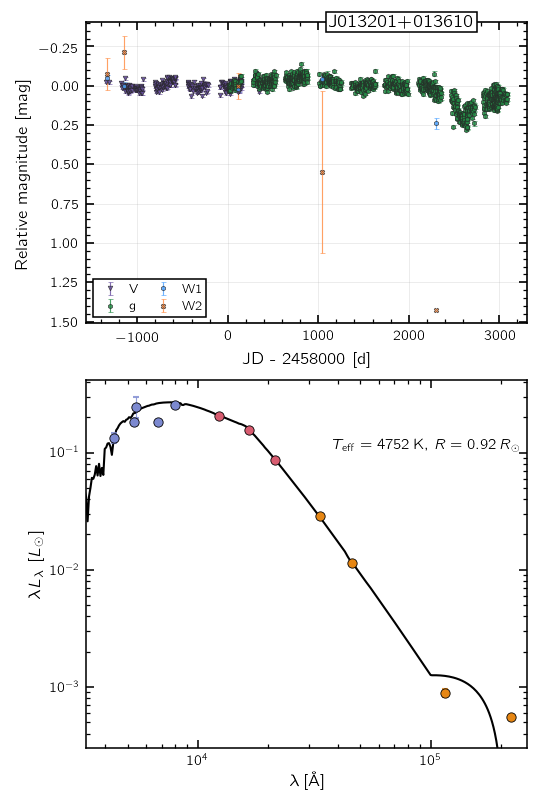

151/164  stv_223338997633  J013201+013610


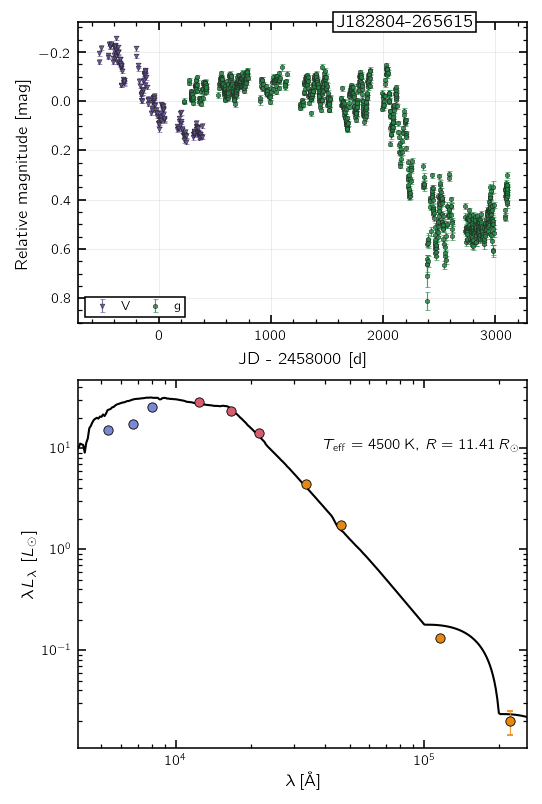

152/164  stv_523986354332  J182804-265615


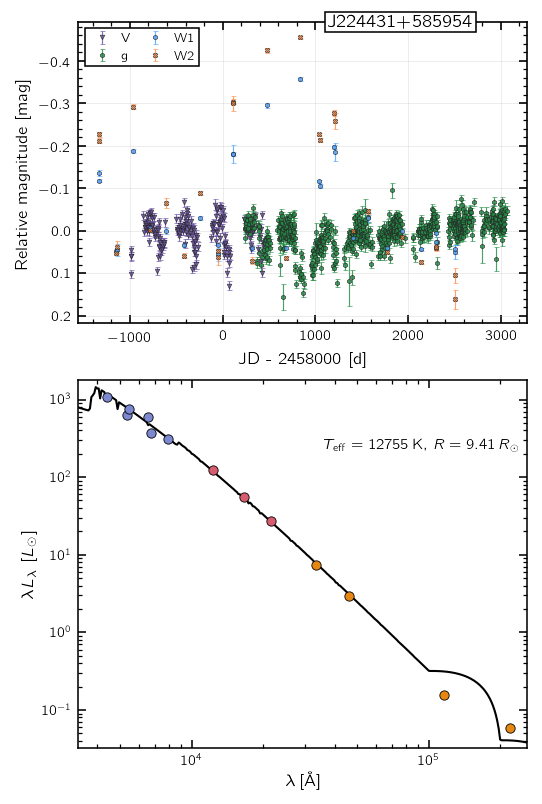

153/164  stv_25771086021  J224431+585954


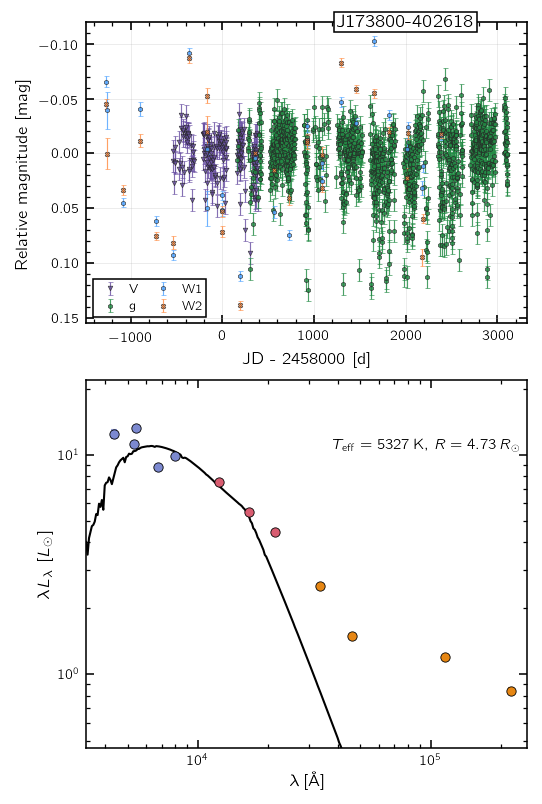

154/164  stv_481036586933  J173800-402618


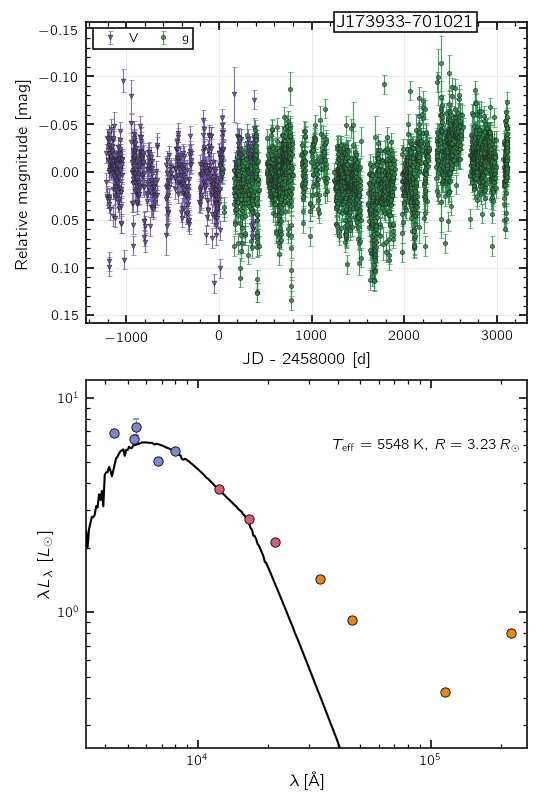

155/164  stv_532576054353  J173933-701021


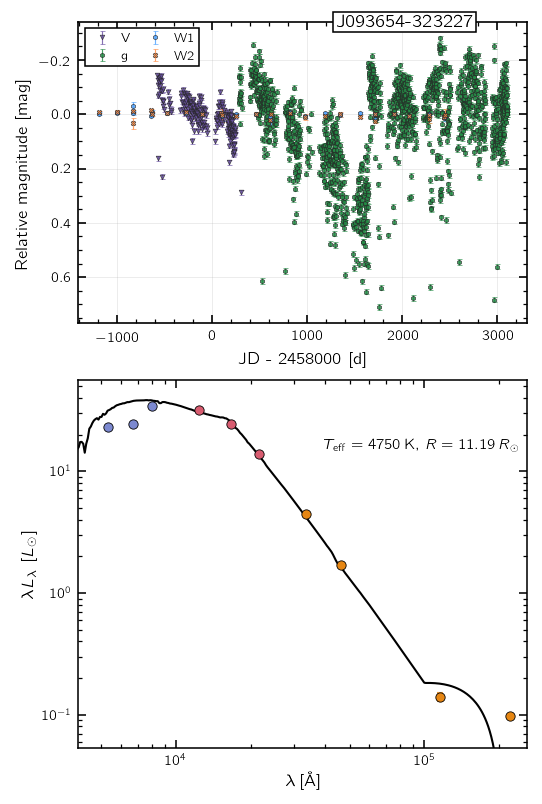

156/164  stv_592705518006  J093654-323227


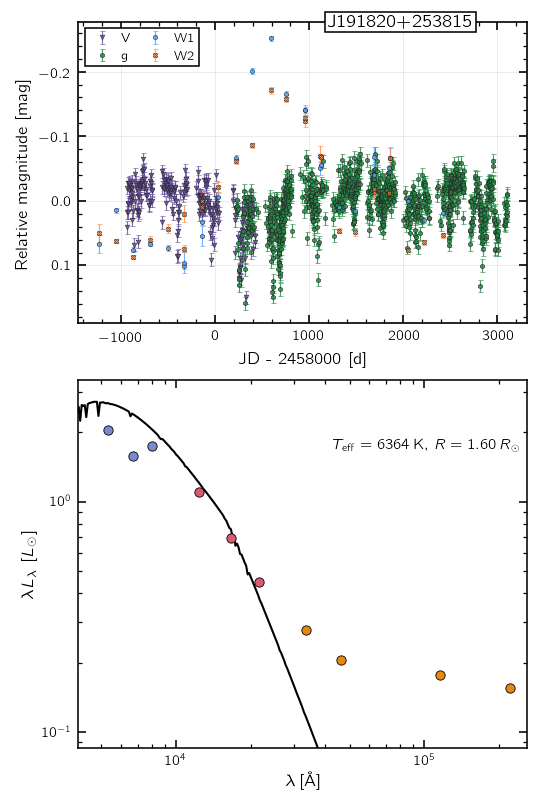

157/164  stv_146029419304  J191820+253815


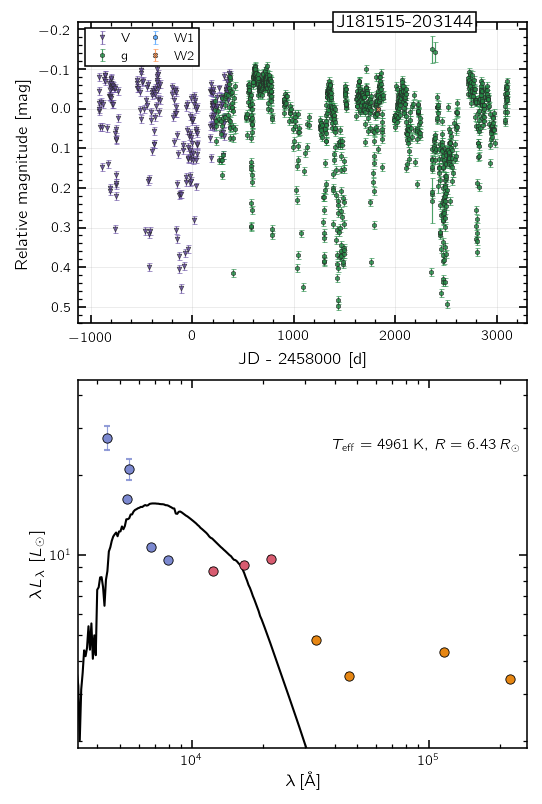

158/164  stv_369367489518  J181515-203144


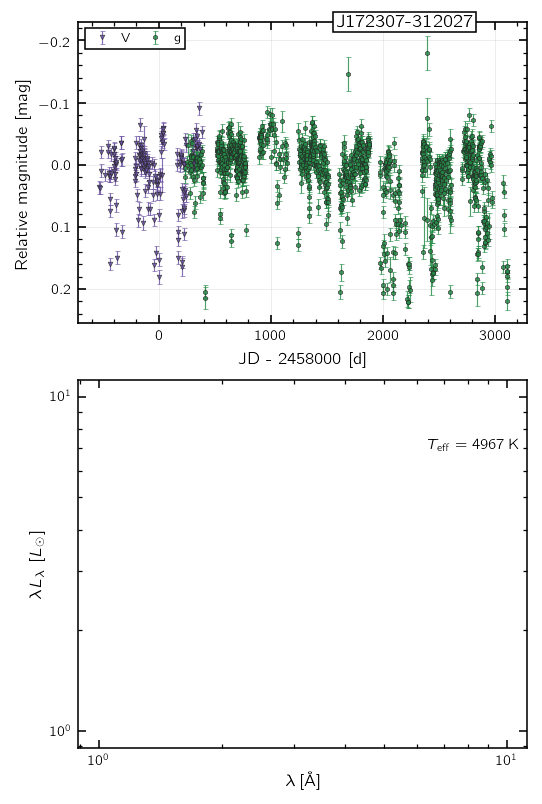

159/164  stv_515396131751  J172307-312027


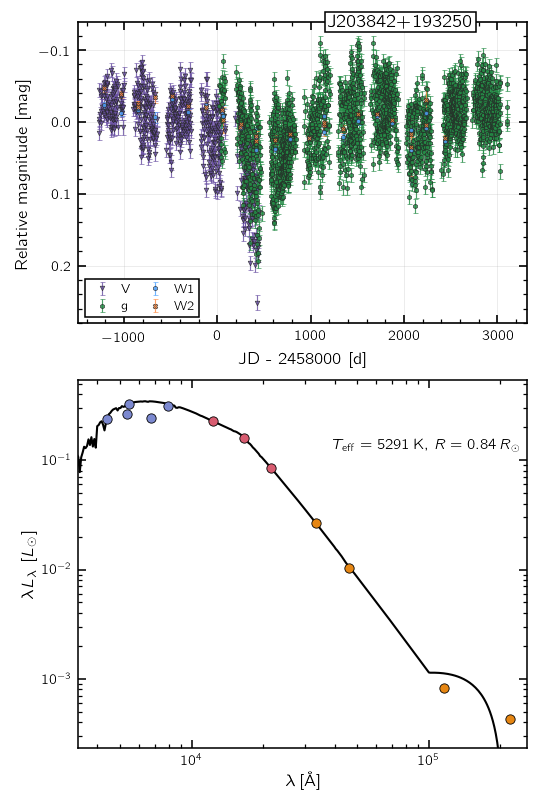

160/164  stv_206158525635  J203842+193250


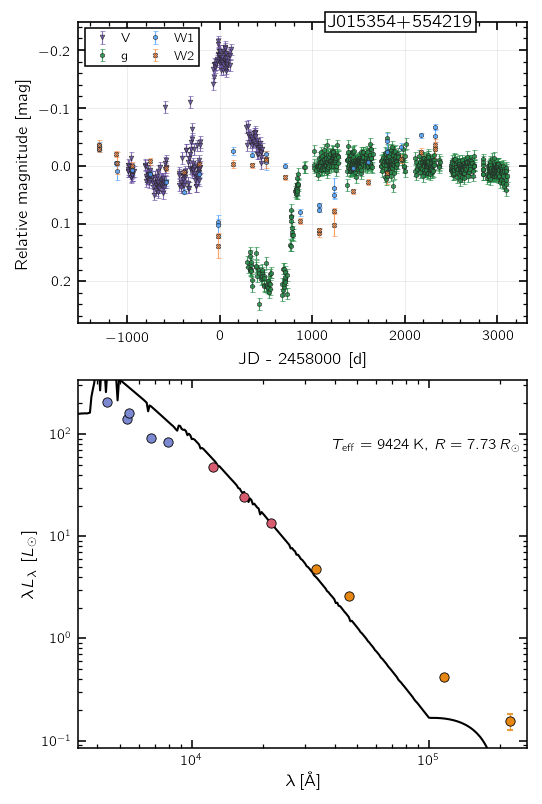

161/164  stv_111669557747  J015354+554219


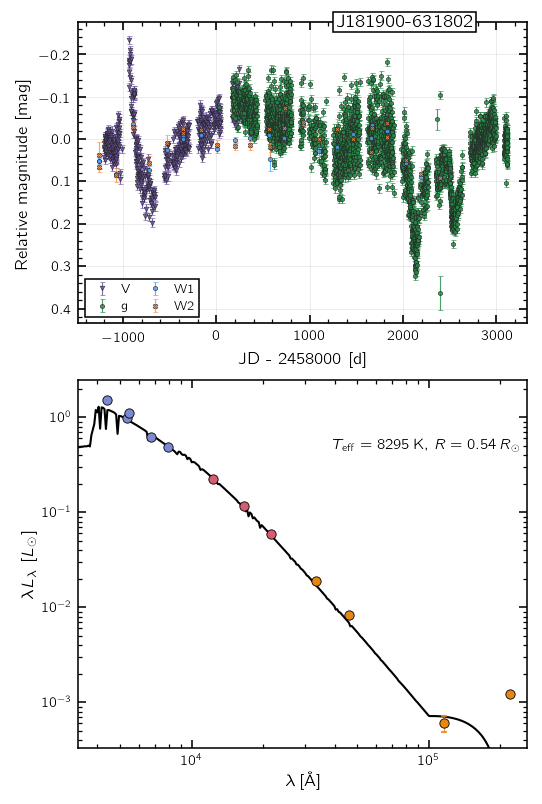

162/164  stv_644245286164  J181900-631802


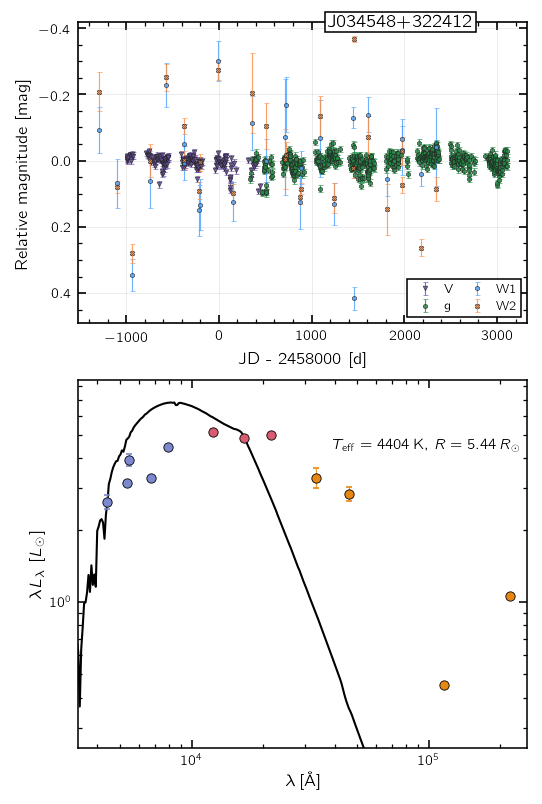

163/164  stv_94489786439  J034548+322412


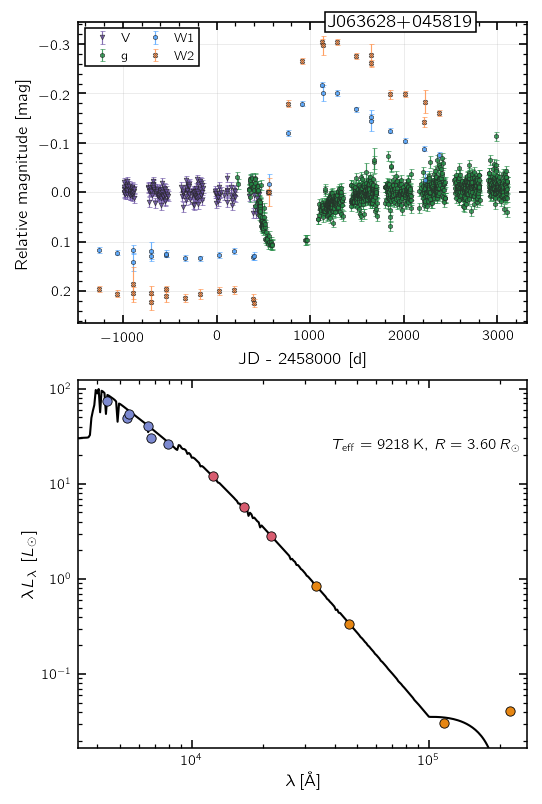

164/164  stv_180388903123  J063628+045819


In [8]:
if DISPLAY_ALL:
    display_ids = list(candidate_ids)
    if DISPLAY_LIMIT is not None:
        display_ids = display_ids[:int(DISPLAY_LIMIT)]
    for index, candidate_id in enumerate(display_ids, start=1):
        display_candidate_combined(candidate_id)
        print(f'{index}/{len(display_ids)}  {candidate_id}  {coordinate_name(candidate_id)}')
else:
    print('DISPLAY_ALL is False; no cohort figures were rendered inline.')


## Optional batch PDF export

Set `EXPORT_ALL = True` to rebuild one PDF per candidate plus the merged combined atlas. The review database remains read-only.


In [9]:
def safe_filename(value: str) -> str:
    return re.sub(r'[^A-Za-z0-9_.-]+', '_', str(value)).strip('_') or 'unknown'


def candidate_combined_pdf_bytes(
    candidate_id: str,
    atlas_writer: PdfPages | None = None,
) -> tuple[bytes, dict[str, object]]:
    fig, status = candidate_combined_figure(str(candidate_id))
    try:
        if atlas_writer is not None:
            atlas_writer.savefig(fig, dpi=300, bbox_inches='tight', pad_inches=0.06)
        buf = BytesIO()
        fig.savefig(
            buf, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0.06,
            metadata={'Creator': 'MALCA'},
        )
    finally:
        plt.close(fig)
    return buf.getvalue(), status


def export_candidate_pdfs(export_ids: list[str], *, merge_atlas: bool = True) -> pd.DataFrame:
    PDF_DIR.mkdir(parents=True, exist_ok=True)
    records = []
    atlas_path = OUTPUT_DIR / 'marked_dipper_optical_wise_sed_atlas.pdf'
    atlas_writer = PdfPages(atlas_path, metadata={'Creator': 'MALCA'}) if merge_atlas else None
    try:
        for index, candidate_id in enumerate(map(str, export_ids), start=1):
            try:
                pdf_bytes, status = candidate_combined_pdf_bytes(candidate_id, atlas_writer)
                pdf_path = PDF_DIR / f'malca_optical_wise_sed_{safe_filename(candidate_id)}.pdf'
                pdf_path.write_bytes(pdf_bytes)
                records.append({
                    'candidate_id': candidate_id,
                    'status': 'ok',
                    'pdf_path': str(pdf_path),
                    'optical_status': status['optical']['status'],
                    'wise_status': status['wise']['status'],
                    'sed_status': status['sed']['status'],
                })
            except Exception as exc:
                records.append({
                    'candidate_id': candidate_id,
                    'status': 'error',
                    'pdf_path': '',
                    'optical_status': '',
                    'wise_status': '',
                    'sed_status': '',
                    'warning': str(exc),
                })
            if index == 1 or index % 10 == 0 or index == len(export_ids):
                print(f'PDF export {index}/{len(export_ids)}')
    finally:
        if atlas_writer is not None:
            atlas_writer.close()

    manifest = pd.DataFrame(records)
    manifest_path = OUTPUT_DIR / 'marked_dipper_optical_wise_sed_pdf_manifest.csv'
    manifest.to_csv(manifest_path, index=False)

    if merge_atlas:
        print(f'Wrote atlas directly with Matplotlib: {atlas_path}')
    return manifest


if EXPORT_ALL:
    export_ids = list(candidate_ids)
    if EXPORT_LIMIT is not None:
        export_ids = export_ids[:int(EXPORT_LIMIT)]
    export_manifest = export_candidate_pdfs(export_ids, merge_atlas=MERGE_PDF_ATLAS)
    display(export_manifest)
else:
    print('EXPORT_ALL is False; no per-candidate PDFs or atlas were generated.')


PDF export 1/164
PDF export 10/164
PDF export 20/164
PDF export 30/164
PDF export 40/164
PDF export 50/164
PDF export 60/164
PDF export 70/164
PDF export 80/164
PDF export 90/164
PDF export 100/164
PDF export 110/164
PDF export 120/164
PDF export 130/164
PDF export 140/164
PDF export 150/164
PDF export 160/164
PDF export 164/164
Wrote atlas directly with Matplotlib: /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/results/marked_dipper_optical_wise_sed_atlas/marked_dipper_optical_wise_sed_atlas.pdf


,candidate_id,status,pdf_path,optical_status,wise_status,sed_status
0,stv_549756696622,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok
1,stv_292057989013,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok
2,stv_206158504352,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok
3,stv_352188453021,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok
4,stv_42950978749,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,missing,ok
...,...,...,...,...,...,...
159,stv_206158525635,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok
160,stv_111669557747,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok
161,stv_644245286164,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok
162,stv_94489786439,ok,/Users/calder/code/malca/output/runs/dat3-full...,ok,ok,ok


## Interpretation notes

- ASAS-SN and NEOWISE times are shown together as `JD - 2458000`; NEOWISE MJD values are converted as `MJD - 57999.5`.
- Each of `V`, `g`, `W1`, and `W2` is independently median-centered, so the shared panel shows relative variability rather than cross-band colors or absolute magnitudes.
- The shared light-curve panel uses the same manifest-and-alias resolver as the review UI and includes only cached NEOWISE W1/W2 epochs; historical 2010 AllWISE multiepoch points are excluded.
- A missing WISE annotation indicates missing cached multiepoch data in this run, not proof that the source was unobserved by WISE.
- The SED photosphere is the stored MALCA fit; mid-infrared excess points were not included in that optical fitting step.
